# Part 2 - Classification

## First problem

In [64]:
# Import libraries
import numpy as np
import matplotlib.pyplot as plt
from itertools import product
from sklearn.metrics import mean_squared_error
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.layers.experimental import preprocessing
import keras.backend as K
from tensorflow.keras.metrics import Metric
from sklearn.model_selection import RepeatedStratifiedKFold, StratifiedKFold

from tensorflow import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization, AveragePooling2D, Dropout
from keras.layers.advanced_activations import LeakyReLU
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score
from sklearn.metrics import fbeta_score
from keras.callbacks import Callback

from collections import Counter 
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import class_weight
from sklearn.preprocessing import StandardScaler
from keras.models import load_model

from sklearn.svm import SVC
from sklearn.cluster import KMeans

In [2]:
# Load variables
x_train_dataset = np.load('Xtrain_Classification1.npy');
y_train_dataset = np.load('Ytrain_Classification1.npy');
x_test = np.load('Xtest_Classification1.npy');

In [3]:
# check dimensions
print('X train dataset dimensions = ', x_train_dataset.shape)
print('Y train dataset dimensions = ', y_train_dataset.shape)
print('X test dataset dimensions = ', x_test.shape)

X train dataset dimensions =  (8273, 2700)
Y train dataset dimensions =  (8273,)
X test dataset dimensions =  (1367, 2700)


Classified as:  1


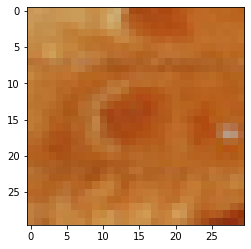

Classified as:  0


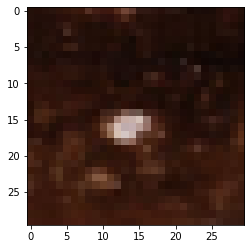

Classified as:  1


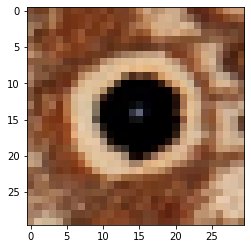

Classified as:  1


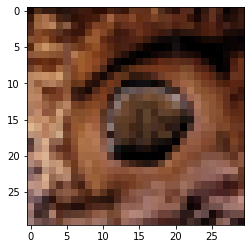

In [4]:
# Show image i
image_idx = [0, 1, 2, 3]
for i in image_idx:
    print("Classified as: ", y_train_dataset[i])
    image = x_train_dataset[i,:]
    image = image.reshape(30, 30, 3)
    plt.imshow(image, cmap = 'cividis')
    plt.show()

In [5]:
print(Counter(y_train_dataset))

print("Number of spot samples = ", (y_train_dataset == 0.0).sum(), " ", (y_train_dataset == 0.0).sum()/len(y_train_dataset), "%")
print("Number of eyespot samples = ", (y_train_dataset == 1.0).sum(), " ", (y_train_dataset == 1.0).sum()/len(y_train_dataset), "%")

Counter({0: 5142, 1: 3131})
Number of spot samples =  5142   0.6215399492324429 %
Number of eyespot samples =  3131   0.3784600507675571 %


In [6]:
def binary_fbeta(ytrue, ypred, beta=1, threshold=0.5, epsilon=1e-7):
    # epsilon is set so as to avoid division by zero error
    
    beta_squared = beta**2 # squaring beta

    # casting ytrue and ypred as float dtype
    ytrue = tf.cast(ytrue, tf.float32)
    ypred = tf.cast(ypred, tf.float32)

    # setting values of ypred greater than the set threshold to 1 while those lesser to 0
    ypred = tf.cast(tf.greater_equal(ypred, tf.constant(threshold)), tf.float32)

    tp = tf.reduce_sum(ytrue*ypred) # calculating true positives
    predicted_positive = tf.reduce_sum(ypred) # calculating predicted positives
    actual_positive = tf.reduce_sum(ytrue) # calculating actual positives
    
    precision = tp/(predicted_positive+epsilon) # calculating precision
    recall = tp/(actual_positive+epsilon) # calculating recall
    
    # calculating fbeta
    fb = (1+beta_squared)*precision*recall / (beta_squared*precision + recall + epsilon)

    return fb

In [ ]:
nfolds = 10
nrepeats = 3

def cross_val(model, architecture, X, Y, nfolds, nrepeats, epochs, BATCH_SIZE, patience):
    
    n_scores = []
    
    #rkf = RepeatedStratifiedKFold(n_splits = nfolds, n_repeats = nrepeats, random_state = 1)
    
    skf = StratifiedKFold(n_splits = nfolds) 
    
    for train_index, test_index in skf.split(X, Y):
        Xtrain, Ytrain = X[train_index], Y[train_index]
        Xtest, Ytest = X[test_index], Y[test_index]
        
        score = model(architecture, Xtrain, Ytrain, Xtest, Ytest, epochs, BATCH_SIZE, patience)
                
        n_scores.append(score)
    
    mean_scores = np.mean(n_scores)
    std_scores = np.std(n_scores)

    return mean_scores, std_scores

## 1. Multilayer Perceptrons

In [85]:
def multilayer_perceptron(model, x_train_dataset, y_train_dataset, epochs, BATCH_SIZE, patience):
    
    class_names = ['Spot', 'EyeSpot']
    
    # Normalize the dataset (re-scaling the data)
    x_train_dataset_n = x_train_dataset / 255.0
    
    # Cross-validation:
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    # Convert labels into one-hot-encoding format
    Ytrain = to_categorical(Ytrain)
    Ytest = to_categorical(Ytest)
    
    # Define patience    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
    
    mc = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_binary_fbeta', mode='max', verbose=1, save_best_only=True)
    
    # tf.keras.optimizers.SGD 
    model.compile(optimizer='sgd',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  metrics=[binary_fbeta])
    
    history = model.fit(Xtrain, Ytrain, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[es, mc], validation_data=(Xtest, Ytest))
    
    saved_model = load_model('best_model.h5', custom_objects={"binary_fbeta": binary_fbeta})
        
    test_loss, test_acc = saved_model.evaluate(Xtest,  Ytest, verbose=1)

    print('\nTest f1-score:', test_acc)
    
    # predicting the testing set
    binary_ypred = saved_model.predict(Xtest)

    # one_hot encoding predictions 
    binary_ypred = np.array(binary_ypred >= 0.5, dtype=np.float32)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=history.history['binary_fbeta']
    tloss=history.history['loss']
    vacc=history.history['val_binary_fbeta']
    vloss=history.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training f1 score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation f1 score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation F1 score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('F1 score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    
    clr = classification_report(Ytest, binary_ypred, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    # -------------------
    return test_acc

Epoch 1/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5799 - binary_fbeta: 0.6745 - val_loss: 0.5331 - val_binary_fbeta: 0.7368

Epoch 00001: val_binary_fbeta improved from -inf to 0.73678, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5435 - binary_fbeta: 0.7112 - val_loss: 0.5172 - val_binary_fbeta: 0.7454

Epoch 00002: val_binary_fbeta improved from 0.73678 to 0.74535, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5286 - binary_fbeta: 0.7295 - val_loss: 0.5073 - val_binary_fbeta: 0.7600

Epoch 00003: val_binary_fbeta improved from 0.74535 to 0.76002, saving model to best_model.h5
Epoch 4/100
117/117 [==============================] - 3s 29ms/step - loss: 0.5180 - binary_fbeta: 0.7294 - val_loss: 0.4942 - val_binary_fbeta: 0.7598 0s - loss: 0.5214 - binary_fbeta: 0.72 - ETA: 0s - loss: 0.5218 - bina - ETA: 0s - loss: 0.5223 - binary - ETA: 0

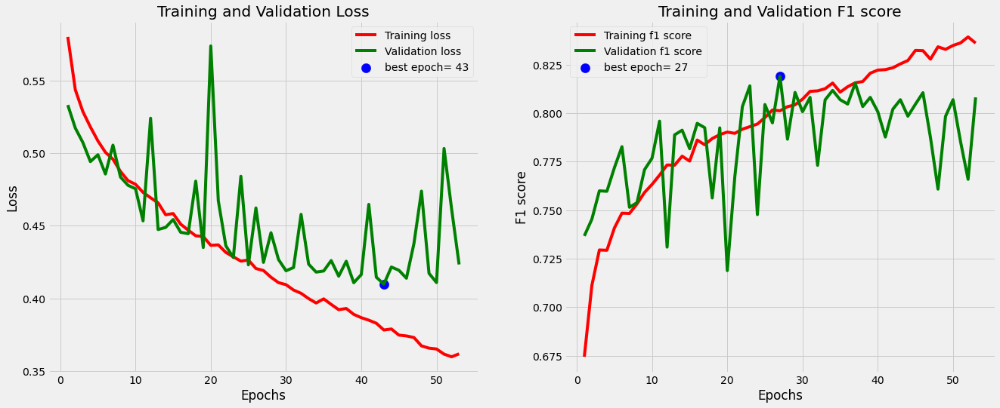

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.83      0.85       515
     EyeSpot       0.74      0.80      0.77       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.81      0.81      0.81       828
weighted avg       0.82      0.82      0.82       828
 samples avg       0.82      0.82      0.82       828

Epoch 1/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5792 - binary_fbeta: 0.6848 - val_loss: 0.6497 - val_binary_fbeta: 0.6560

Epoch 00001: val_binary_fbeta improved from -inf to 0.65601, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5455 - binary_fbeta: 0.7142 - val_loss: 0.5457 - val_binary_fbeta: 0.6971

Epoch 00002: val_binary_fbeta improved from 0.65601 to 0.69712, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5329 -

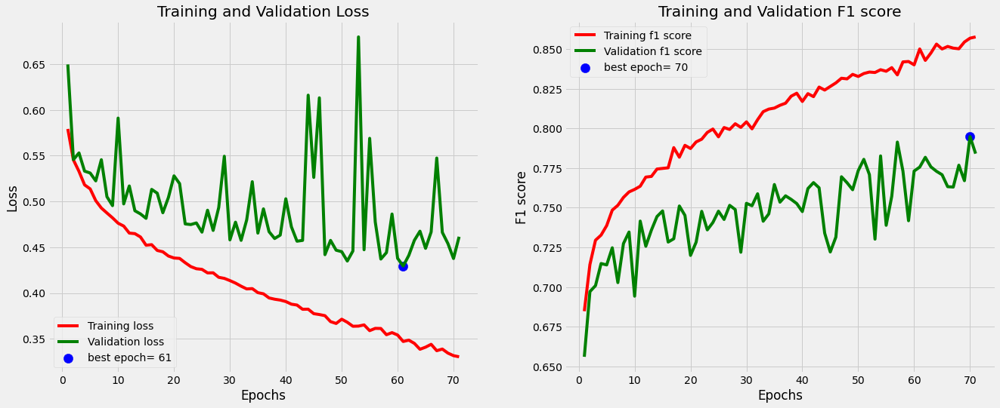

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.90      0.84       515
     EyeSpot       0.78      0.63      0.70       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.79      0.76      0.77       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 1s 8ms/step - loss: 0.5867 - binary_fbeta: 0.6798 - val_loss: 0.5423 - val_binary_fbeta: 0.7139

Epoch 00001: val_binary_fbeta improved from -inf to 0.71386, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 0s 4ms/step - loss: 0.5413 - binary_fbeta: 0.7149 - val_loss: 0.5355 - val_binary_fbeta: 0.7127

Epoch 00002: val_binary_fbeta did not improve from 0.71386
Epoch 3/100
117/117 [==============================] - 0s 4ms/step - loss: 0.5262 - binary_fbeta: 0.7241 - val_loss: 0

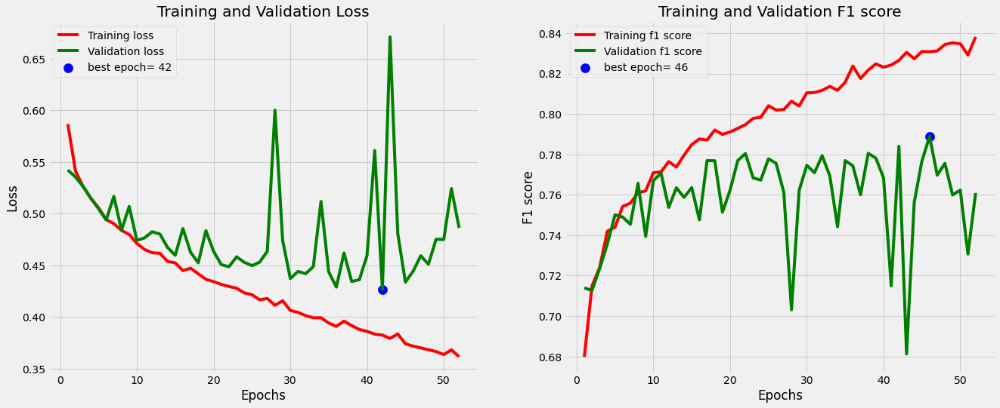

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.76      0.82       515
     EyeSpot       0.68      0.84      0.75       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.78      0.80      0.78       828
weighted avg       0.81      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 1s 8ms/step - loss: 0.5853 - binary_fbeta: 0.6714 - val_loss: 0.5567 - val_binary_fbeta: 0.7091

Epoch 00001: val_binary_fbeta improved from -inf to 0.70913, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5464 - binary_fbeta: 0.7047 - val_loss: 0.6288 - val_binary_fbeta: 0.6526

Epoch 00002: val_binary_fbeta did not improve from 0.70913
Epoch 3/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5295 - binary_fbeta: 0.7226 - val_loss: 0

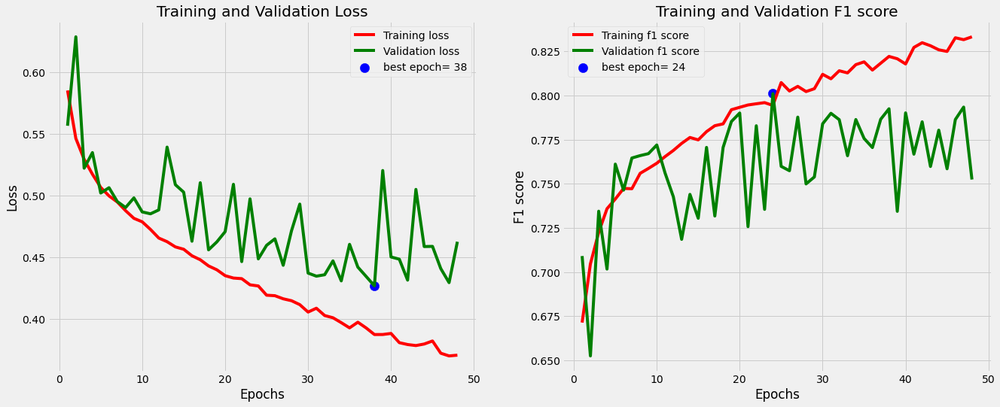

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.91      0.85       515
     EyeSpot       0.81      0.61      0.70       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.80      0.76      0.78       828
weighted avg       0.80      0.80      0.79       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5885 - binary_fbeta: 0.6772 - val_loss: 0.5607 - val_binary_fbeta: 0.7200

Epoch 00001: val_binary_fbeta improved from -inf to 0.72003, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5521 - binary_fbeta: 0.7088 - val_loss: 0.5468 - val_binary_fbeta: 0.7235

Epoch 00002: val_binary_fbeta improved from 0.72003 to 0.72348, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5335 -

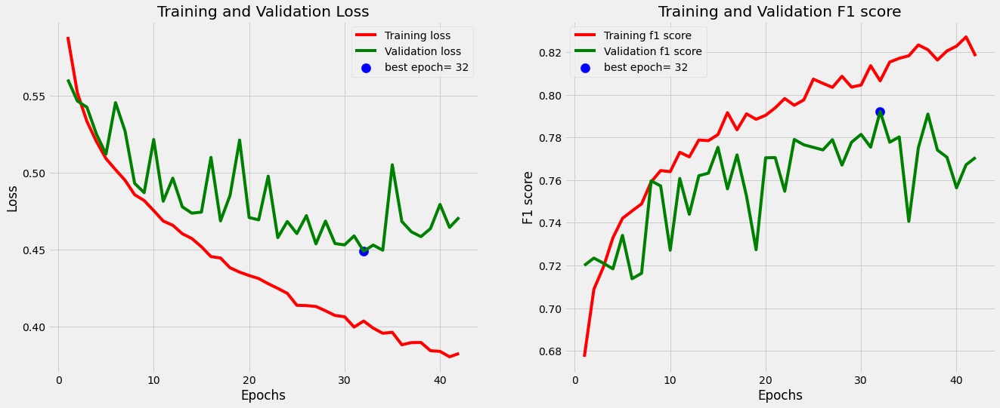

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.83      0.83      0.83       515
     EyeSpot       0.73      0.72      0.72       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.78      0.78      0.78       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828


 
Model performance (f1 score) =  0.7948144674301147


In [87]:
f1_scores = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel performance (f1 score) = ", f1score)

Epoch 1/100
117/117 [==============================] - 4s 22ms/step - loss: 0.5927 - binary_fbeta: 0.6672 - val_loss: 0.5773 - val_binary_fbeta: 0.6835

Epoch 00001: val_binary_fbeta improved from -inf to 0.68349, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 3s 24ms/step - loss: 0.5456 - binary_fbeta: 0.7067 - val_loss: 0.5736 - val_binary_fbeta: 0.6932loss: 0.5511 - binary_fbeta: 0.70 - ETA: 1s - loss: 0.5525 - binary_fbeta - ETA:  - ETA: 0s - loss: 0.5486 - binary

Epoch 00002: val_binary_fbeta improved from 0.68349 to 0.69319, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 3s 23ms/step - loss: 0.5326 - binary_fbeta: 0.7186 - val_loss: 0.5595 - val_binary_fbeta: 0.7101

Epoch 00003: val_binary_fbeta improved from 0.69319 to 0.71010, saving model to best_model.h5
Epoch 4/100
117/117 [==============================] - 2s 19ms/step - loss: 0.5262 - binary_fbeta: 0.7218 - val_loss: 0.5639 - val_binary_fbeta: 0.

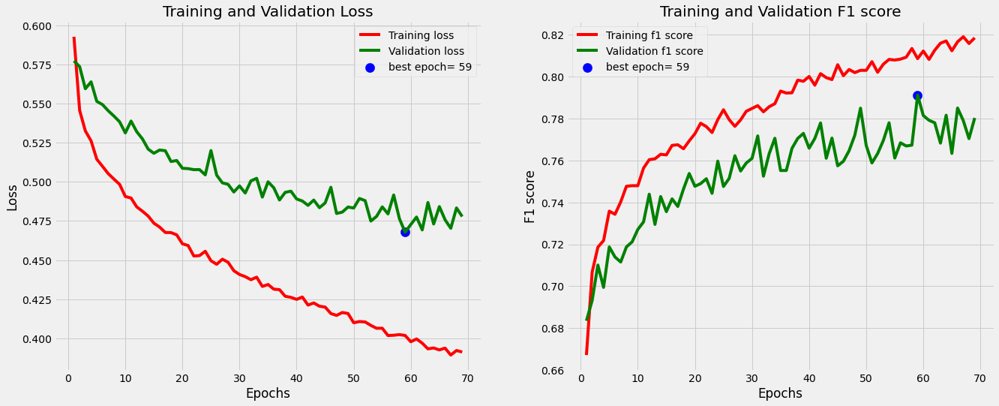

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.85      0.84       515
     EyeSpot       0.74      0.69      0.71       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.78      0.77      0.77       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 2s 10ms/step - loss: 0.6021 - binary_fbeta: 0.6641 - val_loss: 0.5567 - val_binary_fbeta: 0.6990

Epoch 00001: val_binary_fbeta improved from -inf to 0.69904, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5575 - binary_fbeta: 0.6936 - val_loss: 0.5302 - val_binary_fbeta: 0.7220

Epoch 00002: val_binary_fbeta improved from 0.69904 to 0.72196, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5427 

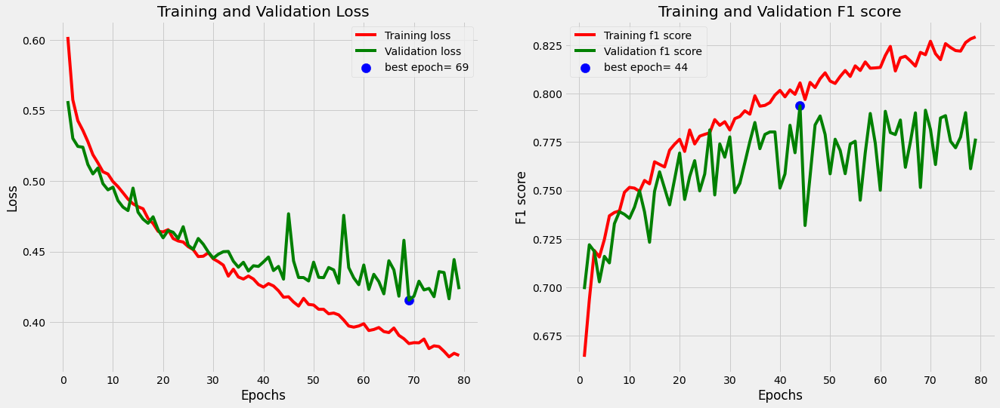

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.83      0.84      0.84       515
     EyeSpot       0.74      0.71      0.72       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.78      0.78      0.78       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 3s 17ms/step - loss: 0.6140 - binary_fbeta: 0.6590 - val_loss: 0.5708 - val_binary_fbeta: 0.6831

Epoch 00001: val_binary_fbeta improved from -inf to 0.68309, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 11ms/step - loss: 0.5574 - binary_fbeta: 0.7012 - val_loss: 0.5580 - val_binary_fbeta: 0.6818

Epoch 00002: val_binary_fbeta did not improve from 0.68309
Epoch 3/100
117/117 [==============================] - 2s 13ms/step - loss: 0.5439 - binary_fbeta: 0.7125 - val_loss

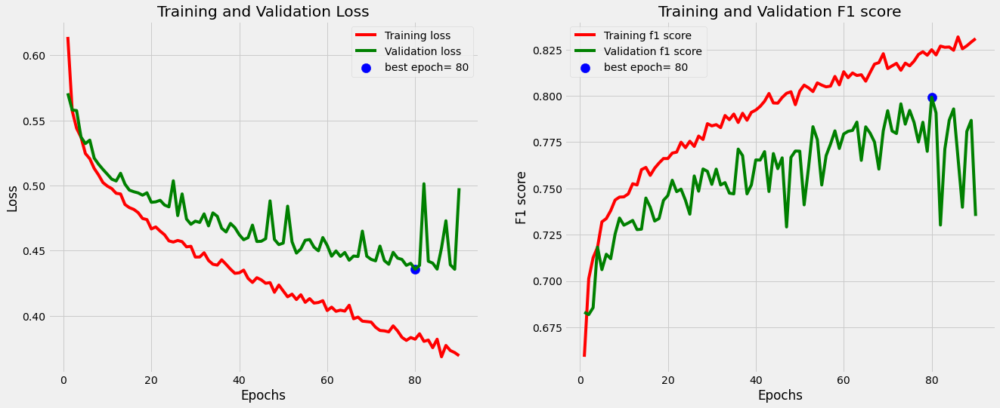

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.87      0.84       515
     EyeSpot       0.77      0.68      0.72       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.79      0.78      0.78       828
weighted avg       0.80      0.80      0.80       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 2s 8ms/step - loss: 0.5997 - binary_fbeta: 0.6609 - val_loss: 0.5446 - val_binary_fbeta: 0.6967

Epoch 00001: val_binary_fbeta improved from -inf to 0.69671, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5575 - binary_fbeta: 0.6983 - val_loss: 0.5287 - val_binary_fbeta: 0.7281

Epoch 00002: val_binary_fbeta improved from 0.69671 to 0.72812, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5423 -

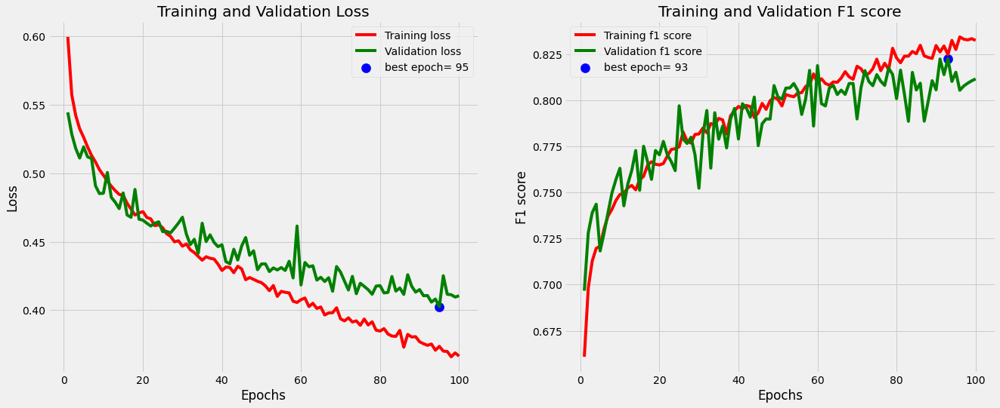

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.87      0.86       515
     EyeSpot       0.77      0.75      0.76       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.81      0.81      0.81       828
weighted avg       0.82      0.82      0.82       828
 samples avg       0.82      0.82      0.82       828

Epoch 1/100
117/117 [==============================] - 2s 9ms/step - loss: 0.6056 - binary_fbeta: 0.6569 - val_loss: 0.6026 - val_binary_fbeta: 0.6615

Epoch 00001: val_binary_fbeta improved from -inf to 0.66154, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5584 - binary_fbeta: 0.6968 - val_loss: 0.5280 - val_binary_fbeta: 0.7329

Epoch 00002: val_binary_fbeta improved from 0.66154 to 0.73293, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5475 -

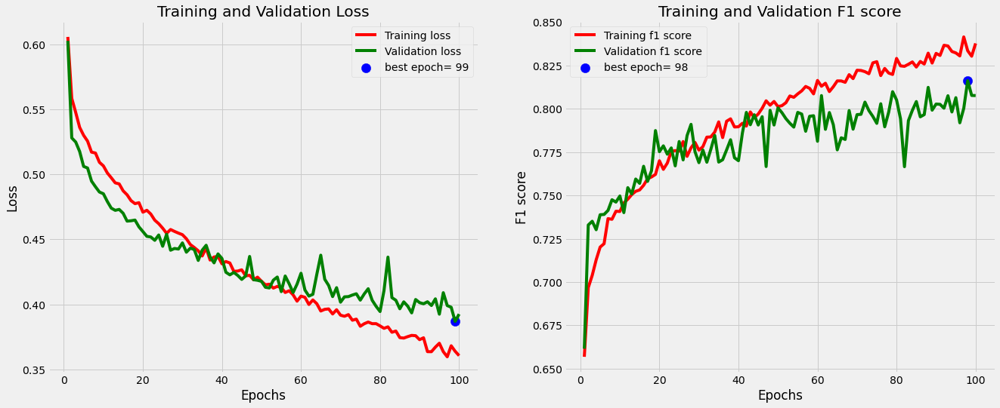

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.81      0.91      0.86       515
     EyeSpot       0.82      0.66      0.73       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.82      0.79      0.80       828
weighted avg       0.82      0.82      0.81       828
 samples avg       0.82      0.82      0.82       828


 
Model Performance (f1-score) =  0.798763632774353


In [88]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(0.5), 
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1-score) = ", f1score)

Epoch 1/100
117/117 [==============================] - 2s 13ms/step - loss: 0.5946 - binary_fbeta: 0.6720 - val_loss: 0.5565 - val_binary_fbeta: 0.7178

Epoch 00001: val_binary_fbeta improved from -inf to 0.71779, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 20ms/step - loss: 0.5464 - binary_fbeta: 0.7119 - val_loss: 0.5609 - val_binary_fbeta: 0.7177

Epoch 00002: val_binary_fbeta did not improve from 0.71779
Epoch 3/100
117/117 [==============================] - 2s 16ms/step - loss: 0.5298 - binary_fbeta: 0.7251 - val_loss: 0.5223 - val_binary_fbeta: 0.7276

Epoch 00003: val_binary_fbeta improved from 0.71779 to 0.72756, saving model to best_model.h5
Epoch 4/100
117/117 [==============================] - 1s 11ms/step - loss: 0.5127 - binary_fbeta: 0.7410 - val_loss: 0.6348 - val_binary_fbeta: 0.6584

Epoch 00004: val_binary_fbeta did not improve from 0.72756
Epoch 5/100
117/117 [==============================] - 1s 9ms/step - loss: 0.5034 - b

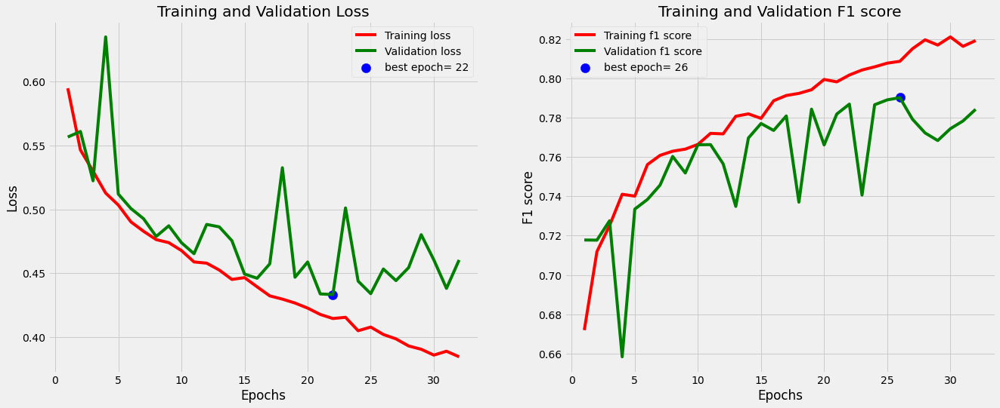

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.78      0.93      0.85       515
     EyeSpot       0.83      0.56      0.67       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.80      0.74      0.76       828
weighted avg       0.80      0.79      0.78       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 2s 8ms/step - loss: 0.6012 - binary_fbeta: 0.6744 - val_loss: 0.5462 - val_binary_fbeta: 0.7149

Epoch 00001: val_binary_fbeta improved from -inf to 0.71490, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5547 - binary_fbeta: 0.7132 - val_loss: 0.5243 - val_binary_fbeta: 0.7245

Epoch 00002: val_binary_fbeta improved from 0.71490 to 0.72452, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 9ms/step - loss: 0.5360 -

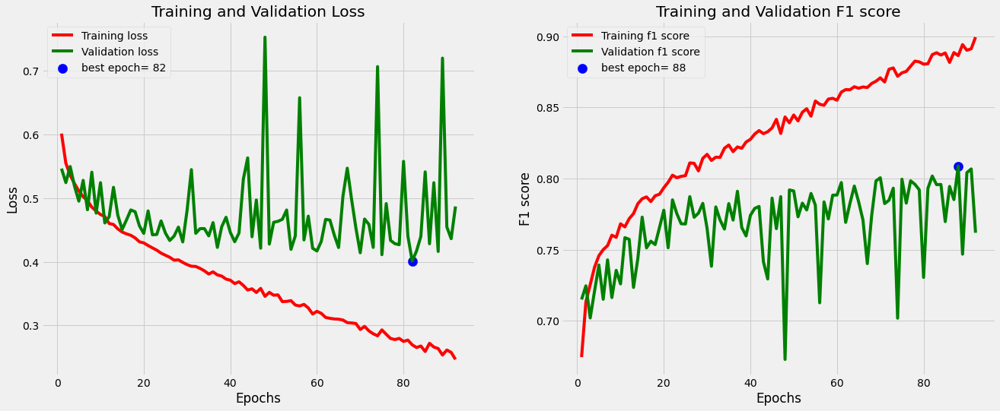

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.89      0.85       515
     EyeSpot       0.79      0.68      0.73       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.80      0.78      0.79       828
weighted avg       0.81      0.81      0.81       828
 samples avg       0.81      0.81      0.81       828

Epoch 1/100
117/117 [==============================] - 2s 12ms/step - loss: 0.5879 - binary_fbeta: 0.6744 - val_loss: 0.5479 - val_binary_fbeta: 0.7016

Epoch 00001: val_binary_fbeta improved from -inf to 0.70160, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5484 - binary_fbeta: 0.7091 - val_loss: 0.5386 - val_binary_fbeta: 0.6931

Epoch 00002: val_binary_fbeta did not improve from 0.70160
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5288 - binary_fbeta: 0.7302 - val_loss: 

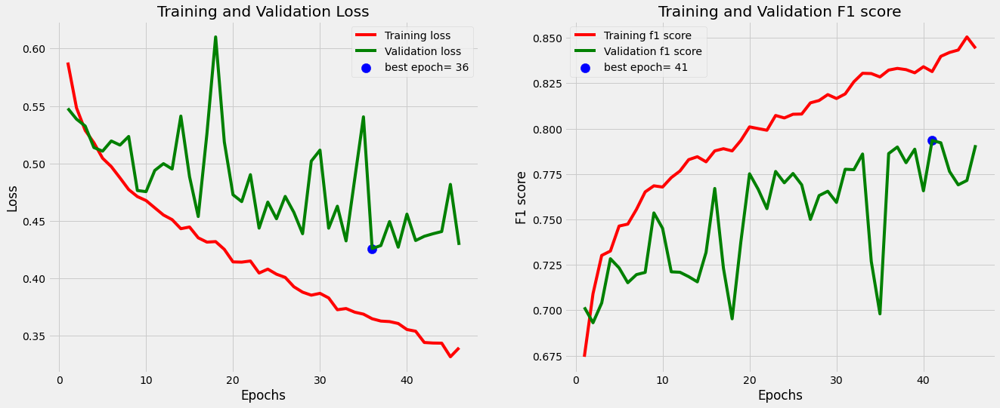

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.88      0.84       515
     EyeSpot       0.77      0.65      0.70       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.79      0.76      0.77       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 3s 16ms/step - loss: 0.5835 - binary_fbeta: 0.6725 - val_loss: 0.5807 - val_binary_fbeta: 0.6696

Epoch 00001: val_binary_fbeta improved from -inf to 0.66955, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 13ms/step - loss: 0.5415 - binary_fbeta: 0.7112 - val_loss: 0.5633 - val_binary_fbeta: 0.7174

Epoch 00002: val_binary_fbeta improved from 0.66955 to 0.71739, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 14ms/step - loss: 0.523

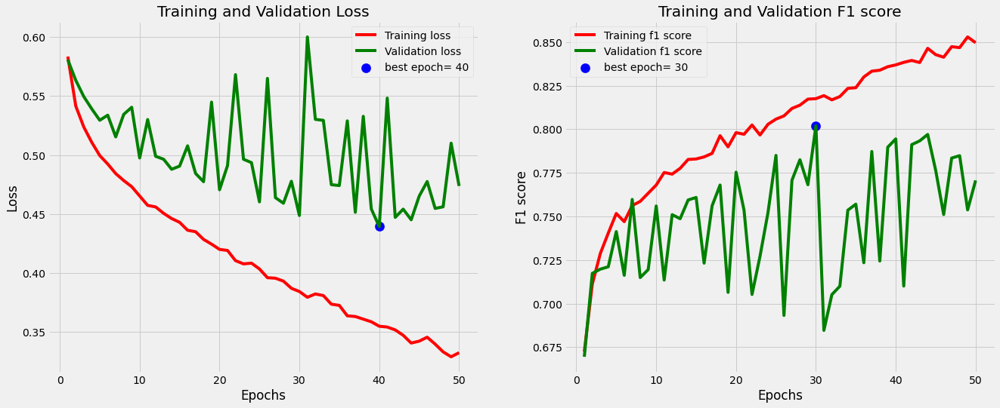

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.88      0.85       515
     EyeSpot       0.77      0.68      0.72       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.79      0.78      0.78       828
weighted avg       0.80      0.80      0.80       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 3s 19ms/step - loss: 0.5852 - binary_fbeta: 0.6805 - val_loss: 0.5534 - val_binary_fbeta: 0.6833

Epoch 00001: val_binary_fbeta improved from -inf to 0.68333, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 17ms/step - loss: 0.5460 - binary_fbeta: 0.7116 - val_loss: 0.5377 - val_binary_fbeta: 0.7124

Epoch 00002: val_binary_fbeta improved from 0.68333 to 0.71242, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 16ms/step - loss: 0.528

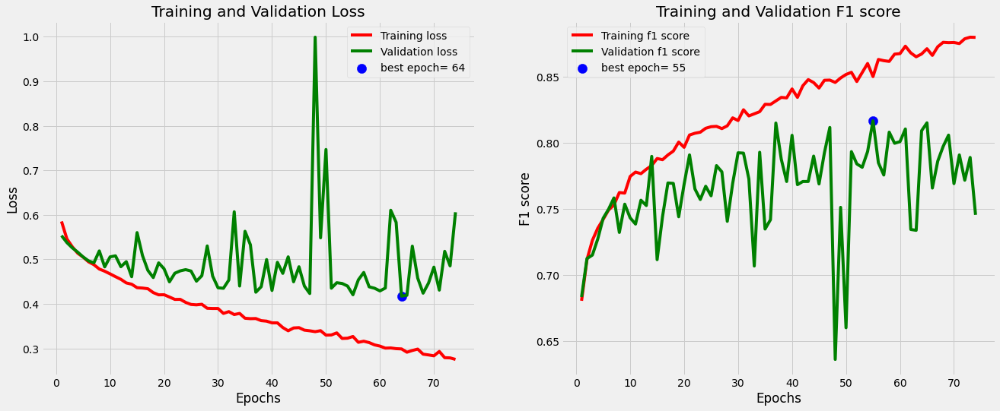

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.90      0.86       515
     EyeSpot       0.81      0.67      0.73       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.81      0.79      0.80       828
weighted avg       0.82      0.82      0.81       828
 samples avg       0.82      0.82      0.82       828

Model Performance (f1 score) =  0.8011674880981445


In [89]:
f1_scores = []
for i in range(5):
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/100
117/117 [==============================] - 3s 18ms/step - loss: 0.5827 - binary_fbeta: 0.6918 - val_loss: 0.5313 - val_binary_fbeta: 0.7284

Epoch 00001: val_binary_fbeta improved from -inf to 0.72845, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 14ms/step - loss: 0.5373 - binary_fbeta: 0.7286 - val_loss: 0.5935 - val_binary_fbeta: 0.6599

Epoch 00002: val_binary_fbeta did not improve from 0.72845
Epoch 3/100
117/117 [==============================] - 2s 18ms/step - loss: 0.5233 - binary_fbeta: 0.7353 - val_loss: 0.5823 - val_binary_fbeta: 0.6833

Epoch 00003: val_binary_fbeta did not improve from 0.72845
Epoch 4/100
117/117 [==============================] - 3s 22ms/step - loss: 0.5135 - binary_fbeta: 0.7428 - val_loss: 0.4900 - val_binary_fbeta: 0.7564

Epoch 00004: val_binary_fbeta improved from 0.72845 to 0.75641, saving model to best_model.h5
Epoch 5/100
117/117 [==============================] - 2s 13ms/step - loss: 0.5022 - 

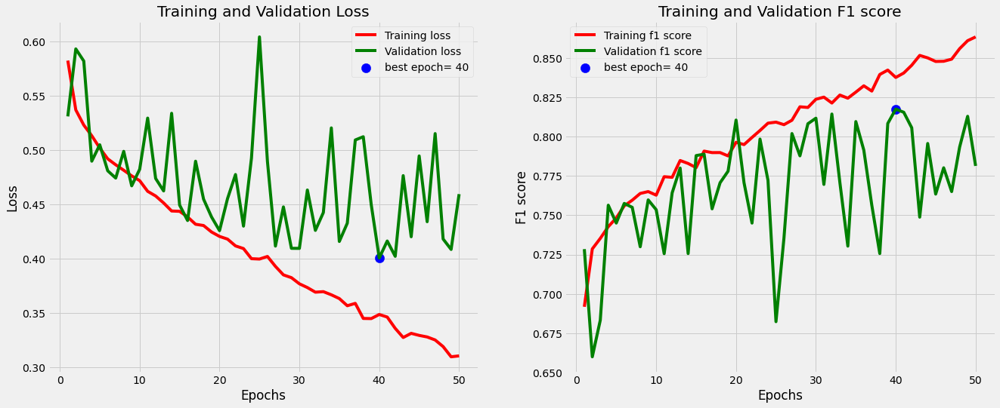

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.83      0.85       515
     EyeSpot       0.74      0.81      0.77       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.81      0.82      0.81       828
weighted avg       0.82      0.82      0.82       828
 samples avg       0.82      0.82      0.82       828

Epoch 1/100
117/117 [==============================] - 3s 15ms/step - loss: 0.5855 - binary_fbeta: 0.6828 - val_loss: 0.5616 - val_binary_fbeta: 0.6833

Epoch 00001: val_binary_fbeta improved from -inf to 0.68325, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 14ms/step - loss: 0.5418 - binary_fbeta: 0.7168 - val_loss: 0.5312 - val_binary_fbeta: 0.7135

Epoch 00002: val_binary_fbeta improved from 0.68325 to 0.71346, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 16ms/step - loss: 0.525

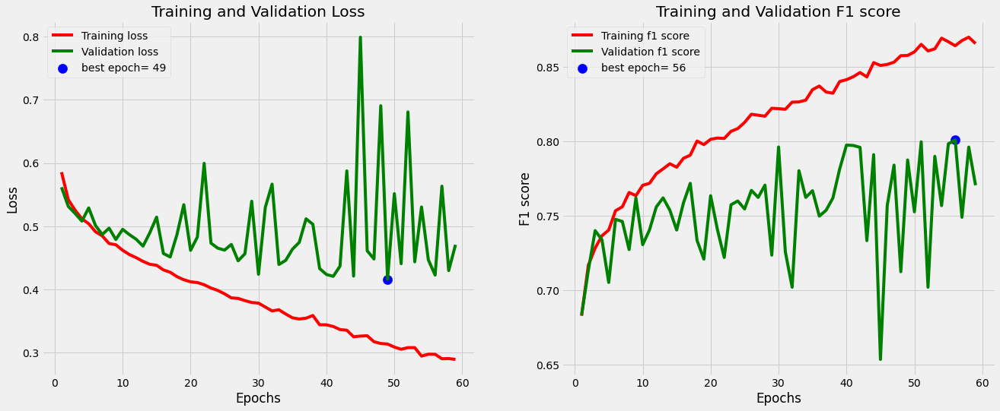

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.78      0.83       515
     EyeSpot       0.70      0.83      0.76       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.79      0.81      0.79       828
weighted avg       0.81      0.80      0.80       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 3s 17ms/step - loss: 0.6014 - binary_fbeta: 0.6707 - val_loss: 0.5720 - val_binary_fbeta: 0.6993

Epoch 00001: val_binary_fbeta improved from -inf to 0.69928, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 11ms/step - loss: 0.5496 - binary_fbeta: 0.7091 - val_loss: 0.5322 - val_binary_fbeta: 0.7393

Epoch 00002: val_binary_fbeta improved from 0.69928 to 0.73926, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 13ms/step - loss: 0.529

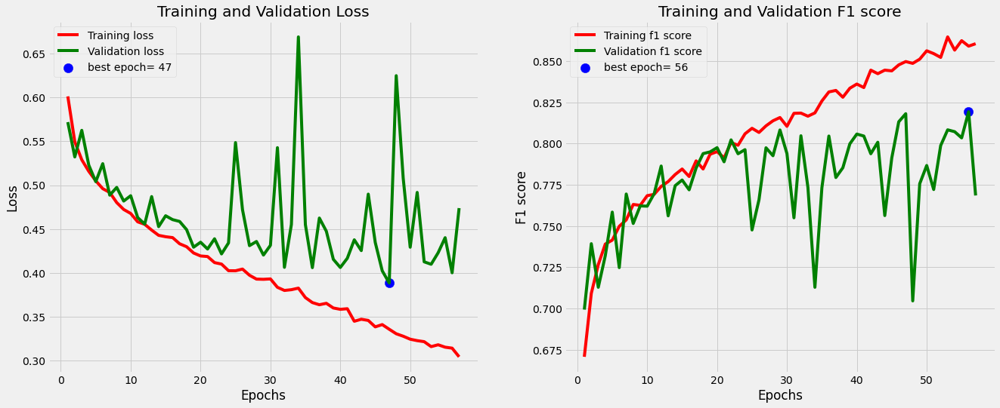

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.86      0.85      0.85       515
     EyeSpot       0.76      0.77      0.76       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.81      0.81      0.81       828
weighted avg       0.82      0.82      0.82       828
 samples avg       0.82      0.82      0.82       828

Epoch 1/100
117/117 [==============================] - 3s 18ms/step - loss: 0.5902 - binary_fbeta: 0.6742 - val_loss: 0.5624 - val_binary_fbeta: 0.6848

Epoch 00001: val_binary_fbeta improved from -inf to 0.68478, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 13ms/step - loss: 0.5474 - binary_fbeta: 0.7059 - val_loss: 0.5560 - val_binary_fbeta: 0.6830

Epoch 00002: val_binary_fbeta did not improve from 0.68478
Epoch 3/100
117/117 [==============================] - 2s 14ms/step - loss: 0.5317 - binary_fbeta: 0.7196 - val_loss

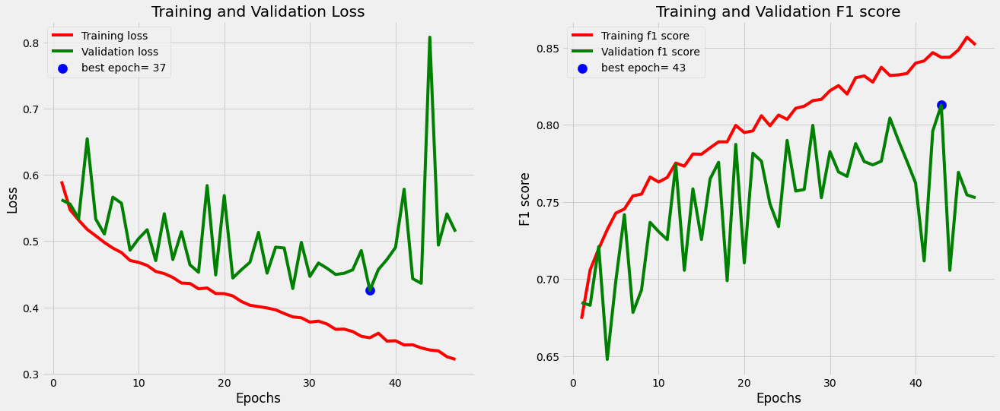

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.82      0.84       515
     EyeSpot       0.73      0.81      0.76       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.80      0.81      0.80       828
weighted avg       0.82      0.81      0.81       828
 samples avg       0.81      0.81      0.81       828

Epoch 1/100
117/117 [==============================] - 4s 21ms/step - loss: 0.5942 - binary_fbeta: 0.6741 - val_loss: 0.5650 - val_binary_fbeta: 0.6994

Epoch 00001: val_binary_fbeta improved from -inf to 0.69944, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 16ms/step - loss: 0.5490 - binary_fbeta: 0.7079 - val_loss: 0.5130 - val_binary_fbeta: 0.7417

Epoch 00002: val_binary_fbeta improved from 0.69944 to 0.74167, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 3s 22ms/step - loss: 0.528

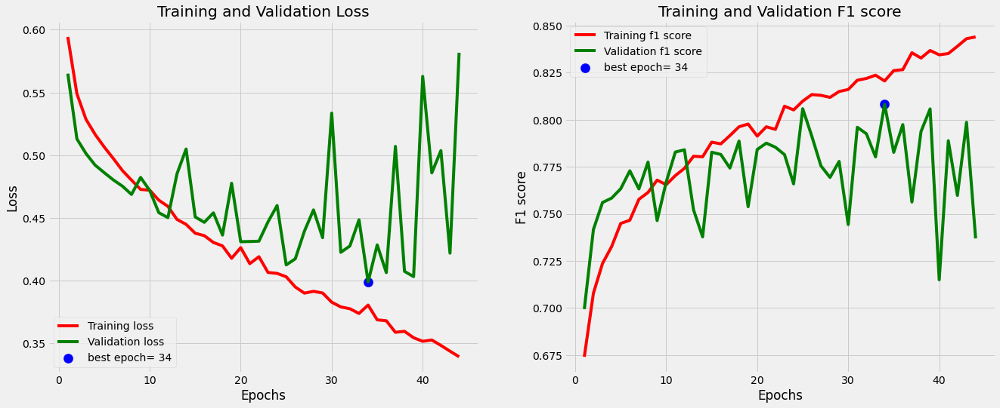

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.81      0.90      0.85       515
     EyeSpot       0.80      0.65      0.72       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.81      0.78      0.79       828
weighted avg       0.81      0.81      0.80       828
 samples avg       0.81      0.81      0.81       828

Model Performance (f1 score) =  0.8128433227539062


In [91]:
f1_scores = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)
    
f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/100
117/117 [==============================] - 3s 14ms/step - loss: 0.5938 - binary_fbeta: 0.6669 - val_loss: 0.5530 - val_binary_fbeta: 0.6967

Epoch 00001: val_binary_fbeta improved from -inf to 0.69671, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 13ms/step - loss: 0.5441 - binary_fbeta: 0.7178 - val_loss: 0.5545 - val_binary_fbeta: 0.7050

Epoch 00002: val_binary_fbeta improved from 0.69671 to 0.70505, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 12ms/step - loss: 0.5300 - binary_fbeta: 0.7274 - val_loss: 0.5152 - val_binary_fbeta: 0.7379

Epoch 00003: val_binary_fbeta improved from 0.70505 to 0.73790, saving model to best_model.h5
Epoch 4/100
117/117 [==============================] - 1s 12ms/step - loss: 0.5156 - binary_fbeta: 0.7376 - val_loss: 0.5072 - val_binary_fbeta: 0.7405

Epoch 00004: val_binary_fbeta improved from 0.73790 to 0.74054, saving model to best_model.h5
Epoch 5/100
117

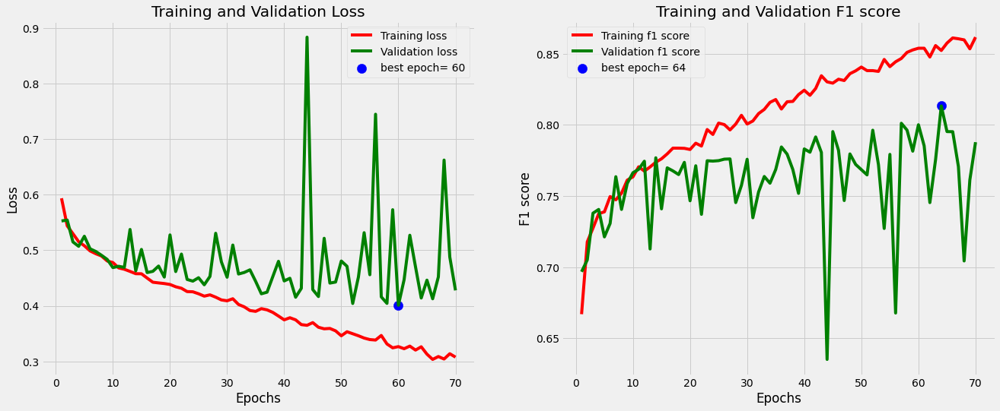

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.85      0.85       515
     EyeSpot       0.75      0.75      0.75       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.80      0.80      0.80       828
weighted avg       0.81      0.81      0.81       828
 samples avg       0.81      0.81      0.81       828

Epoch 1/100
117/117 [==============================] - 3s 13ms/step - loss: 0.5900 - binary_fbeta: 0.6824 - val_loss: 0.5383 - val_binary_fbeta: 0.7135

Epoch 00001: val_binary_fbeta improved from -inf to 0.71354, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 10ms/step - loss: 0.5414 - binary_fbeta: 0.7239 - val_loss: 0.5198 - val_binary_fbeta: 0.7173

Epoch 00002: val_binary_fbeta improved from 0.71354 to 0.71731, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 11ms/step - loss: 0.524

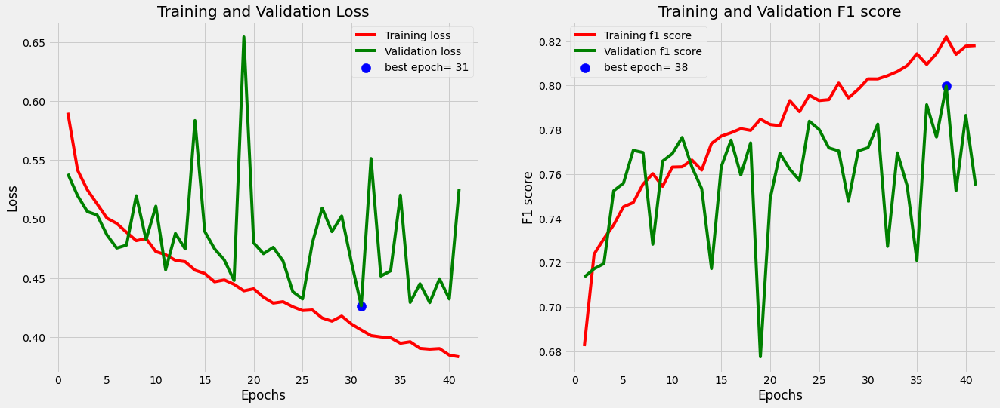

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.90      0.85       515
     EyeSpot       0.79      0.64      0.71       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.80      0.77      0.78       828
weighted avg       0.80      0.80      0.79       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 3s 15ms/step - loss: 0.6260 - binary_fbeta: 0.6362 - val_loss: 0.5798 - val_binary_fbeta: 0.7218

Epoch 00001: val_binary_fbeta improved from -inf to 0.72179, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 8ms/step - loss: 0.5681 - binary_fbeta: 0.6915 - val_loss: 0.5573 - val_binary_fbeta: 0.7254

Epoch 00002: val_binary_fbeta improved from 0.72179 to 0.72540, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 11ms/step - loss: 0.5467

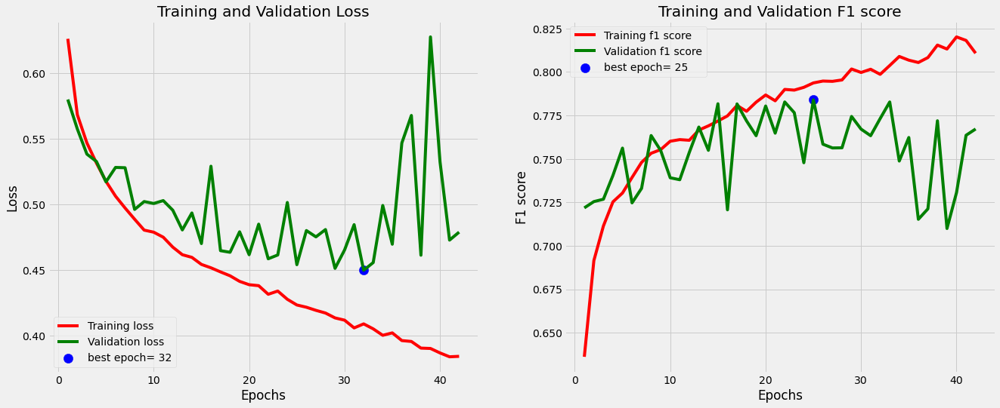

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.90      0.84       515
     EyeSpot       0.78      0.60      0.68       313

   micro avg       0.78      0.78      0.78       828
   macro avg       0.78      0.75      0.76       828
weighted avg       0.78      0.78      0.78       828
 samples avg       0.78      0.78      0.78       828

Epoch 1/100
117/117 [==============================] - 2s 10ms/step - loss: 0.6132 - binary_fbeta: 0.6717 - val_loss: 0.5889 - val_binary_fbeta: 0.6772

Epoch 00001: val_binary_fbeta improved from -inf to 0.67716, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 0s 4ms/step - loss: 0.5594 - binary_fbeta: 0.7012 - val_loss: 0.5653 - val_binary_fbeta: 0.7163

Epoch 00002: val_binary_fbeta improved from 0.67716 to 0.71635, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5393 

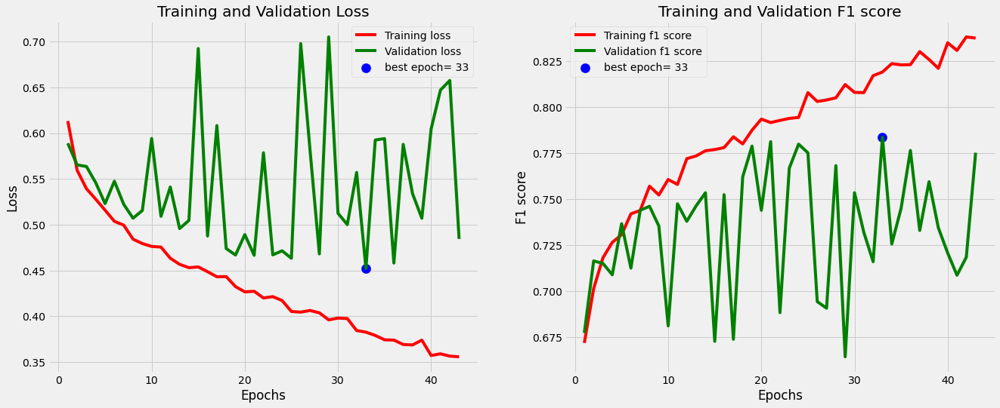

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.79      0.82       515
     EyeSpot       0.69      0.77      0.73       313

   micro avg       0.78      0.78      0.78       828
   macro avg       0.77      0.78      0.77       828
weighted avg       0.79      0.78      0.79       828
 samples avg       0.78      0.78      0.78       828

Epoch 1/100
117/117 [==============================] - 3s 16ms/step - loss: 0.5971 - binary_fbeta: 0.6661 - val_loss: 0.6088 - val_binary_fbeta: 0.6659

Epoch 00001: val_binary_fbeta improved from -inf to 0.66587, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 14ms/step - loss: 0.5403 - binary_fbeta: 0.7146 - val_loss: 0.5038 - val_binary_fbeta: 0.7296

Epoch 00002: val_binary_fbeta improved from 0.66587 to 0.72965, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 14ms/step - loss: 0.522

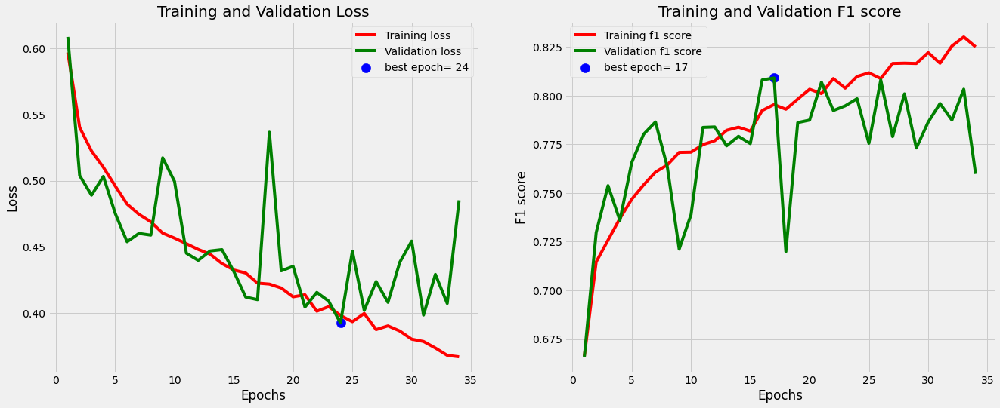

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.86      0.85       515
     EyeSpot       0.76      0.73      0.74       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.80      0.79      0.80       828
weighted avg       0.81      0.81      0.81       828
 samples avg       0.81      0.81      0.81       828

Model Performance (f1 score) =  0.7994505167007446


In [90]:
f1_scores = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(25, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/100
117/117 [==============================] - 2s 13ms/step - loss: 0.7143 - binary_fbeta: 0.6488 - val_loss: 0.6430 - val_binary_fbeta: 0.6550

Epoch 00001: val_binary_fbeta improved from -inf to 0.65497, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5861 - binary_fbeta: 0.6848 - val_loss: 0.8373 - val_binary_fbeta: 0.5845

Epoch 00002: val_binary_fbeta did not improve from 0.65497
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5503 - binary_fbeta: 0.7099 - val_loss: 0.5807 - val_binary_fbeta: 0.6780

Epoch 00003: val_binary_fbeta improved from 0.65497 to 0.67804, saving model to best_model.h5
Epoch 4/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5390 - binary_fbeta: 0.7131 - val_loss: 0.6682 - val_binary_fbeta: 0.6175

Epoch 00004: val_binary_fbeta did not improve from 0.67804
Epoch 5/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5340 - bina

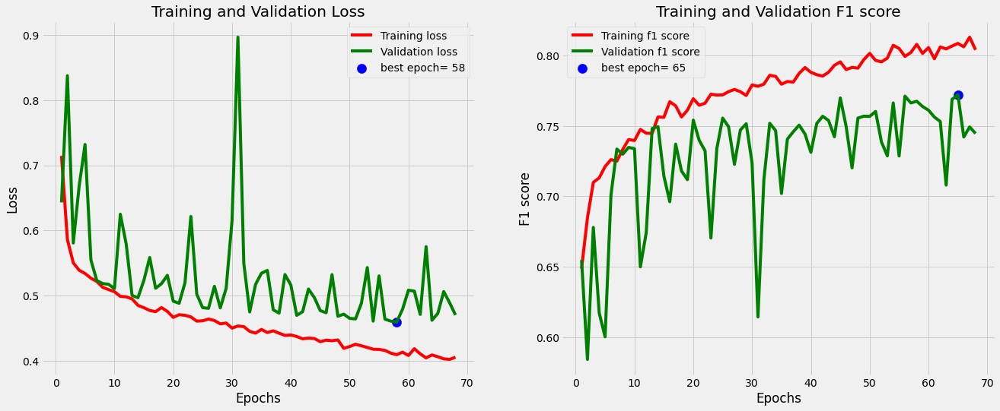

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.76      0.92      0.83       515
     EyeSpot       0.80      0.53      0.64       313

   micro avg       0.77      0.77      0.77       828
   macro avg       0.78      0.72      0.74       828
weighted avg       0.78      0.77      0.76       828
 samples avg       0.77      0.77      0.77       828

Epoch 1/100
117/117 [==============================] - 3s 20ms/step - loss: 0.6878 - binary_fbeta: 0.6523 - val_loss: 0.6793 - val_binary_fbeta: 0.6622

Epoch 00001: val_binary_fbeta improved from -inf to 0.66218, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 13ms/step - loss: 0.5848 - binary_fbeta: 0.6887 - val_loss: 0.5379 - val_binary_fbeta: 0.7284

Epoch 00002: val_binary_fbeta improved from 0.66218 to 0.72837, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 14ms/step - loss: 0.556

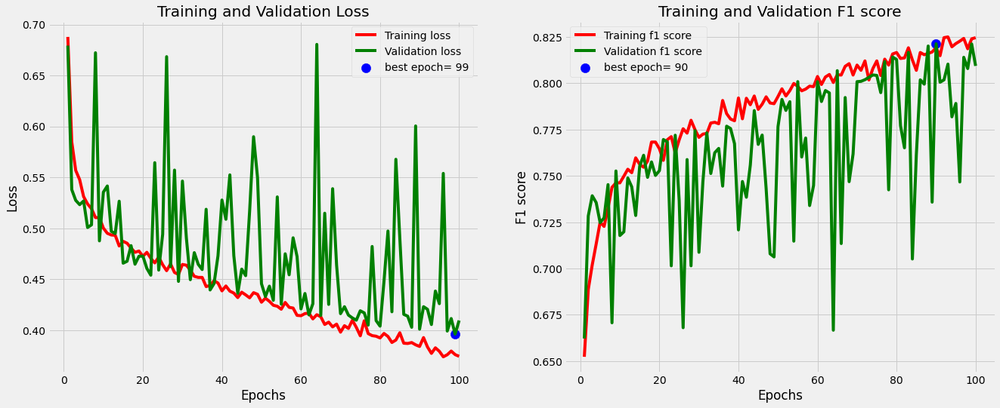

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.88      0.86       515
     EyeSpot       0.78      0.73      0.75       313

   micro avg       0.82      0.82      0.82       828
   macro avg       0.81      0.80      0.81       828
weighted avg       0.82      0.82      0.82       828
 samples avg       0.82      0.82      0.82       828

Epoch 1/100
117/117 [==============================] - 4s 25ms/step - loss: 0.6515 - binary_fbeta: 0.6590 - val_loss: 0.6253 - val_binary_fbeta: 0.6411

Epoch 00001: val_binary_fbeta improved from -inf to 0.64111, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 19ms/step - loss: 0.5700 - binary_fbeta: 0.6967 - val_loss: 0.7521 - val_binary_fbeta: 0.6495

Epoch 00002: val_binary_fbeta improved from 0.64111 to 0.64952, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 17ms/step - loss: 0.553

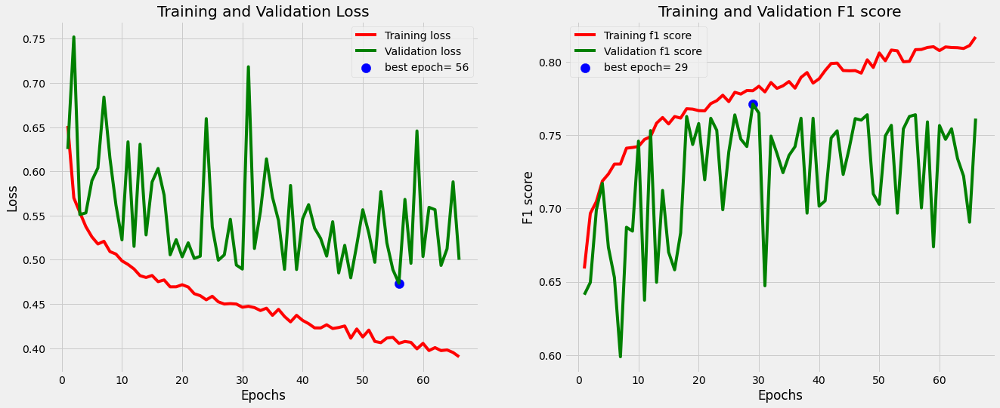

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.87      0.83       515
     EyeSpot       0.74      0.61      0.67       313

   micro avg       0.77      0.77      0.77       828
   macro avg       0.76      0.74      0.75       828
weighted avg       0.77      0.77      0.77       828
 samples avg       0.77      0.77      0.77       828

Epoch 1/100
117/117 [==============================] - 3s 18ms/step - loss: 0.7609 - binary_fbeta: 0.6518 - val_loss: 0.5487 - val_binary_fbeta: 0.7027

Epoch 00001: val_binary_fbeta improved from -inf to 0.70272, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 13ms/step - loss: 0.5907 - binary_fbeta: 0.6854 - val_loss: 0.5646 - val_binary_fbeta: 0.6789

Epoch 00002: val_binary_fbeta did not improve from 0.70272
Epoch 3/100
117/117 [==============================] - 2s 16ms/step - loss: 0.5628 - binary_fbeta: 0.6984 - val_loss

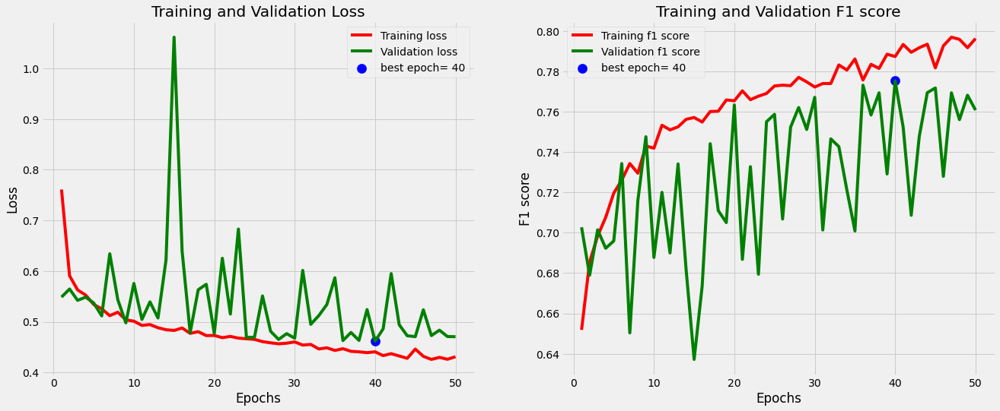

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.78      0.89      0.83       515
     EyeSpot       0.76      0.59      0.66       313

   micro avg       0.78      0.78      0.78       828
   macro avg       0.77      0.74      0.75       828
weighted avg       0.77      0.78      0.77       828
 samples avg       0.78      0.78      0.78       828

Epoch 1/100
117/117 [==============================] - 10s 45ms/step - loss: 0.7733 - binary_fbeta: 0.6304 - val_loss: 0.8106 - val_binary_fbeta: 0.5772

Epoch 00001: val_binary_fbeta improved from -inf to 0.57716, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 4s 32ms/step - loss: 0.5890 - binary_fbeta: 0.6847 - val_loss: 0.5731 - val_binary_fbeta: 0.6655

Epoch 00002: val_binary_fbeta improved from 0.57716 to 0.66546, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 4s 32ms/step - loss: 0.55

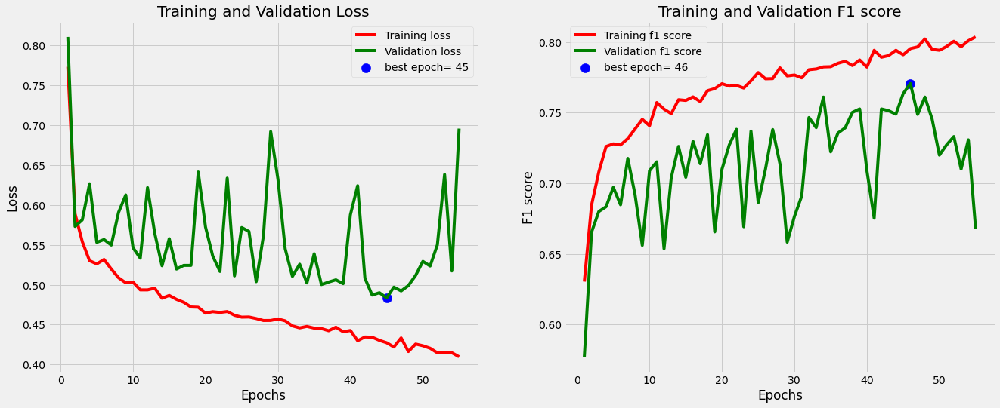

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.78      0.88      0.83       515
     EyeSpot       0.75      0.59      0.66       313

   micro avg       0.77      0.77      0.77       828
   macro avg       0.76      0.74      0.74       828
weighted avg       0.77      0.77      0.76       828
 samples avg       0.77      0.77      0.77       828

Model Performance (f1 score) =  0.7712911367416382


In [92]:
f1_scores = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='selu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/100
117/117 [==============================] - 3s 18ms/step - loss: 0.5838 - binary_fbeta: 0.6844 - val_loss: 0.5769 - val_binary_fbeta: 0.6756

Epoch 00001: val_binary_fbeta improved from -inf to 0.67564, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 9ms/step - loss: 0.5419 - binary_fbeta: 0.7182 - val_loss: 0.5359 - val_binary_fbeta: 0.7323

Epoch 00002: val_binary_fbeta improved from 0.67564 to 0.73229, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 9ms/step - loss: 0.5246 - binary_fbeta: 0.7275 - val_loss: 0.5267 - val_binary_fbeta: 0.7419

Epoch 00003: val_binary_fbeta improved from 0.73229 to 0.74191, saving model to best_model.h5
Epoch 4/100
117/117 [==============================] - 1s 8ms/step - loss: 0.5117 - binary_fbeta: 0.7413 - val_loss: 0.5302 - val_binary_fbeta: 0.7178

Epoch 00004: val_binary_fbeta did not improve from 0.74191
Epoch 5/100
117/117 [==============================] 

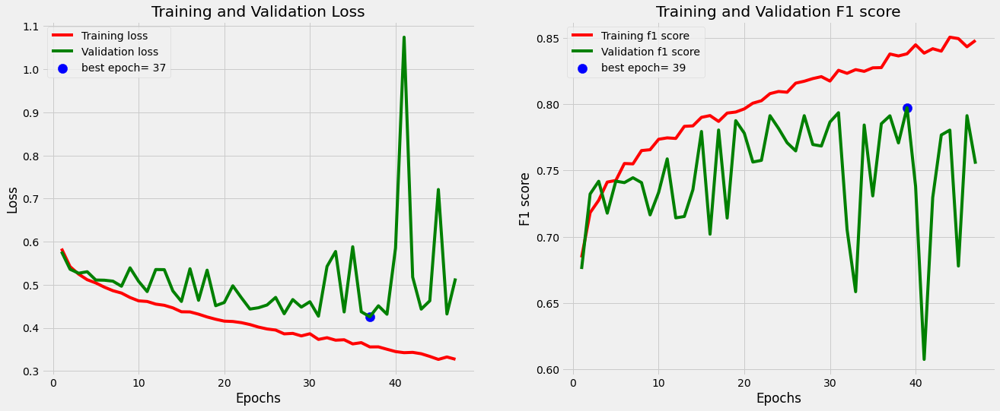

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.83      0.84       515
     EyeSpot       0.73      0.73      0.73       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.78      0.78      0.78       828
weighted avg       0.80      0.80      0.80       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5909 - binary_fbeta: 0.6714 - val_loss: 0.5883 - val_binary_fbeta: 0.6823

Epoch 00001: val_binary_fbeta improved from -inf to 0.68229, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5473 - binary_fbeta: 0.7114 - val_loss: 0.5524 - val_binary_fbeta: 0.6994

Epoch 00002: val_binary_fbeta improved from 0.68229 to 0.69944, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5277 -

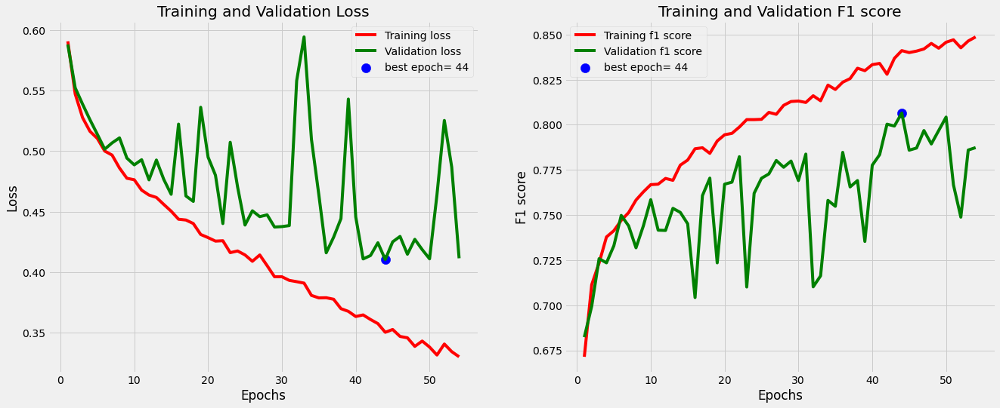

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.85      0.85       515
     EyeSpot       0.75      0.73      0.74       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.80      0.79      0.79       828
weighted avg       0.81      0.81      0.81       828
 samples avg       0.81      0.81      0.81       828

Epoch 1/100
117/117 [==============================] - 2s 8ms/step - loss: 0.5944 - binary_fbeta: 0.6792 - val_loss: 0.5730 - val_binary_fbeta: 0.6922

Epoch 00001: val_binary_fbeta improved from -inf to 0.69223, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5393 - binary_fbeta: 0.7210 - val_loss: 0.5582 - val_binary_fbeta: 0.7018

Epoch 00002: val_binary_fbeta improved from 0.69223 to 0.70176, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5256 -

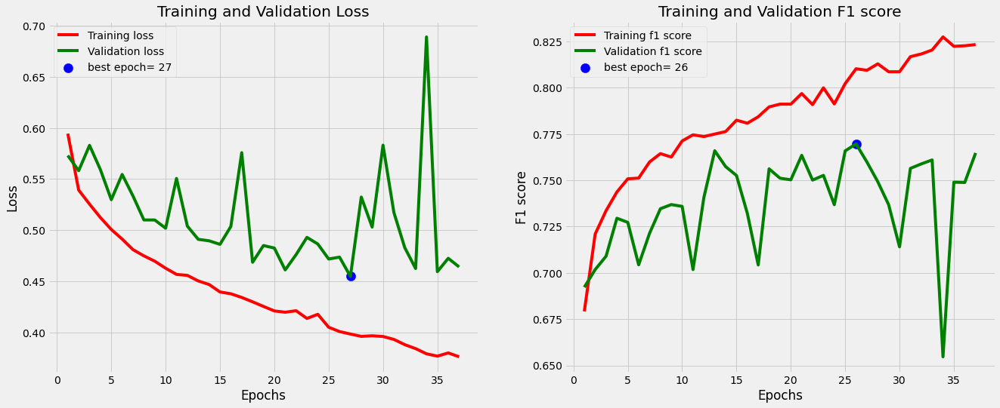

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.86      0.82       515
     EyeSpot       0.73      0.62      0.67       313

   micro avg       0.77      0.77      0.77       828
   macro avg       0.76      0.74      0.75       828
weighted avg       0.77      0.77      0.77       828
 samples avg       0.77      0.77      0.77       828

Epoch 1/100
117/117 [==============================] - 5s 27ms/step - loss: 0.6054 - binary_fbeta: 0.6621 - val_loss: 0.5635 - val_binary_fbeta: 0.7033

Epoch 00001: val_binary_fbeta improved from -inf to 0.70329, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 2s 14ms/step - loss: 0.5616 - binary_fbeta: 0.7006 - val_loss: 0.5466 - val_binary_fbeta: 0.7188

Epoch 00002: val_binary_fbeta improved from 0.70329 to 0.71883, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 2s 13ms/step - loss: 0.547

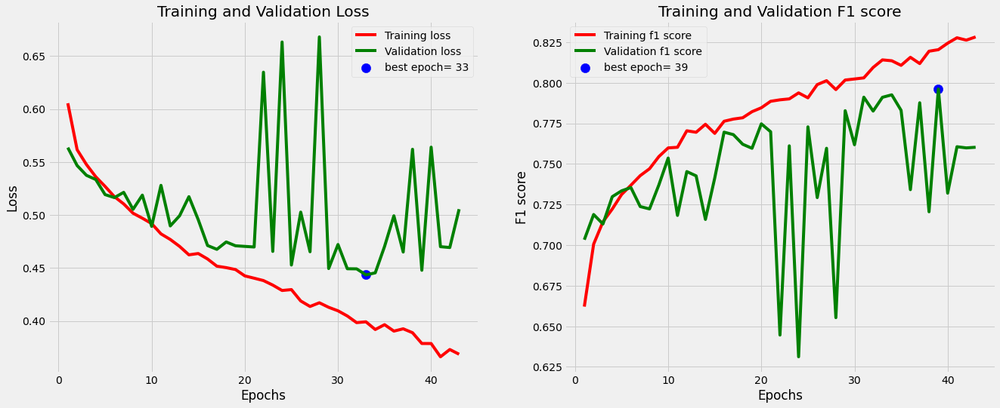

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.92      0.85       515
     EyeSpot       0.82      0.59      0.69       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.80      0.76      0.77       828
weighted avg       0.80      0.80      0.79       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 2s 10ms/step - loss: 0.6100 - binary_fbeta: 0.6577 - val_loss: 0.5609 - val_binary_fbeta: 0.7127

Epoch 00001: val_binary_fbeta improved from -inf to 0.71274, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 9ms/step - loss: 0.5568 - binary_fbeta: 0.6977 - val_loss: 0.5388 - val_binary_fbeta: 0.7244

Epoch 00002: val_binary_fbeta improved from 0.71274 to 0.72444, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 12ms/step - loss: 0.5412

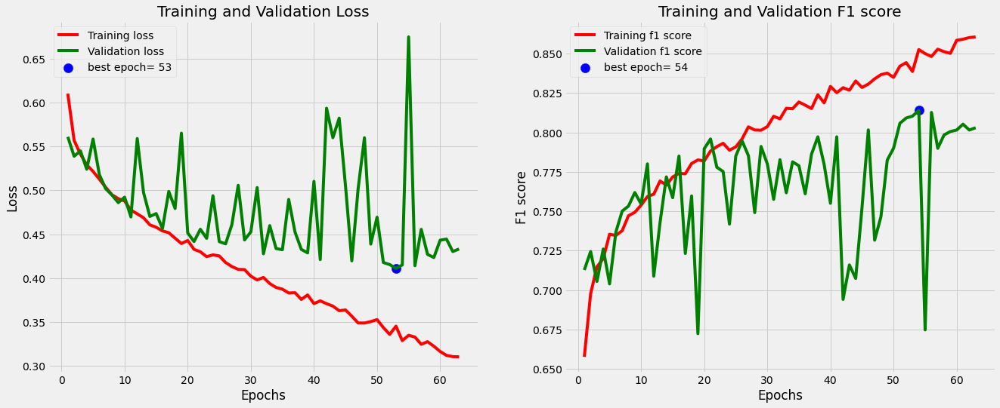

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.89      0.86       515
     EyeSpot       0.79      0.69      0.74       313

   micro avg       0.81      0.81      0.81       828
   macro avg       0.81      0.79      0.80       828
weighted avg       0.81      0.81      0.81       828
 samples avg       0.81      0.81      0.81       828

Model Performance (f1 score) =  0.7979050874710083


In [94]:
f1_scores = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'), 
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dropout(0.2), 
        tf.keras.layers.Dense(2, activation='softmax')
    ])

    f1score = multilayer_perceptron(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

## 2. Multilayer Perceptrons weighted

In [95]:
cw = class_weight.compute_class_weight(class_weight = 'balanced', classes = np.unique(y_train_dataset), y = y_train_dataset)

weights1 = dict(zip(np.unique(y_train_dataset),cw))

print(weights1)

{0: 0.8044535200311163, 1: 1.321143404663047}


In [98]:
def multilayer_perceptron_weighted(model, x_train_dataset, y_train_dataset, BATCH_SIZE, epochs, patience, class_weights):
    
    class_names = ['Spot', 'EyeSpot']

    # Normalize the dataset (re-scaling the data)
    x_train_dataset_n = x_train_dataset / 255.0
    
    # Cross-validation:
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_n, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    # Convert labels into one-hot-encoding format
    Ytrain = to_categorical(Ytrain)
    Ytest = to_categorical(Ytest)
    
    # Define patience    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
    
    mc = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_binary_fbeta', mode='max', verbose=1, save_best_only=True)
    
    # tf.keras.optimizers.SGD 
    model.compile(optimizer='sgd',
                  loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                  metrics=[binary_fbeta])
    
    history = model.fit(Xtrain, Ytrain, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[es, mc], class_weight=class_weights, validation_data=(Xtest, Ytest))
    
    saved_model = load_model('best_model.h5', custom_objects={"binary_fbeta": binary_fbeta})
        
    test_loss, test_acc = saved_model.evaluate(Xtest,  Ytest, verbose=1)

    print('\nTest f1-score:', test_acc)
    
    # predicting the testing set
    binary_ypred = saved_model.predict(Xtest)

    # one_hot encoding predictions 
    binary_ypred = np.array(binary_ypred >= 0.5, dtype=np.float32)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=history.history['binary_fbeta']
    tloss=history.history['loss']
    vacc=history.history['val_binary_fbeta']
    vloss=history.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training f1 score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation f1 score')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation F1 score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('F1 score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    
    clr = classification_report(Ytest, binary_ypred, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return test_acc

Epoch 1/100
117/117 [==============================] - 3s 12ms/step - loss: 0.6159 - binary_fbeta: 0.6458 - val_loss: 0.5735 - val_binary_fbeta: 0.6984

Epoch 00001: val_binary_fbeta improved from -inf to 0.69840, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5712 - binary_fbeta: 0.6889 - val_loss: 0.5622 - val_binary_fbeta: 0.7106

Epoch 00002: val_binary_fbeta improved from 0.69840 to 0.71058, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5549 - binary_fbeta: 0.7064 - val_loss: 0.6180 - val_binary_fbeta: 0.6481

Epoch 00003: val_binary_fbeta did not improve from 0.71058
Epoch 4/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5388 - binary_fbeta: 0.7138 - val_loss: 0.6386 - val_binary_fbeta: 0.6361

Epoch 00004: val_binary_fbeta did not improve from 0.71058
Epoch 5/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5275 - bina

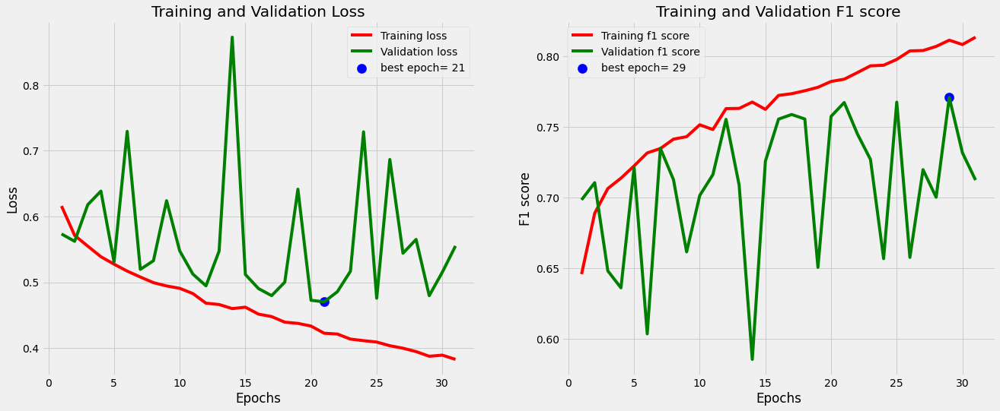

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.83      0.79      0.81       515
     EyeSpot       0.68      0.74      0.71       313

   micro avg       0.77      0.77      0.77       828
   macro avg       0.76      0.76      0.76       828
weighted avg       0.78      0.77      0.77       828
 samples avg       0.77      0.77      0.77       828

Epoch 1/100
117/117 [==============================] - 1s 7ms/step - loss: 0.6233 - binary_fbeta: 0.6328 - val_loss: 0.5632 - val_binary_fbeta: 0.7116

Epoch 00001: val_binary_fbeta improved from -inf to 0.71162, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 5ms/step - loss: 0.5796 - binary_fbeta: 0.6756 - val_loss: 0.5340 - val_binary_fbeta: 0.7334

Epoch 00002: val_binary_fbeta improved from 0.71162 to 0.73341, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5580 -

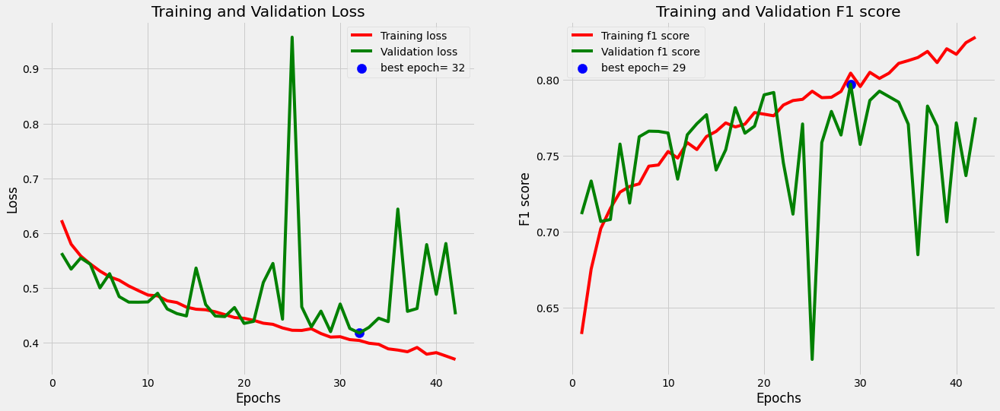

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.84      0.84       515
     EyeSpot       0.73      0.73      0.73       313

   micro avg       0.80      0.80      0.80       828
   macro avg       0.78      0.78      0.78       828
weighted avg       0.80      0.80      0.80       828
 samples avg       0.80      0.80      0.80       828

Epoch 1/100
117/117 [==============================] - 2s 9ms/step - loss: 0.6055 - binary_fbeta: 0.6640 - val_loss: 0.6087 - val_binary_fbeta: 0.6664

Epoch 00001: val_binary_fbeta improved from -inf to 0.66643, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5666 - binary_fbeta: 0.6917 - val_loss: 0.6553 - val_binary_fbeta: 0.6413

Epoch 00002: val_binary_fbeta did not improve from 0.66643
Epoch 3/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5470 - binary_fbeta: 0.7104 - val_loss: 0

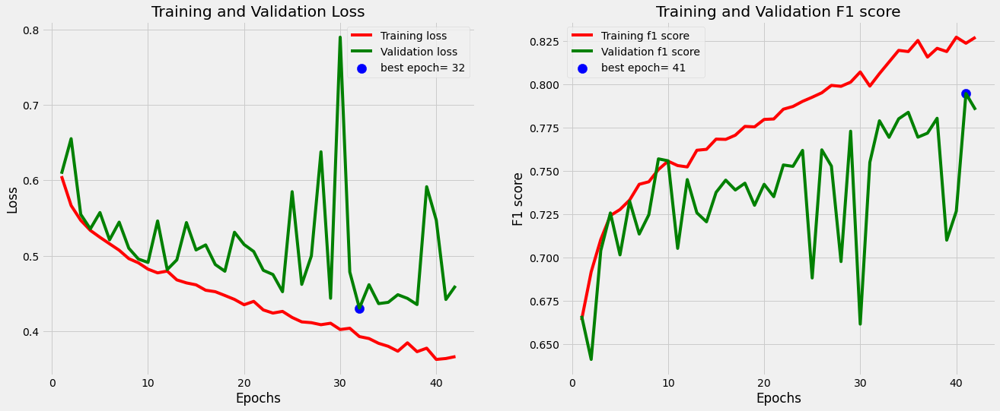

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.92      0.85       515
     EyeSpot       0.81      0.59      0.69       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.80      0.76      0.77       828
weighted avg       0.80      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 2s 11ms/step - loss: 0.6107 - binary_fbeta: 0.6571 - val_loss: 0.5786 - val_binary_fbeta: 0.6930

Epoch 00001: val_binary_fbeta improved from -inf to 0.69303, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 8ms/step - loss: 0.5618 - binary_fbeta: 0.7004 - val_loss: 0.5268 - val_binary_fbeta: 0.7309

Epoch 00002: val_binary_fbeta improved from 0.69303 to 0.73093, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5428 

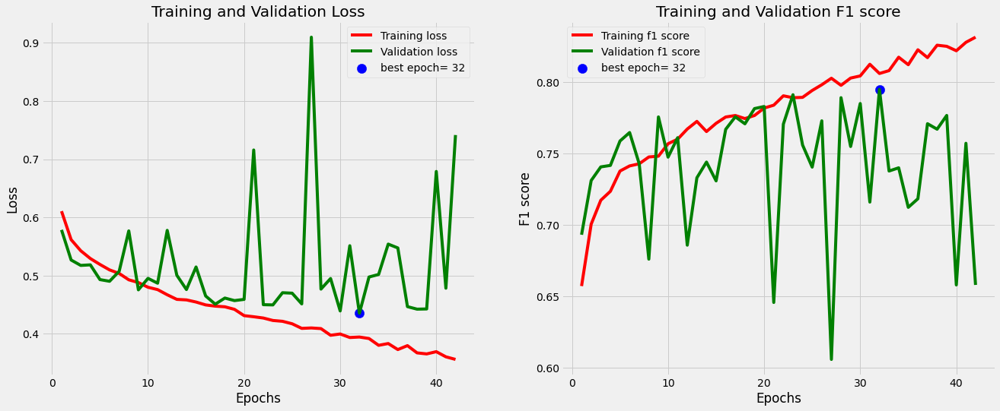

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.86      0.84       515
     EyeSpot       0.75      0.68      0.71       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.78      0.77      0.78       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Epoch 1/100
117/117 [==============================] - 1s 7ms/step - loss: 0.6266 - binary_fbeta: 0.6446 - val_loss: 0.5989 - val_binary_fbeta: 0.6995

Epoch 00001: val_binary_fbeta improved from -inf to 0.69952, saving model to best_model.h5
Epoch 2/100
117/117 [==============================] - 1s 6ms/step - loss: 0.5706 - binary_fbeta: 0.6957 - val_loss: 0.5819 - val_binary_fbeta: 0.7115

Epoch 00002: val_binary_fbeta improved from 0.69952 to 0.71146, saving model to best_model.h5
Epoch 3/100
117/117 [==============================] - 1s 7ms/step - loss: 0.5502 -

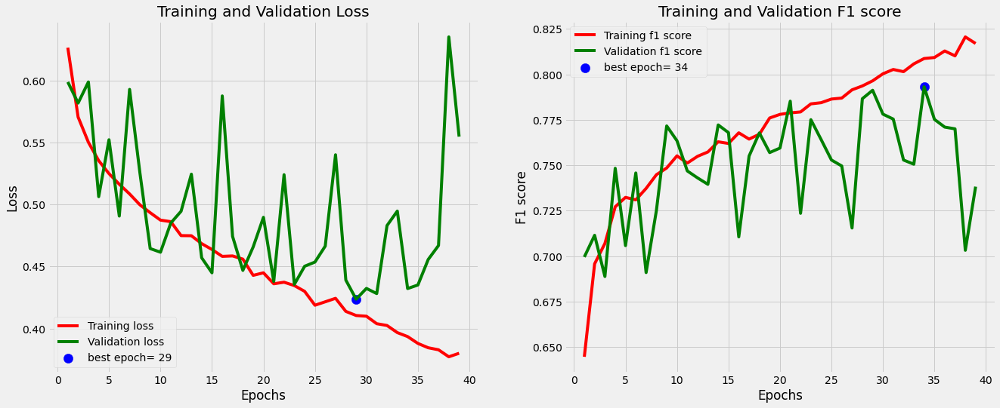

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.90      0.84       515
     EyeSpot       0.79      0.61      0.69       313

   micro avg       0.79      0.79      0.79       828
   macro avg       0.79      0.76      0.77       828
weighted avg       0.79      0.79      0.79       828
 samples avg       0.79      0.79      0.79       828

Model Performance (f1 score) =  0.7948144674301147


In [99]:
f1_scores = []
for i in range(5):

    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron_weighted(model, x_train_dataset, y_train_dataset, BATCH_SIZE = 64, epochs=100, patience=10, class_weights = weights1) 
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

## 4. Oversampling

#### Random Oversampling 

In [100]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=1)

x_ros, y_ros = ros.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_ros))

Counter({1: 5142, 0: 5142})


Epoch 1/100
145/145 [==============================] - 2s 9ms/step - loss: 0.5971 - binary_fbeta: 0.6780 - val_loss: 0.5740 - val_binary_fbeta: 0.7134

Epoch 00001: val_binary_fbeta improved from -inf to 0.71342, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 9ms/step - loss: 0.5486 - binary_fbeta: 0.7223 - val_loss: 0.5404 - val_binary_fbeta: 0.7472

Epoch 00002: val_binary_fbeta improved from 0.71342 to 0.74724, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 15ms/step - loss: 0.5284 - binary_fbeta: 0.7361 - val_loss: 0.5222 - val_binary_fbeta: 0.7537

Epoch 00003: val_binary_fbeta improved from 0.74724 to 0.75368, saving model to best_model.h5
Epoch 4/100
145/145 [==============================] - 2s 16ms/step - loss: 0.5149 - binary_fbeta: 0.7452 - val_loss: 0.5232 - val_binary_fbeta: 0.7574

Epoch 00004: val_binary_fbeta improved from 0.75368 to 0.75735, saving model to best_model.h5
Epoch 5/100
145/1

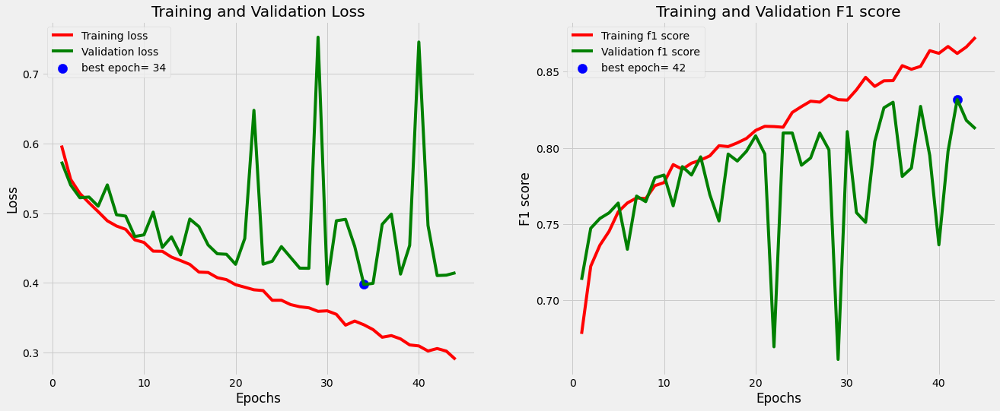

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.86      0.83       515
     EyeSpot       0.85      0.78      0.81       514

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.82      0.82      0.82      1029
weighted avg       0.82      0.82      0.82      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 2s 6ms/step - loss: 0.6027 - binary_fbeta: 0.6825 - val_loss: 0.6363 - val_binary_fbeta: 0.6491

Epoch 00001: val_binary_fbeta improved from -inf to 0.64908, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 6ms/step - loss: 0.5617 - binary_fbeta: 0.7100 - val_loss: 0.5830 - val_binary_fbeta: 0.7044

Epoch 00002: val_binary_fbeta improved from 0.64908 to 0.70441, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 6ms/step - loss: 0.5436 -

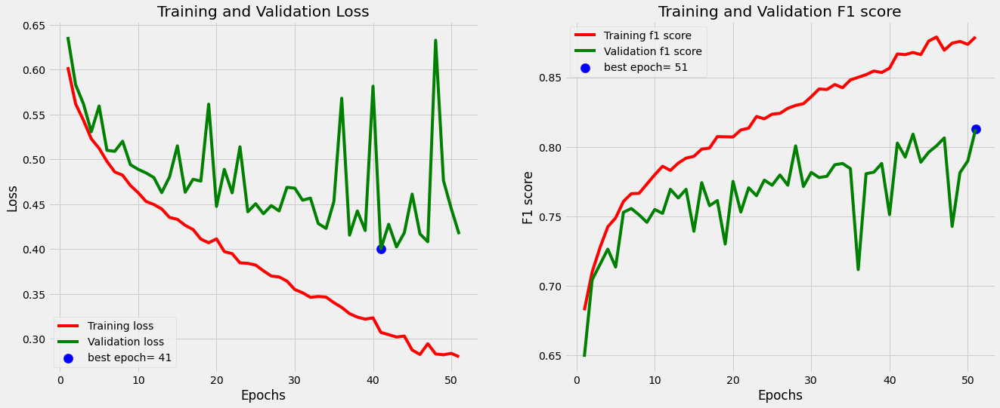

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.81      0.81      0.81       514
     EyeSpot       0.81      0.81      0.81       515

   micro avg       0.81      0.81      0.81      1029
   macro avg       0.81      0.81      0.81      1029
weighted avg       0.81      0.81      0.81      1029
 samples avg       0.81      0.81      0.81      1029

Epoch 1/100
145/145 [==============================] - 2s 10ms/step - loss: 0.6064 - binary_fbeta: 0.6711 - val_loss: 0.5720 - val_binary_fbeta: 0.6849

Epoch 00001: val_binary_fbeta improved from -inf to 0.68493, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 8ms/step - loss: 0.5566 - binary_fbeta: 0.7137 - val_loss: 0.5336 - val_binary_fbeta: 0.7384

Epoch 00002: val_binary_fbeta improved from 0.68493 to 0.73842, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 10ms/step - loss: 0.5353

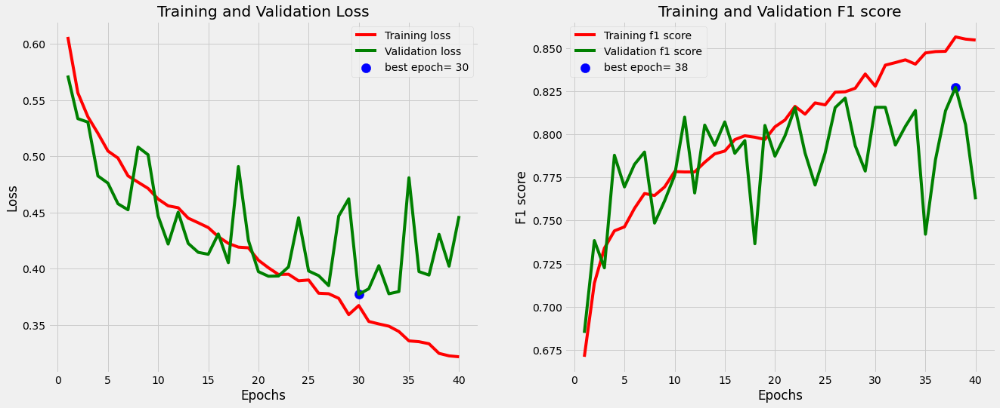

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.73      0.80       514
     EyeSpot       0.77      0.90      0.83       515

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.83      0.82      0.82      1029
weighted avg       0.83      0.82      0.82      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 3s 13ms/step - loss: 0.5949 - binary_fbeta: 0.6849 - val_loss: 0.5671 - val_binary_fbeta: 0.7125

Epoch 00001: val_binary_fbeta improved from -inf to 0.71250, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 8ms/step - loss: 0.5516 - binary_fbeta: 0.7194 - val_loss: 0.5685 - val_binary_fbeta: 0.7142

Epoch 00002: val_binary_fbeta improved from 0.71250 to 0.71415, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 8ms/step - loss: 0.5303 

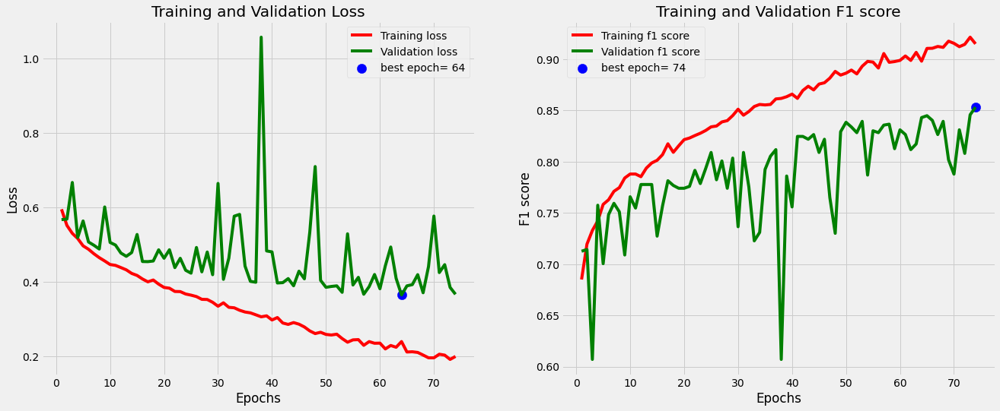

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.81      0.84       514
     EyeSpot       0.82      0.88      0.85       515

   micro avg       0.84      0.84      0.84      1029
   macro avg       0.85      0.84      0.84      1029
weighted avg       0.85      0.84      0.84      1029
 samples avg       0.84      0.84      0.84      1029

Epoch 1/100
145/145 [==============================] - 3s 13ms/step - loss: 0.6045 - binary_fbeta: 0.6817 - val_loss: 0.5872 - val_binary_fbeta: 0.7033

Epoch 00001: val_binary_fbeta improved from -inf to 0.70331, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 12ms/step - loss: 0.5563 - binary_fbeta: 0.7162 - val_loss: 0.5615 - val_binary_fbeta: 0.7290

Epoch 00002: val_binary_fbeta improved from 0.70331 to 0.72904, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 17ms/step - loss: 0.534

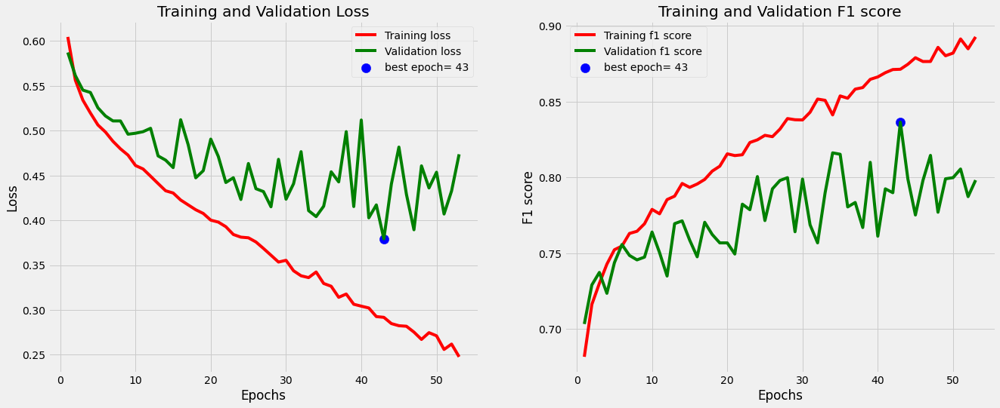

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.79      0.82       514
     EyeSpot       0.81      0.86      0.83       515

   micro avg       0.83      0.83      0.83      1029
   macro avg       0.83      0.83      0.83      1029
weighted avg       0.83      0.83      0.83      1029
 samples avg       0.83      0.83      0.83      1029


 
Model Performance (f1 score) =  0.8267045021057129


In [102]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_ros, y_ros, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

#### Synthetic Minority Oversampling Technique (SMOTE)

In [104]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(sampling_strategy='minority', k_neighbors = 10)

# fit predictor and target variable
x_smote, y_smote = smote.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_smote))

Counter({1: 5142, 0: 5142})


Epoch 1/100
145/145 [==============================] - 2s 7ms/step - loss: 0.6166 - binary_fbeta: 0.6835 - val_loss: 0.5495 - val_binary_fbeta: 0.7136

Epoch 00001: val_binary_fbeta improved from -inf to 0.71360, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 6ms/step - loss: 0.5566 - binary_fbeta: 0.7231 - val_loss: 0.5263 - val_binary_fbeta: 0.7191

Epoch 00002: val_binary_fbeta improved from 0.71360 to 0.71912, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 9ms/step - loss: 0.5349 - binary_fbeta: 0.7359 - val_loss: 0.5227 - val_binary_fbeta: 0.7392

Epoch 00003: val_binary_fbeta improved from 0.71912 to 0.73915, saving model to best_model.h5
Epoch 4/100
145/145 [==============================] - 1s 10ms/step - loss: 0.5214 - binary_fbeta: 0.7424 - val_loss: 0.5059 - val_binary_fbeta: 0.7140

Epoch 00004: val_binary_fbeta did not improve from 0.73915
Epoch 5/100
145/145 [==============================] 

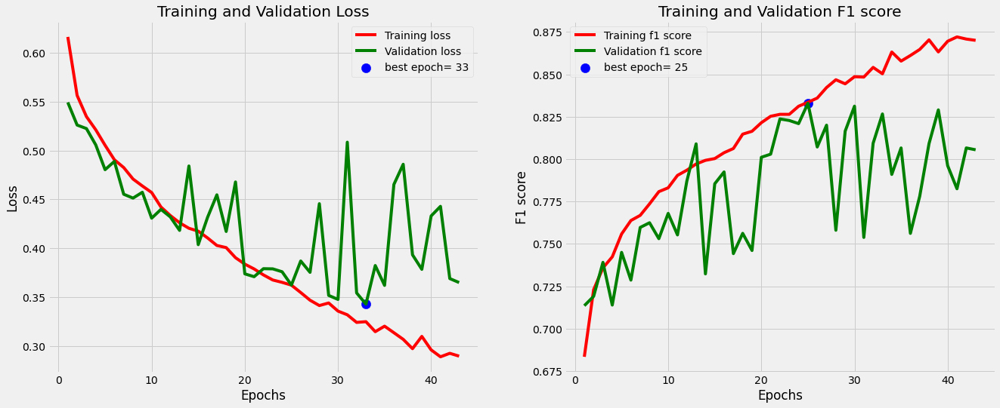

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.81      0.83       514
     EyeSpot       0.82      0.86      0.84       515

   micro avg       0.83      0.83      0.83      1029
   macro avg       0.84      0.83      0.83      1029
weighted avg       0.84      0.83      0.83      1029
 samples avg       0.83      0.83      0.83      1029

Epoch 1/100
145/145 [==============================] - 3s 13ms/step - loss: 0.5957 - binary_fbeta: 0.6821 - val_loss: 0.5711 - val_binary_fbeta: 0.6934

Epoch 00001: val_binary_fbeta improved from -inf to 0.69338, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - ETA: 0s - loss: 0.5447 - binary_fbeta: 0.71 - 2s 12ms/step - loss: 0.5456 - binary_fbeta: 0.7157 - val_loss: 0.5508 - val_binary_fbeta: 0.7226

Epoch 00002: val_binary_fbeta improved from 0.69338 to 0.72261, saving model to best_model.h5
Epoch 3/100
145/145 [==============

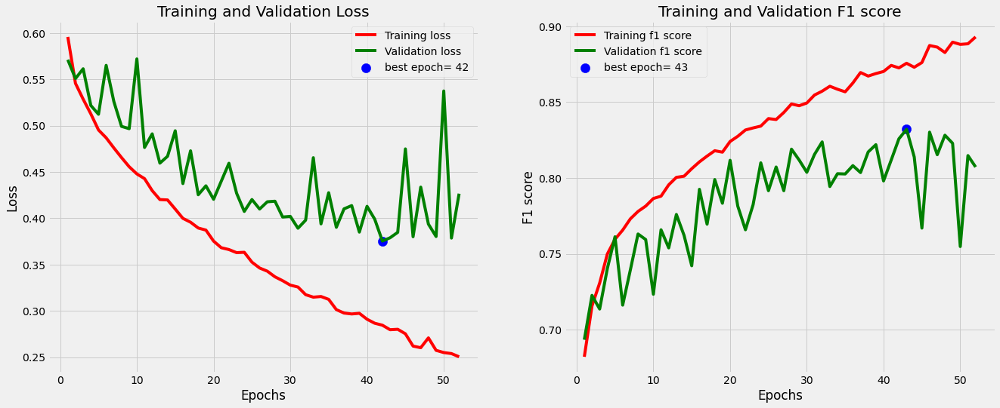

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.83      0.83       514
     EyeSpot       0.83      0.84      0.84       515

   micro avg       0.83      0.83      0.83      1029
   macro avg       0.83      0.83      0.83      1029
weighted avg       0.83      0.83      0.83      1029
 samples avg       0.83      0.83      0.83      1029

Epoch 1/100
145/145 [==============================] - 3s 11ms/step - loss: 0.5953 - binary_fbeta: 0.6903 - val_loss: 0.5675 - val_binary_fbeta: 0.7079

Epoch 00001: val_binary_fbeta improved from -inf to 0.70790, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 7ms/step - loss: 0.5442 - binary_fbeta: 0.7256 - val_loss: 0.5260 - val_binary_fbeta: 0.7465

Epoch 00002: val_binary_fbeta improved from 0.70790 to 0.74651, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 7ms/step - loss: 0.5264 

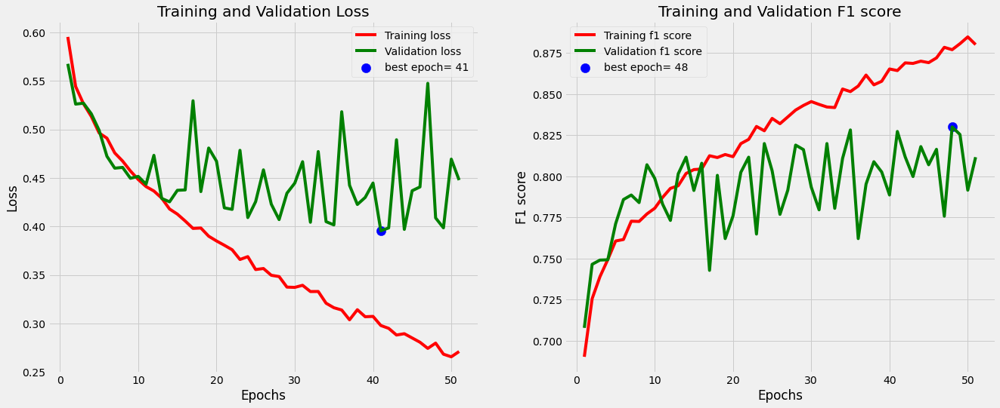

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.78      0.89      0.83       514
     EyeSpot       0.88      0.75      0.81       515

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.83      0.82      0.82      1029
weighted avg       0.83      0.82      0.82      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 3s 12ms/step - loss: 0.5839 - binary_fbeta: 0.6968 - val_loss: 0.5594 - val_binary_fbeta: 0.7318

Epoch 00001: val_binary_fbeta improved from -inf to 0.73180, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 12ms/step - loss: 0.5382 - binary_fbeta: 0.7293 - val_loss: 0.5504 - val_binary_fbeta: 0.7051

Epoch 00002: val_binary_fbeta did not improve from 0.73180
Epoch 3/100
145/145 [==============================] - 2s 14ms/step - loss: 0.5171 - binary_fbeta: 0.7422 - val_loss

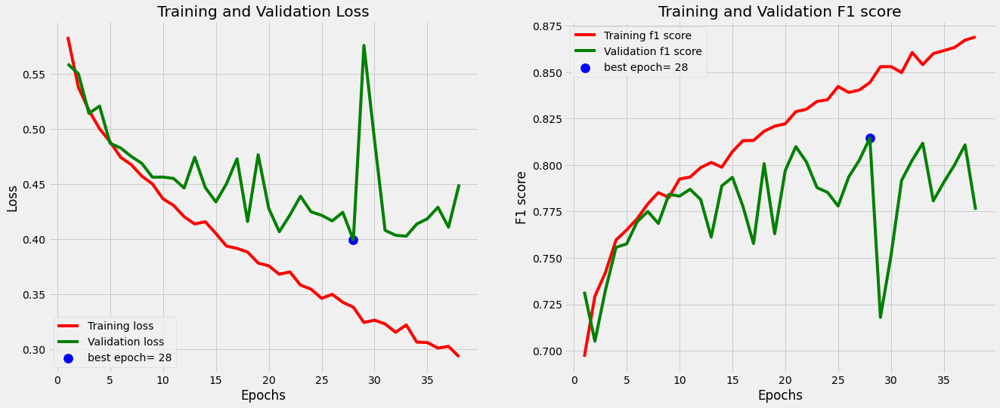

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.76      0.80       514
     EyeSpot       0.78      0.87      0.83       515

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.82      0.82      0.81      1029
weighted avg       0.82      0.82      0.81      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 4s 18ms/step - loss: 0.5932 - binary_fbeta: 0.6957 - val_loss: 0.5809 - val_binary_fbeta: 0.6632

Epoch 00001: val_binary_fbeta improved from -inf to 0.66324, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 13ms/step - loss: 0.5458 - binary_fbeta: 0.7252 - val_loss: 0.5452 - val_binary_fbeta: 0.7000

Epoch 00002: val_binary_fbeta improved from 0.66324 to 0.70000, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 13ms/step - loss: 0.528

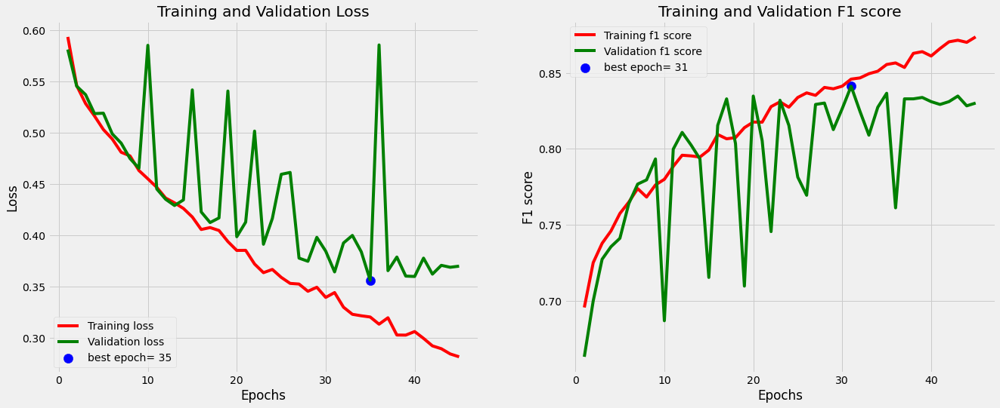

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.84      0.84       514
     EyeSpot       0.84      0.85      0.84       515

   micro avg       0.84      0.84      0.84      1029
   macro avg       0.84      0.84      0.84      1029
weighted avg       0.84      0.84      0.84      1029
 samples avg       0.84      0.84      0.84      1029


 
Model Performance (f1 score) =  0.832954466342926


In [105]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_smote, y_smote, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

#### Borderline-SMOTE

In [106]:
from imblearn.over_sampling import BorderlineSMOTE

oversample = BorderlineSMOTE()

x_blsmote, y_blsmote = oversample.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_blsmote))

Counter({1: 5142, 0: 5142})


Epoch 1/100
145/145 [==============================] - 3s 14ms/step - loss: 0.6245 - binary_fbeta: 0.6603 - val_loss: 0.5593 - val_binary_fbeta: 0.7491

Epoch 00001: val_binary_fbeta improved from -inf to 0.74908, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 3s 19ms/step - loss: 0.5638 - binary_fbeta: 0.7090 - val_loss: 0.5306 - val_binary_fbeta: 0.7619

Epoch 00002: val_binary_fbeta improved from 0.74908 to 0.76195, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 16ms/step - loss: 0.5421 - binary_fbeta: 0.7227 - val_loss: 0.5145 - val_binary_fbeta: 0.7539

Epoch 00003: val_binary_fbeta did not improve from 0.76195
Epoch 4/100
145/145 [==============================] - 1s 9ms/step - loss: 0.5265 - binary_fbeta: 0.7305 - val_loss: 0.4950 - val_binary_fbeta: 0.7676

Epoch 00004: val_binary_fbeta improved from 0.76195 to 0.76765, saving model to best_model.h5
Epoch 5/100
145/145 [==============================

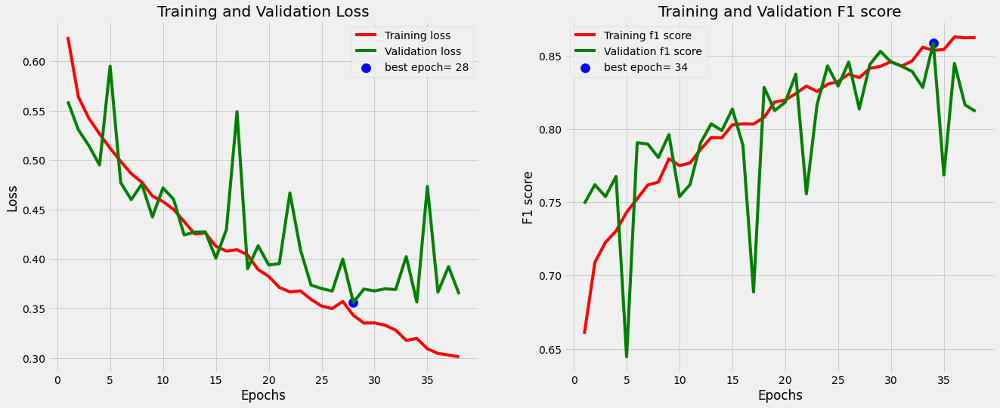

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.84      0.85       515
     EyeSpot       0.85      0.86      0.85       514

   micro avg       0.85      0.85      0.85      1029
   macro avg       0.85      0.85      0.85      1029
weighted avg       0.85      0.85      0.85      1029
 samples avg       0.85      0.85      0.85      1029

Epoch 1/100
145/145 [==============================] - 3s 16ms/step - loss: 0.5971 - binary_fbeta: 0.6799 - val_loss: 0.5398 - val_binary_fbeta: 0.7281

Epoch 00001: val_binary_fbeta improved from -inf to 0.72812, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 16ms/step - loss: 0.5501 - binary_fbeta: 0.7145 - val_loss: 0.5261 - val_binary_fbeta: 0.7410

Epoch 00002: val_binary_fbeta improved from 0.72812 to 0.74099, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 15ms/step - loss: 0.533

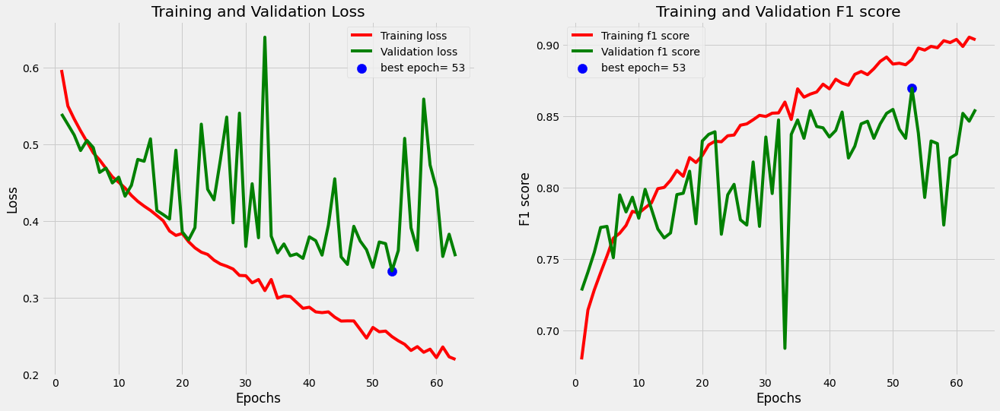

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.85      0.86       515
     EyeSpot       0.85      0.87      0.86       514

   micro avg       0.86      0.86      0.86      1029
   macro avg       0.86      0.86      0.86      1029
weighted avg       0.86      0.86      0.86      1029
 samples avg       0.86      0.86      0.86      1029

Epoch 1/100
145/145 [==============================] - 4s 18ms/step - loss: 0.5957 - binary_fbeta: 0.6872 - val_loss: 0.5537 - val_binary_fbeta: 0.7136

Epoch 00001: val_binary_fbeta improved from -inf to 0.71360, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 15ms/step - loss: 0.5470 - binary_fbeta: 0.7216 - val_loss: 0.5323 - val_binary_fbeta: 0.7219

Epoch 00002: val_binary_fbeta improved from 0.71360 to 0.72187, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 15ms/step - loss: 0.529

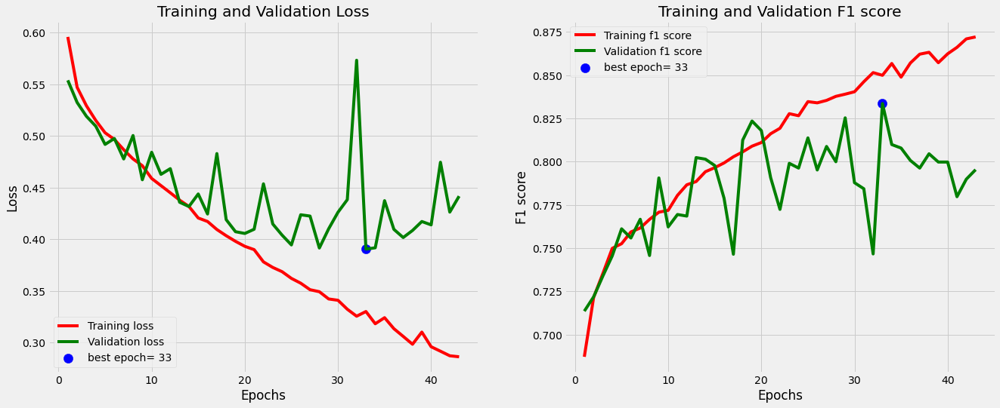

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.86      0.83       515
     EyeSpot       0.85      0.79      0.82       514

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.83      0.82      0.82      1029
weighted avg       0.83      0.82      0.82      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 4s 18ms/step - loss: 0.6251 - binary_fbeta: 0.6598 - val_loss: 0.5860 - val_binary_fbeta: 0.6807

Epoch 00001: val_binary_fbeta improved from -inf to 0.68070, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 15ms/step - loss: 0.5699 - binary_fbeta: 0.7019 - val_loss: 0.5681 - val_binary_fbeta: 0.6835 0s - l

Epoch 00002: val_binary_fbeta improved from 0.68070 to 0.68346, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 3s 17ms/step - loss

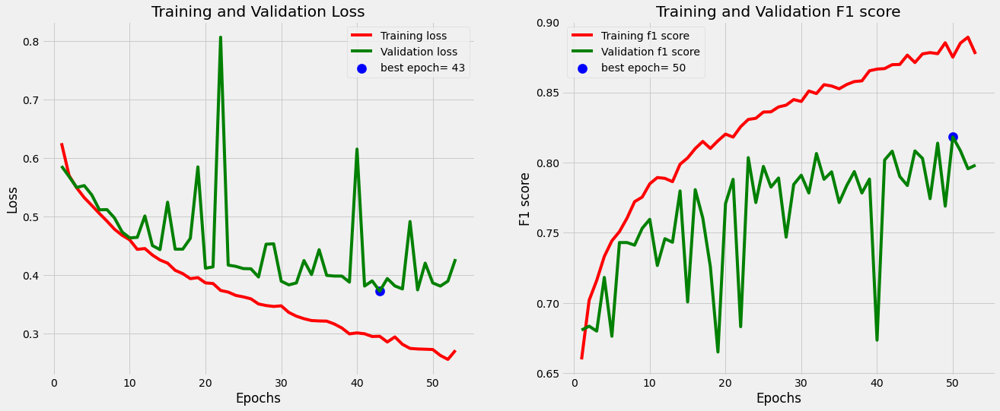

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.80      0.85      0.83       515
     EyeSpot       0.84      0.79      0.81       514

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.82      0.82      0.82      1029
weighted avg       0.82      0.82      0.82      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 1s 6ms/step - loss: 0.6009 - binary_fbeta: 0.6756 - val_loss: 0.5664 - val_binary_fbeta: 0.6943

Epoch 00001: val_binary_fbeta improved from -inf to 0.69430, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 5ms/step - loss: 0.5419 - binary_fbeta: 0.7278 - val_loss: 0.5403 - val_binary_fbeta: 0.7017

Epoch 00002: val_binary_fbeta improved from 0.69430 to 0.70165, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 5ms/step - loss: 0.5237 -

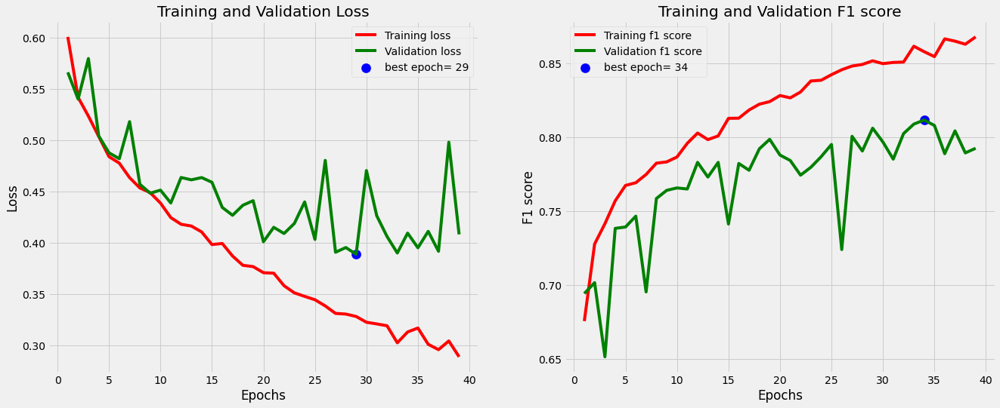

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.90      0.71      0.79       515
     EyeSpot       0.76      0.92      0.83       514

   micro avg       0.81      0.81      0.81      1029
   macro avg       0.83      0.81      0.81      1029
weighted avg       0.83      0.81      0.81      1029
 samples avg       0.81      0.81      0.81      1029


 
Model Performance (f1 score) =  0.8285984396934509


In [107]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_blsmote, y_blsmote, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

#### ADASYN

In [108]:
from imblearn.over_sampling import ADASYN

oversample = ADASYN()

x_ADASYN, y_ADASYN = oversample.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_ADASYN))

Counter({1: 5238, 0: 5142})


Epoch 1/100
146/146 [==============================] - 2s 7ms/step - loss: 0.5971 - binary_fbeta: 0.6791 - val_loss: 0.5691 - val_binary_fbeta: 0.7130

Epoch 00001: val_binary_fbeta improved from -inf to 0.71297, saving model to best_model.h5
Epoch 2/100
146/146 [==============================] - 1s 7ms/step - loss: 0.5554 - binary_fbeta: 0.7136 - val_loss: 0.5482 - val_binary_fbeta: 0.7222

Epoch 00002: val_binary_fbeta improved from 0.71297 to 0.72216, saving model to best_model.h5
Epoch 3/100
146/146 [==============================] - 2s 11ms/step - loss: 0.5372 - binary_fbeta: 0.7297 - val_loss: 0.5458 - val_binary_fbeta: 0.7341

Epoch 00003: val_binary_fbeta improved from 0.72216 to 0.73411, saving model to best_model.h5
Epoch 4/100
146/146 [==============================] - 2s 15ms/step - loss: 0.5206 - binary_fbeta: 0.7433 - val_loss: 0.5456 - val_binary_fbeta: 0.7341

Epoch 00004: val_binary_fbeta did not improve from 0.73411
Epoch 5/100
146/146 [==============================]

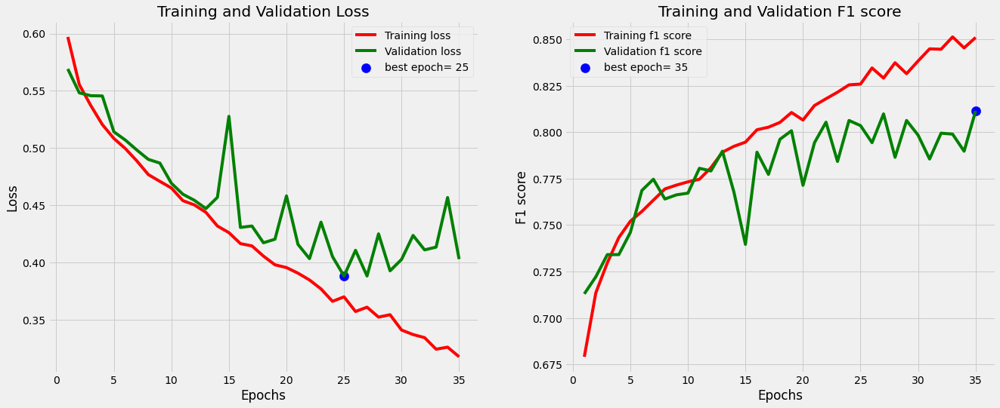

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.91      0.68      0.78       514
     EyeSpot       0.75      0.94      0.83       524

   micro avg       0.81      0.81      0.81      1038
   macro avg       0.83      0.81      0.81      1038
weighted avg       0.83      0.81      0.81      1038
 samples avg       0.81      0.81      0.81      1038

Epoch 1/100
146/146 [==============================] - 3s 12ms/step - loss: 0.6070 - binary_fbeta: 0.6766 - val_loss: 0.5679 - val_binary_fbeta: 0.7102

Epoch 00001: val_binary_fbeta improved from -inf to 0.71022, saving model to best_model.h5
Epoch 2/100
146/146 [==============================] - 1s 10ms/step - loss: 0.5590 - binary_fbeta: 0.7122 - val_loss: 0.5496 - val_binary_fbeta: 0.7199

Epoch 00002: val_binary_fbeta improved from 0.71022 to 0.71993, saving model to best_model.h5
Epoch 3/100
146/146 [==============================] - 2s 11ms/step - loss: 0.541

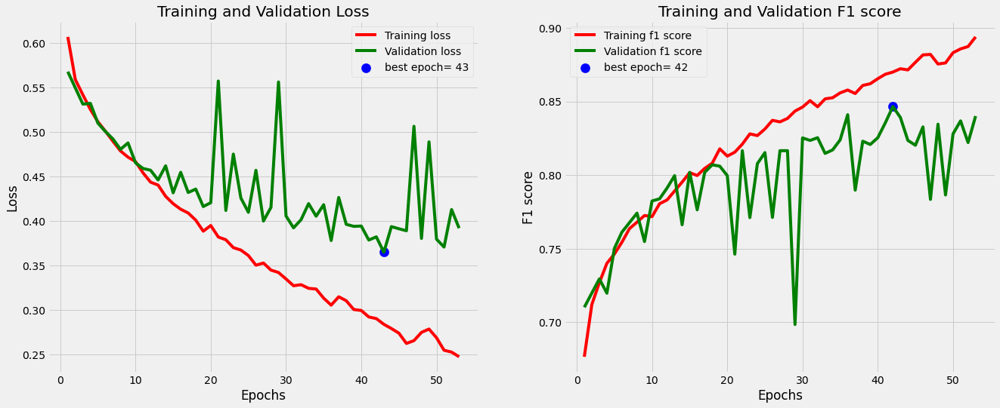

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.86      0.80      0.83       514
     EyeSpot       0.82      0.88      0.85       524

   micro avg       0.84      0.84      0.84      1038
   macro avg       0.84      0.84      0.84      1038
weighted avg       0.84      0.84      0.84      1038
 samples avg       0.84      0.84      0.84      1038

Epoch 1/100
146/146 [==============================] - 2s 9ms/step - loss: 0.6096 - binary_fbeta: 0.6676 - val_loss: 0.5745 - val_binary_fbeta: 0.7140

Epoch 00001: val_binary_fbeta improved from -inf to 0.71402, saving model to best_model.h5
Epoch 2/100
146/146 [==============================] - 1s 7ms/step - loss: 0.5588 - binary_fbeta: 0.7102 - val_loss: 0.5492 - val_binary_fbeta: 0.7232

Epoch 00002: val_binary_fbeta improved from 0.71402 to 0.72321, saving model to best_model.h5
Epoch 3/100
146/146 [==============================] - 1s 9ms/step - loss: 0.5381 -

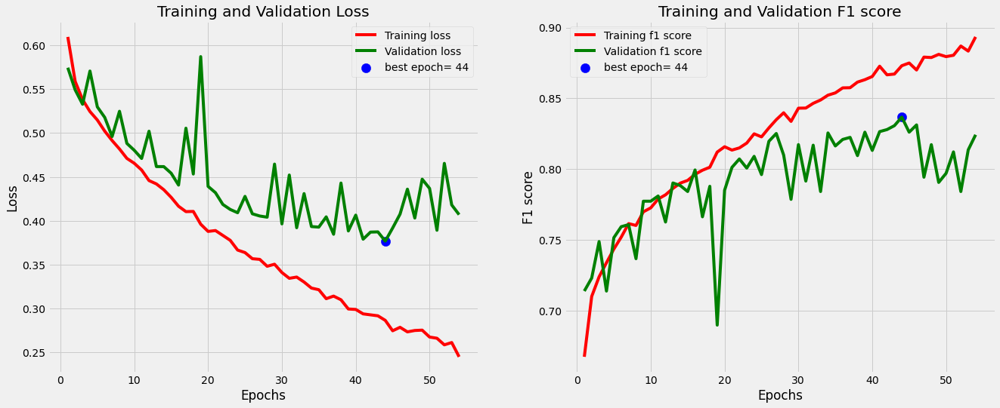

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.82      0.83       514
     EyeSpot       0.83      0.84      0.84       524

   micro avg       0.83      0.83      0.83      1038
   macro avg       0.83      0.83      0.83      1038
weighted avg       0.83      0.83      0.83      1038
 samples avg       0.83      0.83      0.83      1038

Epoch 1/100
146/146 [==============================] - 2s 8ms/step - loss: 0.6135 - binary_fbeta: 0.6716 - val_loss: 0.5457 - val_binary_fbeta: 0.7324

Epoch 00001: val_binary_fbeta improved from -inf to 0.73241, saving model to best_model.h5
Epoch 2/100
146/146 [==============================] - 1s 7ms/step - loss: 0.5586 - binary_fbeta: 0.7142 - val_loss: 0.5262 - val_binary_fbeta: 0.7434

Epoch 00002: val_binary_fbeta improved from 0.73241 to 0.74343, saving model to best_model.h5
Epoch 3/100
146/146 [==============================] - 1s 8ms/step - loss: 0.5426 -

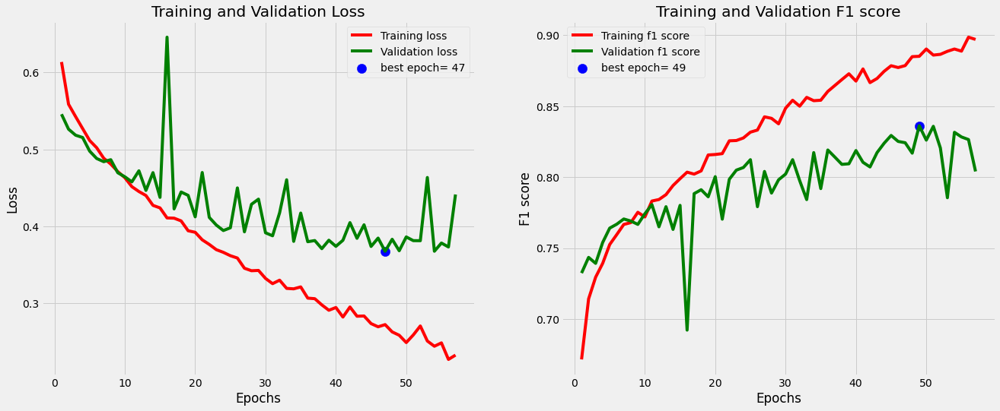

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.87      0.84       514
     EyeSpot       0.86      0.82      0.84       524

   micro avg       0.84      0.84      0.84      1038
   macro avg       0.84      0.84      0.84      1038
weighted avg       0.84      0.84      0.84      1038
 samples avg       0.84      0.84      0.84      1038

Epoch 1/100
146/146 [==============================] - 2s 9ms/step - loss: 0.6134 - binary_fbeta: 0.6734 - val_loss: 0.5691 - val_binary_fbeta: 0.7088

Epoch 00001: val_binary_fbeta improved from -inf to 0.70877, saving model to best_model.h5
Epoch 2/100
146/146 [==============================] - 1s 9ms/step - loss: 0.5661 - binary_fbeta: 0.7049 - val_loss: 0.5468 - val_binary_fbeta: 0.7308

Epoch 00002: val_binary_fbeta improved from 0.70877 to 0.73083, saving model to best_model.h5
Epoch 3/100
146/146 [==============================] - 2s 16ms/step - loss: 0.5462 

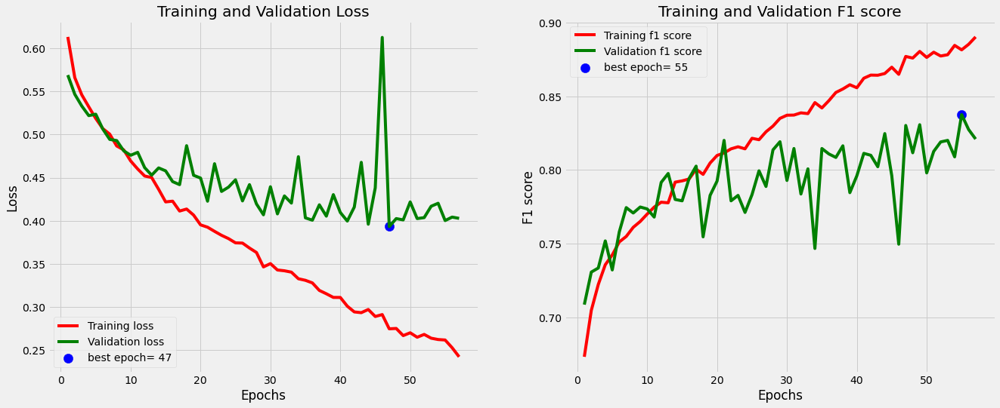

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.83      0.85      0.84       514
     EyeSpot       0.85      0.83      0.84       524

   micro avg       0.84      0.84      0.84      1038
   macro avg       0.84      0.84      0.84      1038
weighted avg       0.84      0.84      0.84      1038
 samples avg       0.84      0.84      0.84      1038


 
Model Performance (f1 score) =  0.8391504287719727


In [109]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_ADASYN, y_ADASYN, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

#### KMeansSMOTE

In [110]:
from imblearn.over_sampling import KMeansSMOTE

oversample = KMeansSMOTE()

x_kmeansmote, y_kmeansmote = oversample.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_kmeansmote))

C:\Users\maria\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1848: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


Counter({1: 5144, 0: 5142})


Epoch 1/100
145/145 [==============================] - 1s 7ms/step - loss: 0.5761 - binary_fbeta: 0.7088 - val_loss: 0.5930 - val_binary_fbeta: 0.7044

Epoch 00001: val_binary_fbeta improved from -inf to 0.70441, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 13ms/step - loss: 0.5167 - binary_fbeta: 0.7453 - val_loss: 0.4994 - val_binary_fbeta: 0.7504

Epoch 00002: val_binary_fbeta improved from 0.70441 to 0.75037, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 5s 31ms/step - loss: 0.4934 - binary_fbeta: 0.7601 - val_loss: 0.4844 - val_binary_fbeta: 0.77040.4937 - binary_fbeta: 0.75

Epoch 00003: val_binary_fbeta improved from 0.75037 to 0.77040, saving model to best_model.h5
Epoch 4/100
145/145 [==============================] - 4s 29ms/step - loss: 0.4812 - binary_fbeta: 0.7661 - val_loss: 0.4713 - val_binary_fbeta: 0.7632

Epoch 00004: val_binary_fbeta did not improve from 0.77040
Epoch 5/100
145/145 [===

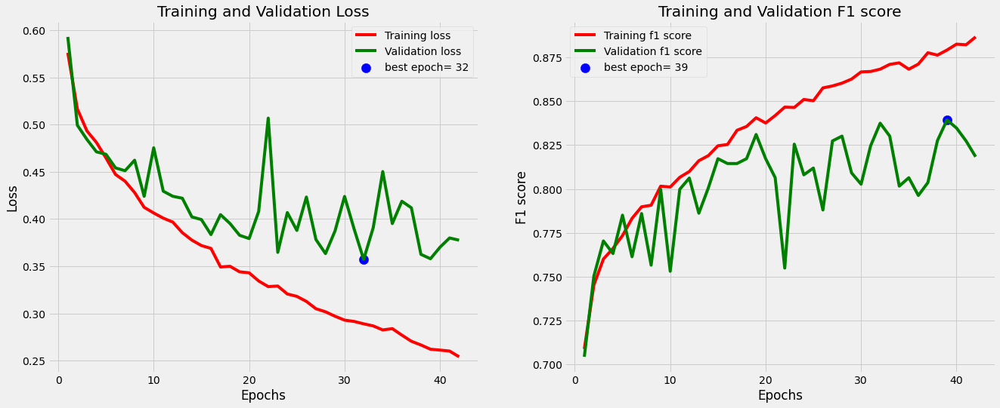

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.88      0.85       514
     EyeSpot       0.87      0.80      0.84       515

   micro avg       0.84      0.84      0.84      1029
   macro avg       0.84      0.84      0.84      1029
weighted avg       0.84      0.84      0.84      1029
 samples avg       0.84      0.84      0.84      1029

Epoch 1/100
145/145 [==============================] - 2s 6ms/step - loss: 0.5697 - binary_fbeta: 0.7188 - val_loss: 0.5362 - val_binary_fbeta: 0.7318

Epoch 00001: val_binary_fbeta improved from -inf to 0.73180, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 4ms/step - loss: 0.5242 - binary_fbeta: 0.7374 - val_loss: 0.5074 - val_binary_fbeta: 0.7447

Epoch 00002: val_binary_fbeta improved from 0.73180 to 0.74467, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 1s 4ms/step - loss: 0.5079 -

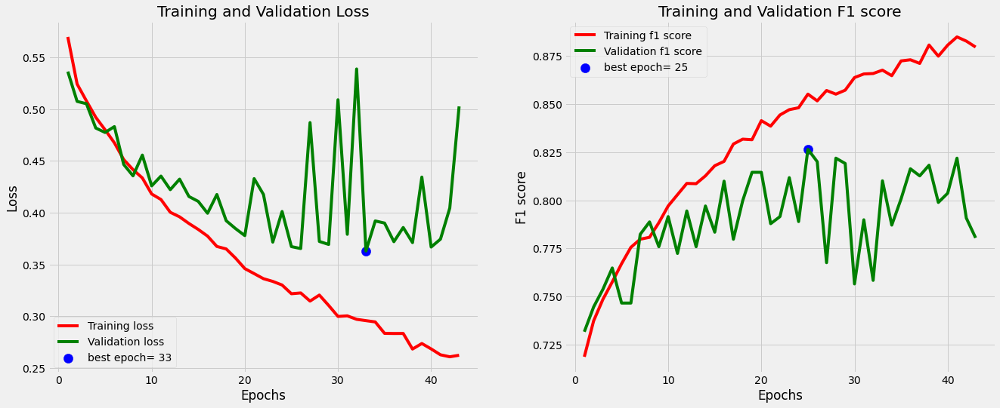

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.84      0.83       514
     EyeSpot       0.84      0.81      0.83       515

   micro avg       0.83      0.83      0.83      1029
   macro avg       0.83      0.83      0.83      1029
weighted avg       0.83      0.83      0.83      1029
 samples avg       0.83      0.83      0.83      1029

Epoch 1/100
145/145 [==============================] - 2s 9ms/step - loss: 0.5708 - binary_fbeta: 0.7084 - val_loss: 0.5314 - val_binary_fbeta: 0.7329

Epoch 00001: val_binary_fbeta improved from -inf to 0.73290, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 1s 4ms/step - loss: 0.5184 - binary_fbeta: 0.7387 - val_loss: 0.5224 - val_binary_fbeta: 0.7320

Epoch 00002: val_binary_fbeta did not improve from 0.73290
Epoch 3/100
145/145 [==============================] - 1s 4ms/step - loss: 0.5018 - binary_fbeta: 0.7500 - val_loss: 0

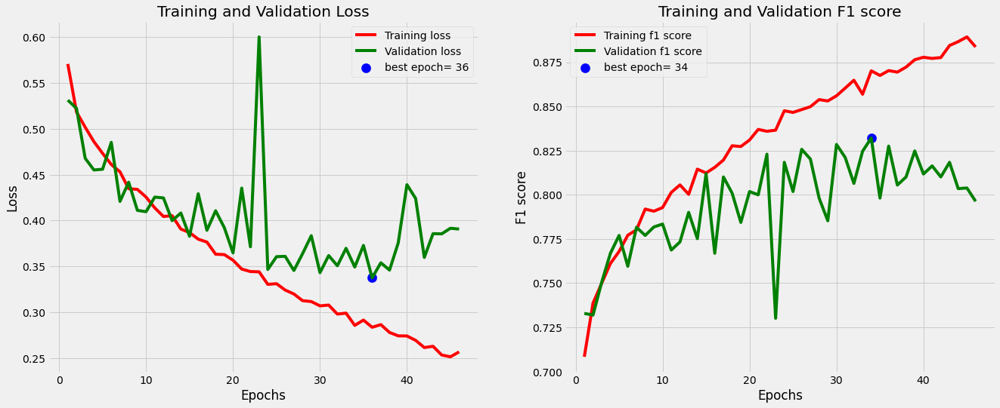

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.86      0.85       514
     EyeSpot       0.86      0.83      0.84       515

   micro avg       0.85      0.85      0.85      1029
   macro avg       0.85      0.85      0.85      1029
weighted avg       0.85      0.85      0.85      1029
 samples avg       0.85      0.85      0.85      1029

Epoch 1/100
145/145 [==============================] - 2s 11ms/step - loss: 0.5626 - binary_fbeta: 0.7152 - val_loss: 0.5231 - val_binary_fbeta: 0.7292

Epoch 00001: val_binary_fbeta improved from -inf to 0.72923, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 12ms/step - loss: 0.5091 - binary_fbeta: 0.7450 - val_loss: 0.5039 - val_binary_fbeta: 0.7393

Epoch 00002: val_binary_fbeta improved from 0.72923 to 0.73934, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 3s 18ms/step - loss: 0.488

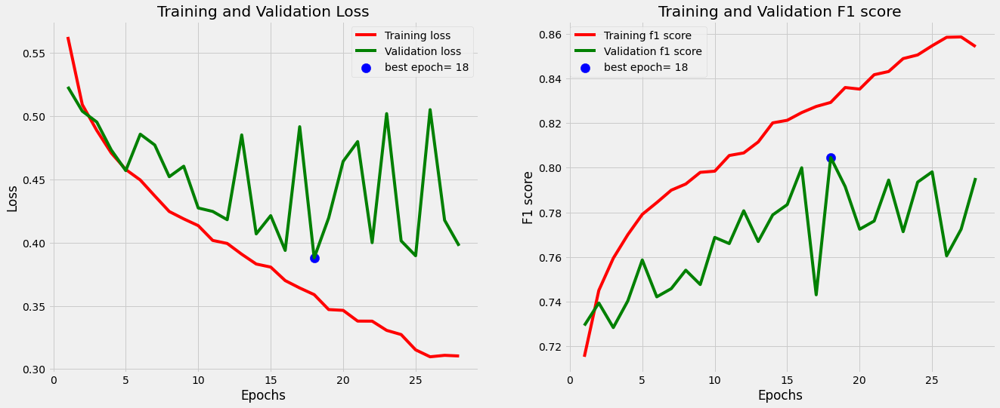

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.82      0.82       514
     EyeSpot       0.82      0.82      0.82       515

   micro avg       0.82      0.82      0.82      1029
   macro avg       0.82      0.82      0.82      1029
weighted avg       0.82      0.82      0.82      1029
 samples avg       0.82      0.82      0.82      1029

Epoch 1/100
145/145 [==============================] - 3s 14ms/step - loss: 0.5691 - binary_fbeta: 0.7093 - val_loss: 0.6055 - val_binary_fbeta: 0.7006

Epoch 00001: val_binary_fbeta improved from -inf to 0.70055, saving model to best_model.h5
Epoch 2/100
145/145 [==============================] - 2s 13ms/step - loss: 0.5148 - binary_fbeta: 0.7485 - val_loss: 0.5261 - val_binary_fbeta: 0.7175

Epoch 00002: val_binary_fbeta improved from 0.70055 to 0.71746, saving model to best_model.h5
Epoch 3/100
145/145 [==============================] - 2s 16ms/step - loss: 0.491

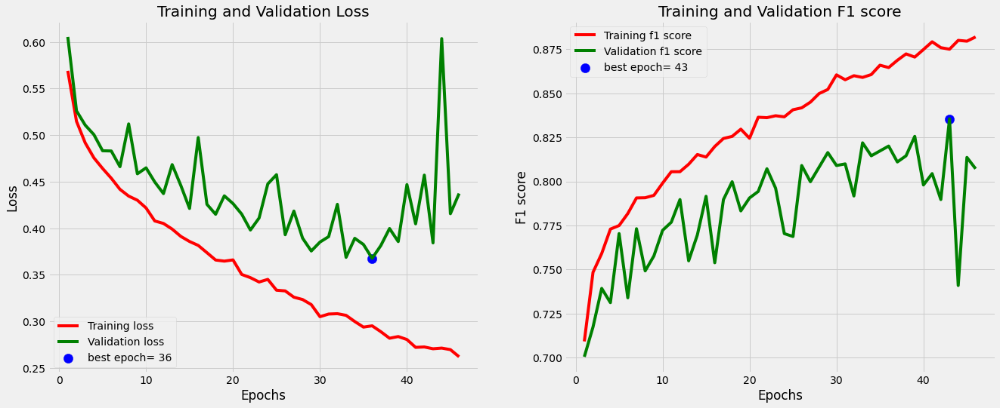

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.79      0.89      0.84       514
     EyeSpot       0.87      0.77      0.82       515

   micro avg       0.83      0.83      0.83      1029
   macro avg       0.83      0.83      0.83      1029
weighted avg       0.83      0.83      0.83      1029
 samples avg       0.83      0.83      0.83      1029


 
Model Performance (f1 score) =  0.830492377281189


In [111]:
f1_scores = []
for i in range(5):
    
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_kmeansmote, y_kmeansmote, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

#### SMOTEENN

In [112]:
from imblearn.combine import SMOTEENN

oversample_undersample = SMOTEENN()

x_smoteenn, y_smoteenn = oversample_undersample.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_smoteenn))

Counter({0: 3149, 1: 1676})


Epoch 1/100
68/68 [==============================] - 3s 25ms/step - loss: 0.5019 - binary_fbeta: 0.7673 - val_loss: 0.4049 - val_binary_fbeta: 0.8259

Epoch 00001: val_binary_fbeta improved from -inf to 0.82589, saving model to best_model.h5
Epoch 2/100
68/68 [==============================] - 2s 29ms/step - loss: 0.3882 - binary_fbeta: 0.8271 - val_loss: 0.3564 - val_binary_fbeta: 0.8340

Epoch 00002: val_binary_fbeta improved from 0.82589 to 0.83404, saving model to best_model.h5
Epoch 3/100
68/68 [==============================] - 2s 31ms/step - loss: 0.3534 - binary_fbeta: 0.8459 - val_loss: 0.3328 - val_binary_fbeta: 0.8435

Epoch 00003: val_binary_fbeta improved from 0.83404 to 0.84347, saving model to best_model.h5
Epoch 4/100
68/68 [==============================] - 1s 22ms/step - loss: 0.3318 - binary_fbeta: 0.8555 - val_loss: 0.3212 - val_binary_fbeta: 0.8474

Epoch 00004: val_binary_fbeta improved from 0.84347 to 0.84738, saving model to best_model.h5
Epoch 5/100
68/68 [====

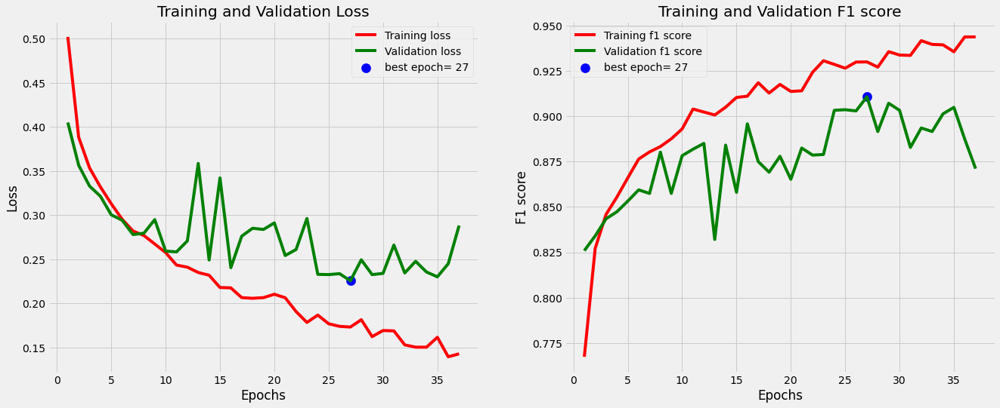

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.94      0.92      0.93       315
     EyeSpot       0.86      0.88      0.87       168

   micro avg       0.91      0.91      0.91       483
   macro avg       0.90      0.90      0.90       483
weighted avg       0.91      0.91      0.91       483
 samples avg       0.91      0.91      0.91       483

Epoch 1/100
68/68 [==============================] - 1s 12ms/step - loss: 0.5064 - binary_fbeta: 0.7561 - val_loss: 0.3939 - val_binary_fbeta: 0.8210

Epoch 00001: val_binary_fbeta improved from -inf to 0.82104, saving model to best_model.h5
Epoch 2/100
68/68 [==============================] - 0s 5ms/step - loss: 0.3959 - binary_fbeta: 0.8187 - val_loss: 0.3475 - val_binary_fbeta: 0.8347

Epoch 00002: val_binary_fbeta improved from 0.82104 to 0.83471, saving model to best_model.h5
Epoch 3/100
68/68 [==============================] - 0s 5ms/step - loss: 0.3698 - bina

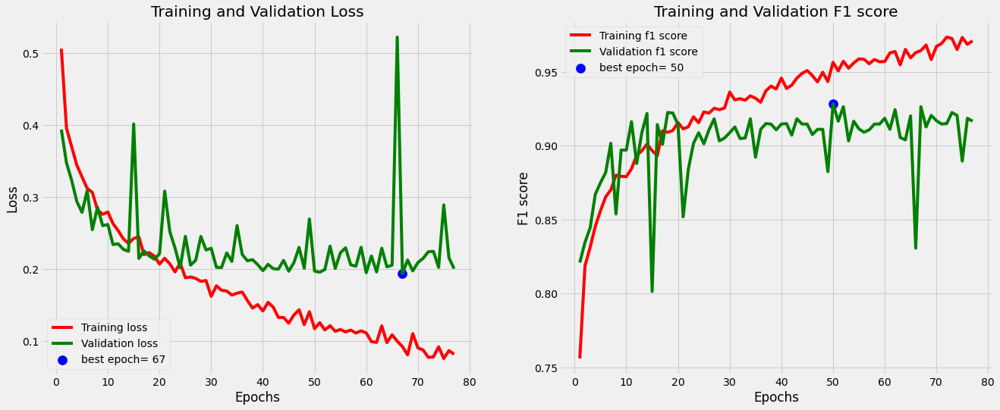

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.96      0.92      0.94       315
     EyeSpot       0.87      0.93      0.90       168

   micro avg       0.93      0.93      0.93       483
   macro avg       0.92      0.93      0.92       483
weighted avg       0.93      0.93      0.93       483
 samples avg       0.93      0.93      0.93       483

Epoch 1/100
68/68 [==============================] - 2s 16ms/step - loss: 0.5035 - binary_fbeta: 0.7534 - val_loss: 0.4307 - val_binary_fbeta: 0.7752

Epoch 00001: val_binary_fbeta improved from -inf to 0.77517, saving model to best_model.h5
Epoch 2/100
68/68 [==============================] - 1s 10ms/step - loss: 0.3821 - binary_fbeta: 0.8286 - val_loss: 0.3996 - val_binary_fbeta: 0.8054

Epoch 00002: val_binary_fbeta improved from 0.77517 to 0.80541, saving model to best_model.h5
Epoch 3/100
68/68 [==============================] - 1s 11ms/step - loss: 0.3479 - bi

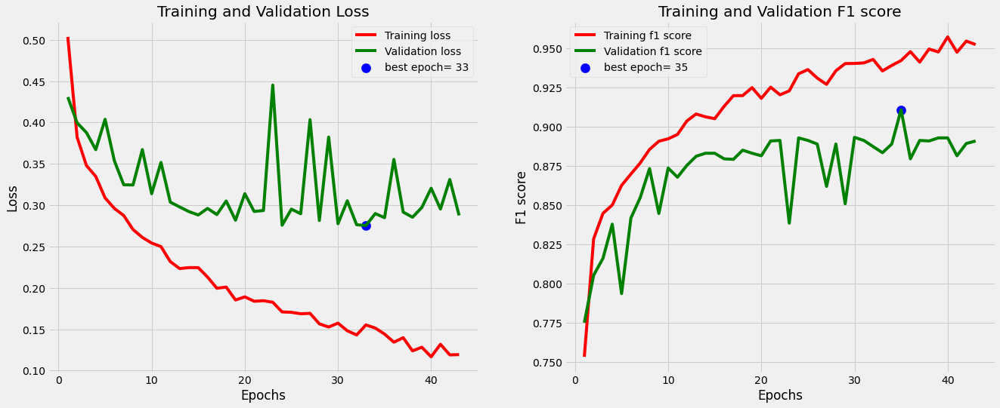

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.92      0.94      0.93       315
     EyeSpot       0.89      0.85      0.87       168

   micro avg       0.91      0.91      0.91       483
   macro avg       0.90      0.89      0.90       483
weighted avg       0.91      0.91      0.91       483
 samples avg       0.91      0.91      0.91       483

Epoch 1/100
68/68 [==============================] - 2s 11ms/step - loss: 0.5026 - binary_fbeta: 0.7536 - val_loss: 0.3965 - val_binary_fbeta: 0.8357

Epoch 00001: val_binary_fbeta improved from -inf to 0.83566, saving model to best_model.h5
Epoch 2/100
68/68 [==============================] - 0s 6ms/step - loss: 0.4014 - binary_fbeta: 0.8078 - val_loss: 0.3432 - val_binary_fbeta: 0.8493

Epoch 00002: val_binary_fbeta improved from 0.83566 to 0.84933, saving model to best_model.h5
Epoch 3/100
68/68 [==============================] - 0s 6ms/step - loss: 0.3761 - bina

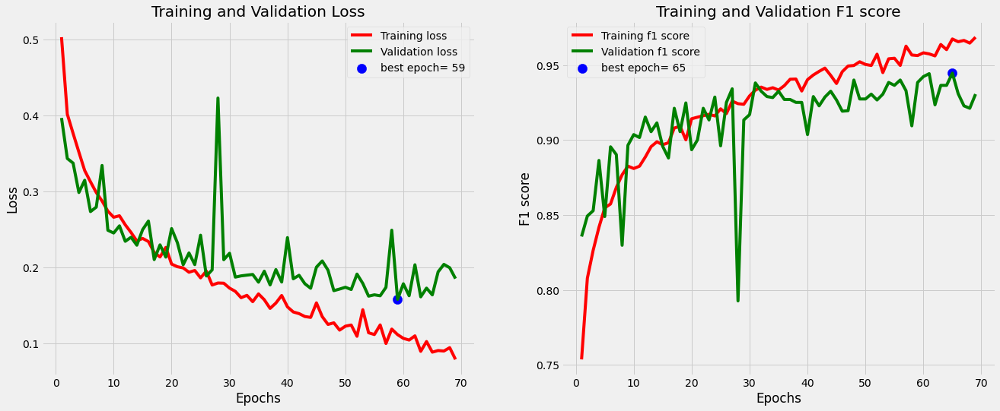

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.96      0.96      0.96       315
     EyeSpot       0.93      0.92      0.93       168

   micro avg       0.95      0.95      0.95       483
   macro avg       0.94      0.94      0.94       483
weighted avg       0.95      0.95      0.95       483
 samples avg       0.95      0.95      0.95       483

Epoch 1/100
68/68 [==============================] - 2s 16ms/step - loss: 0.5937 - binary_fbeta: 0.7043 - val_loss: 0.4601 - val_binary_fbeta: 0.8005

Epoch 00001: val_binary_fbeta improved from -inf to 0.80050, saving model to best_model.h5
Epoch 2/100
68/68 [==============================] - 1s 12ms/step - loss: 0.4179 - binary_fbeta: 0.8171 - val_loss: 0.3735 - val_binary_fbeta: 0.8366

Epoch 00002: val_binary_fbeta improved from 0.80050 to 0.83661, saving model to best_model.h5
Epoch 3/100
68/68 [==============================] - 1s 15ms/step - loss: 0.3662 - bi

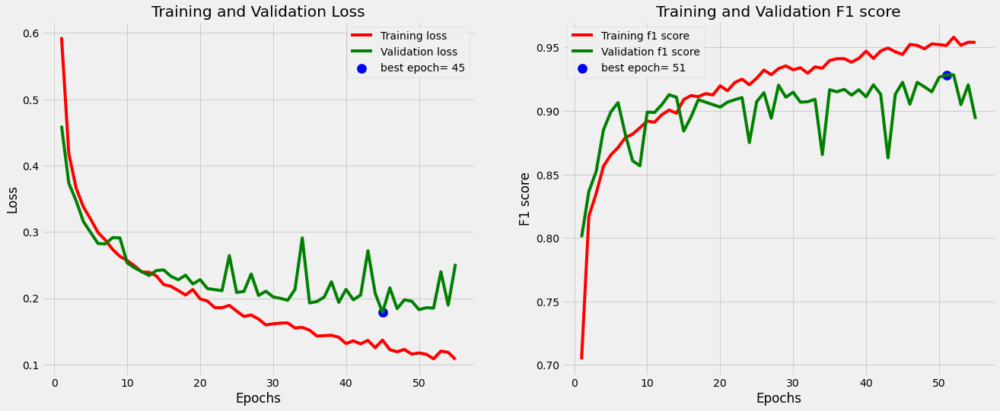

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.97      0.92      0.94       315
     EyeSpot       0.86      0.94      0.90       168

   micro avg       0.93      0.93      0.93       483
   macro avg       0.92      0.93      0.92       483
weighted avg       0.93      0.93      0.93       483
 samples avg       0.93      0.93      0.93       483


 
Model Performance (f1 score) =  0.9316405653953552


In [113]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_smoteenn, y_smoteenn, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

#### SMOTETomek

In [14]:
from imblearn.combine import SMOTETomek

oversample_undersample = SMOTETomek()

x_smotetomek, y_smotetomek = oversample_undersample.fit_resample(x_train_dataset, y_train_dataset)

print(Counter(y_smotetomek))

Counter({1: 5068, 0: 5068})


Epoch 1/100
143/143 [==============================] - 2s 7ms/step - loss: 0.5948 - binary_fbeta: 0.6906 - val_loss: 0.5523 - val_binary_fbeta: 0.6969

Epoch 00001: val_binary_fbeta improved from -inf to 0.69687, saving model to best_model.h5
Epoch 2/100
143/143 [==============================] - 1s 7ms/step - loss: 0.5423 - binary_fbeta: 0.7284 - val_loss: 0.5301 - val_binary_fbeta: 0.7158

Epoch 00002: val_binary_fbeta improved from 0.69687 to 0.71578, saving model to best_model.h5
Epoch 3/100
143/143 [==============================] - 2s 17ms/step - loss: 0.5229 - binary_fbeta: 0.7398 - val_loss: 0.5174 - val_binary_fbeta: 0.7273

Epoch 00003: val_binary_fbeta improved from 0.71578 to 0.72732, saving model to best_model.h5
Epoch 4/100
143/143 [==============================] - 3s 22ms/step - loss: 0.5076 - binary_fbeta: 0.7499 - val_loss: 0.4953 - val_binary_fbeta: 0.7462ETA: 1s - loss: 0.5176 - bi - ETA: 0s - loss: 0.5130 - binary_fbeta: 0.74 - ETA: 0s - loss: 0.5137 - binary_fbeta

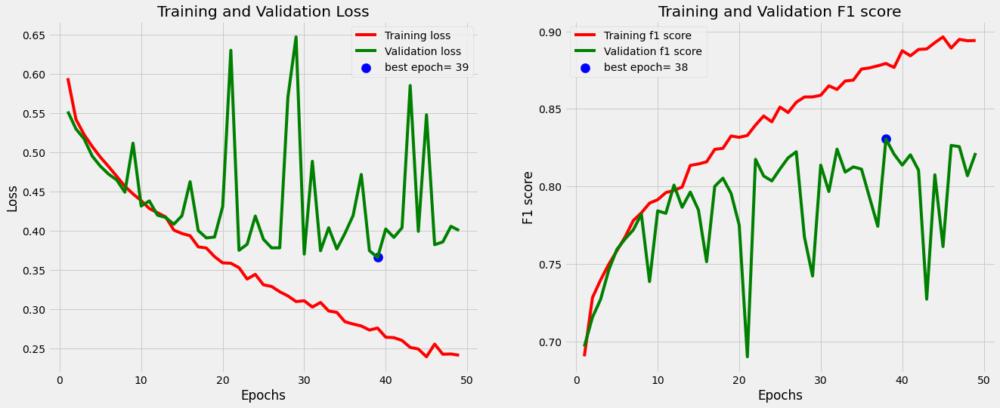

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.80      0.83       507
     EyeSpot       0.81      0.86      0.83       507

   micro avg       0.83      0.83      0.83      1014
   macro avg       0.83      0.83      0.83      1014
weighted avg       0.83      0.83      0.83      1014
 samples avg       0.83      0.83      0.83      1014

Epoch 1/100
143/143 [==============================] - 2s 10ms/step - loss: 0.5819 - binary_fbeta: 0.7014 - val_loss: 0.5395 - val_binary_fbeta: 0.7238

Epoch 00001: val_binary_fbeta improved from -inf to 0.72385, saving model to best_model.h5
Epoch 2/100
143/143 [==============================] - 1s 7ms/step - loss: 0.5354 - binary_fbeta: 0.7295 - val_loss: 0.5397 - val_binary_fbeta: 0.7188

Epoch 00002: val_binary_fbeta did not improve from 0.72385
Epoch 3/100
143/143 [==============================] - 2s 12ms/step - loss: 0.5089 - binary_fbeta: 0.7527 - val_loss:

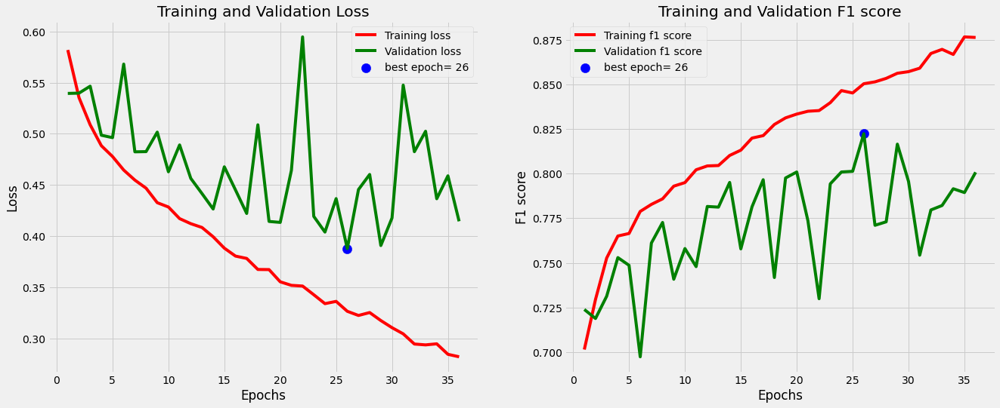

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.80      0.82       507
     EyeSpot       0.81      0.85      0.83       507

   micro avg       0.82      0.82      0.82      1014
   macro avg       0.82      0.82      0.82      1014
weighted avg       0.82      0.82      0.82      1014
 samples avg       0.82      0.82      0.82      1014

Epoch 1/100
143/143 [==============================] - 2s 7ms/step - loss: 0.5814 - binary_fbeta: 0.6995 - val_loss: 0.5439 - val_binary_fbeta: 0.7233

Epoch 00001: val_binary_fbeta improved from -inf to 0.72331, saving model to best_model.h5
Epoch 2/100
143/143 [==============================] - 1s 5ms/step - loss: 0.5271 - binary_fbeta: 0.7371 - val_loss: 0.5124 - val_binary_fbeta: 0.7412

Epoch 00002: val_binary_fbeta improved from 0.72331 to 0.74117, saving model to best_model.h5
Epoch 3/100
143/143 [==============================] - 1s 5ms/step - loss: 0.5070 -

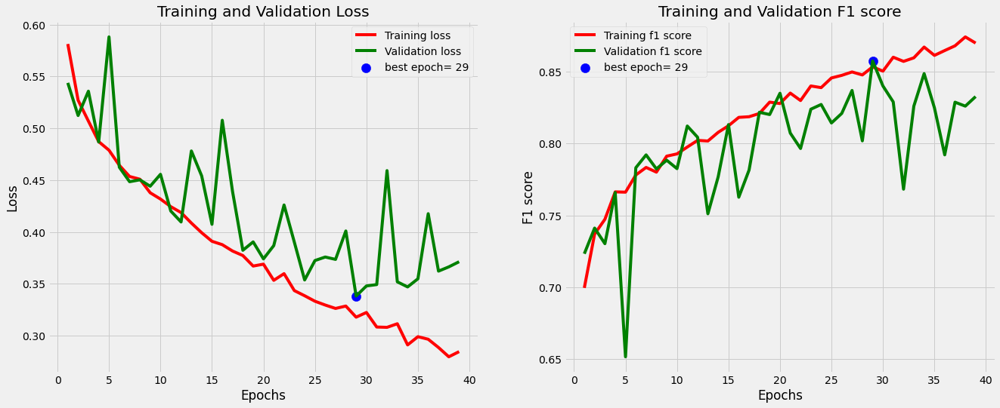

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.88      0.86       507
     EyeSpot       0.87      0.83      0.85       507

   micro avg       0.86      0.86      0.86      1014
   macro avg       0.86      0.86      0.86      1014
weighted avg       0.86      0.86      0.86      1014
 samples avg       0.86      0.86      0.86      1014

Epoch 1/100
143/143 [==============================] - 4s 21ms/step - loss: 0.5973 - binary_fbeta: 0.6886 - val_loss: 0.5778 - val_binary_fbeta: 0.6985

Epoch 00001: val_binary_fbeta improved from -inf to 0.69846, saving model to best_model.h5
Epoch 2/100
143/143 [==============================] - 3s 18ms/step - loss: 0.5401 - binary_fbeta: 0.7266 - val_loss: 0.5358 - val_binary_fbeta: 0.7397

Epoch 00002: val_binary_fbeta improved from 0.69846 to 0.73966, saving model to best_model.h5
Epoch 3/100
143/143 [==============================] - 1s 10ms/step - loss: 0.517

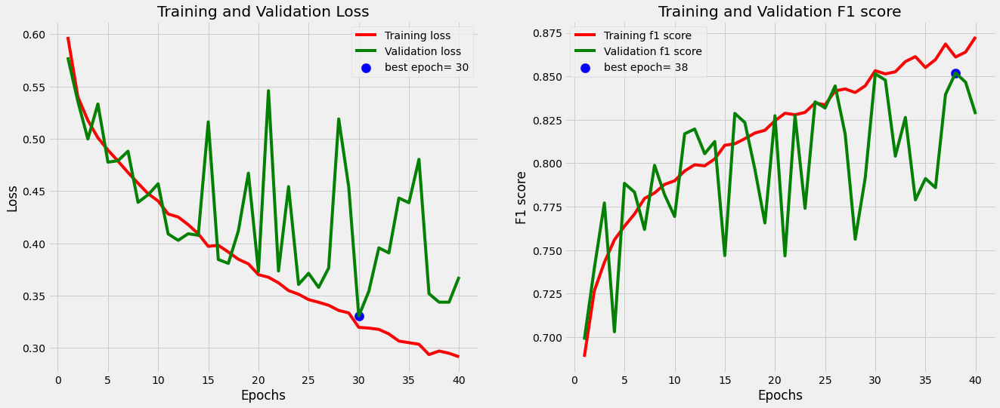

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.81      0.91      0.86       507
     EyeSpot       0.90      0.79      0.84       507

   micro avg       0.85      0.85      0.85      1014
   macro avg       0.86      0.85      0.85      1014
weighted avg       0.86      0.85      0.85      1014
 samples avg       0.85      0.85      0.85      1014

Epoch 1/100
143/143 [==============================] - 2s 8ms/step - loss: 0.5927 - binary_fbeta: 0.6929 - val_loss: 0.5324 - val_binary_fbeta: 0.7325

Epoch 00001: val_binary_fbeta improved from -inf to 0.73246, saving model to best_model.h5
Epoch 2/100
143/143 [==============================] - 1s 6ms/step - loss: 0.5360 - binary_fbeta: 0.7315 - val_loss: 0.5155 - val_binary_fbeta: 0.7314

Epoch 00002: val_binary_fbeta did not improve from 0.73246
Epoch 3/100
143/143 [==============================] - 1s 6ms/step - loss: 0.5200 - binary_fbeta: 0.7433 - val_loss: 0

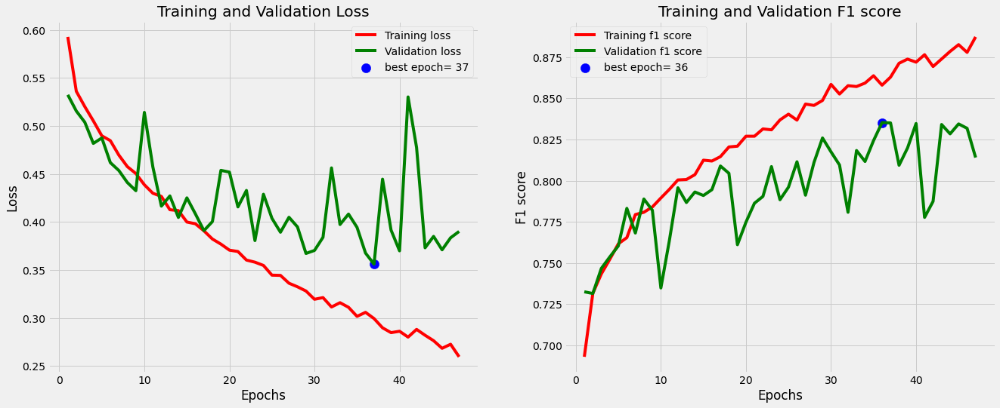

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.86      0.84       507
     EyeSpot       0.85      0.81      0.83       507

   micro avg       0.84      0.84      0.84      1014
   macro avg       0.84      0.84      0.84      1014
weighted avg       0.84      0.84      0.84      1014
 samples avg       0.84      0.84      0.84      1014


 
Model Performance (f1 score) =  0.8346945643424988


In [114]:
f1_scores = []
for i in range(5):
    
    # Define Model
    model = tf.keras.Sequential([
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(50, activation='relu'),
        tf.keras.layers.Dense(2, activation='softmax')
    ])
    
    f1score = multilayer_perceptron(model, x_smotetomek, y_smotetomek, BATCH_SIZE = 64, epochs=100, patience=10)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("\n \nModel Performance (f1 score) = ", f1score)

## 5. Convolutional Neural Networks

In [280]:
#Reshape data
x_train_dataset_CNN = x_train_dataset.reshape((-1,30, 30, 3))
x_test_CNN = x_test.reshape(-1, 30, 30, 3)
print('Xtrain shape: ',x_train_dataset_CNN.shape)
print('Xtest shape: ', x_test_CNN.shape)

Xtrain shape:  (8273, 30, 30, 3)
Xtest shape:  (1367, 30, 30, 3)


In [30]:
def CNN_model(model, x_train_dataset, y_train_dataset, epochs, batch_size, patience):

    class_names = ['Spot', 'EyeSpot']
    
    x_train_dataset_CNN = x_train_dataset.reshape((-1,30, 30, 3))
    
    x_train_dataset_CNN = x_train_dataset_CNN.astype('float32')
    x_train_dataset_CNN = x_train_dataset_CNN / 255.
    
    # Cross-validation:
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(x_train_dataset_CNN, y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    # Convert labels into one-hot-encoding format
    Ytrain = to_categorical(Ytrain)
    Ytest = to_categorical(Ytest)
    
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
    
    mc = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_binary_fbeta', mode='max', verbose=1, save_best_only=True)
    
    # como tf.keras.optimizers.SGD 
    model.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False), optimizer=keras.optimizers.Adam(),metrics=[binary_fbeta])
    
    train = model.fit(Xtrain, Ytrain, batch_size=batch_size, epochs=epochs, verbose = 1, callbacks=[es, mc], validation_data=(Xtest, Ytest))
    
    saved_model = load_model('best_model.h5', custom_objects={"binary_fbeta": binary_fbeta})
        
    test_loss, test_acc = saved_model.evaluate(Xtest,  Ytest, verbose=0)

    print('\nTest accuracy (f1-score):', test_acc)
    
    # predicting the testing set
    binary_ypred = saved_model.predict(Xtest)

    # one_hot encoding predictions 
    binary_ypred = np.array(binary_ypred >= 0.5, dtype=np.float32)
    
    # ---------- plot learning curves:
    # Plot the training and validation data
    tacc=train.history['binary_fbeta']
    tloss=train.history['loss']
    vacc=train.history['val_binary_fbeta']
    vloss=train.history['val_loss']
    
    index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
    val_lowest=vloss[index_loss]
    index_acc=np.argmax(vacc)
    acc_highest=vacc[index_acc]
    
    plt.style.use('fivethirtyeight')
    sc_label='best epoch= '+ str(index_loss+1)
    vc_label='best epoch= '+ str(index_acc + 1)
    
    fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
    axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
    axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
    axes[0].set_title('Training and Validation Loss')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()
    axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training f1 score')
    axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation f1 scofre')
    axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
    axes[1].set_title('Training and Validation F1 score')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('F1 score')
    axes[1].legend()
    plt.tight_layout
    plt.show()
    # -------------------
    
    clr = classification_report(Ytest, binary_ypred, target_names=class_names)
    print("Classification Report:\n----------------------\n", clr)
    
    return test_acc

### CNN model #1

Epoch 1/20
143/143 [==============================] - 22s 152ms/step - loss: 0.4476 - binary_fbeta: 0.7646 - val_loss: 0.4446 - val_binary_fbeta: 0.7584

Epoch 00001: val_binary_fbeta improved from -inf to 0.75839, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 37s 256ms/step - loss: 0.3595 - binary_fbeta: 0.8244 - val_loss: 0.3812 - val_binary_fbeta: 0.8035

Epoch 00002: val_binary_fbeta improved from 0.75839 to 0.80349, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 34s 239ms/step - loss: 0.3166 - binary_fbeta: 0.8523 - val_loss: 0.3982 - val_binary_fbeta: 0.8143

Epoch 00003: val_binary_fbeta improved from 0.80349 to 0.81431, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 30s 208ms/step - loss: 0.2779 - binary_fbeta: 0.8751 - val_loss: 0.3557 - val_binary_fbeta: 0.8352

Epoch 00004: val_binary_fbeta improved from 0.81431 to 0.83518, saving model to best_model.h5
Epoch 5/20


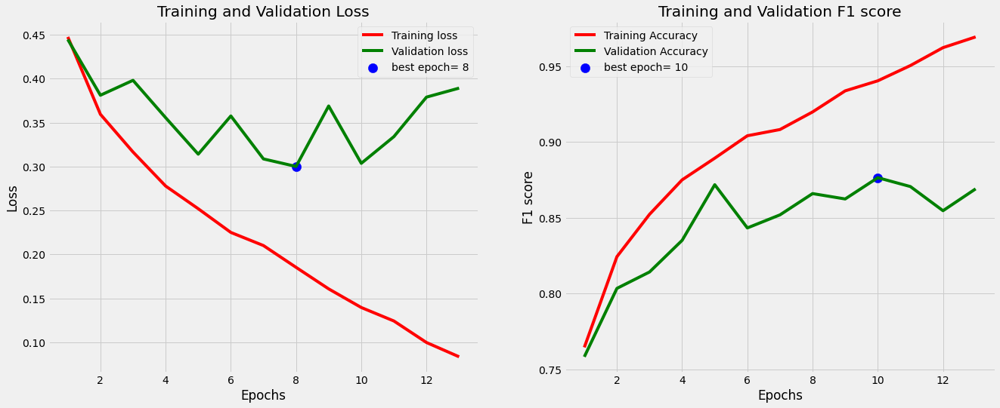

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.86      0.88       507
     EyeSpot       0.87      0.89      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 37s 239ms/step - loss: 0.4568 - binary_fbeta: 0.7563 - val_loss: 0.3596 - val_binary_fbeta: 0.8185

Epoch 00001: val_binary_fbeta improved from -inf to 0.81850, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 30s 214ms/step - loss: 0.3436 - binary_fbeta: 0.8337 - val_loss: 0.3467 - val_binary_fbeta: 0.8294

Epoch 00002: val_binary_fbeta improved from 0.81850 to 0.82943, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 31s 215ms/step - loss: 0.

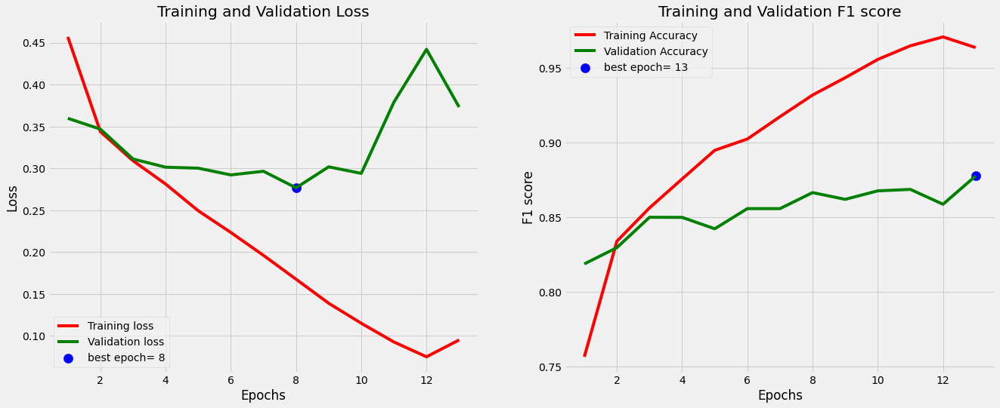

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.93      0.88       507
     EyeSpot       0.92      0.83      0.87       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 39s 264ms/step - loss: 0.4591 - binary_fbeta: 0.7598 - val_loss: 0.3556 - val_binary_fbeta: 0.8466

Epoch 00001: val_binary_fbeta improved from -inf to 0.84657, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 30s 211ms/step - loss: 0.3484 - binary_fbeta: 0.8341 - val_loss: 0.3365 - val_binary_fbeta: 0.8428

Epoch 00002: val_binary_fbeta did not improve from 0.84657
Epoch 3/20
143/143 [==============================] - 40s 282ms/step - loss: 0.3203 - binary_fbeta: 0.8478 - val_l

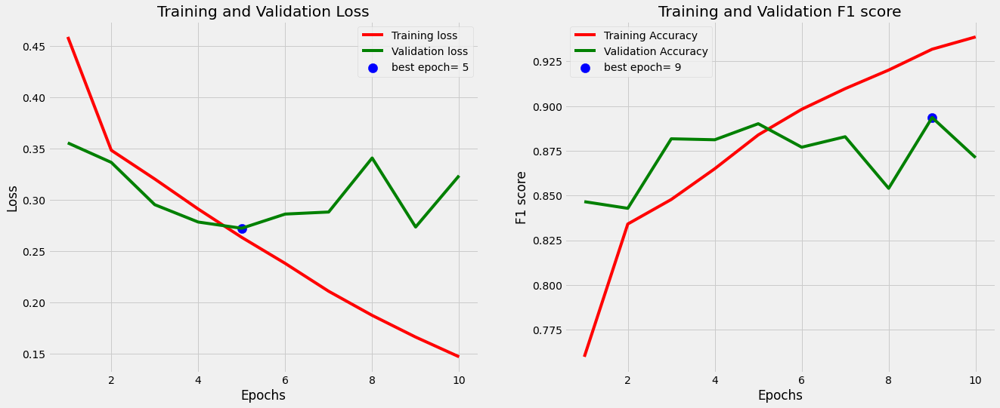

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.91      0.88      0.89       507
     EyeSpot       0.88      0.91      0.90       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 47s 317ms/step - loss: 0.4360 - binary_fbeta: 0.7748 - val_loss: 0.4128 - val_binary_fbeta: 0.8023

Epoch 00001: val_binary_fbeta improved from -inf to 0.80226, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 65s 456ms/step - loss: 0.3474 - binary_fbeta: 0.8374 - val_loss: 0.3364 - val_binary_fbeta: 0.8423

Epoch 00002: val_binary_fbeta improved from 0.80226 to 0.84230, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 55s 383ms/step - loss: 0.

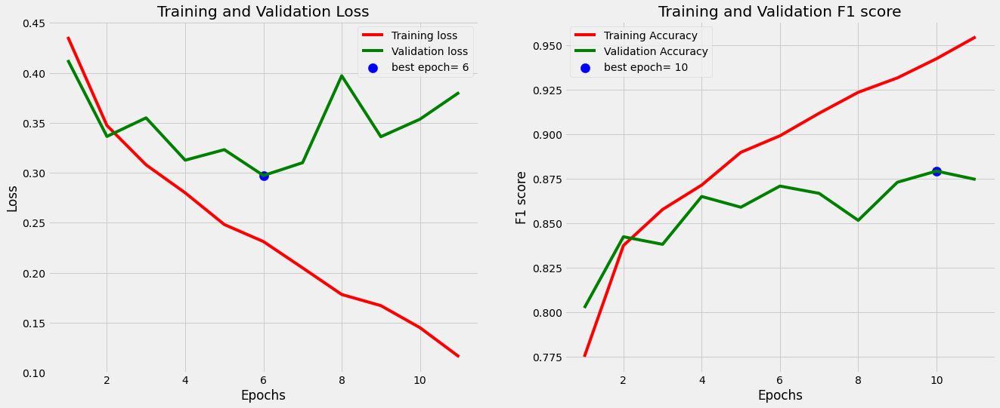

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.88      0.88       507
     EyeSpot       0.88      0.88      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 49s 322ms/step - loss: 0.4409 - binary_fbeta: 0.7757 - val_loss: 0.4798 - val_binary_fbeta: 0.7525

Epoch 00001: val_binary_fbeta improved from -inf to 0.75253, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 43s 300ms/step - loss: 0.3472 - binary_fbeta: 0.8301 - val_loss: 0.3319 - val_binary_fbeta: 0.8472

Epoch 00002: val_binary_fbeta improved from 0.75253 to 0.84719, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 45s 316ms/step - loss: 0.

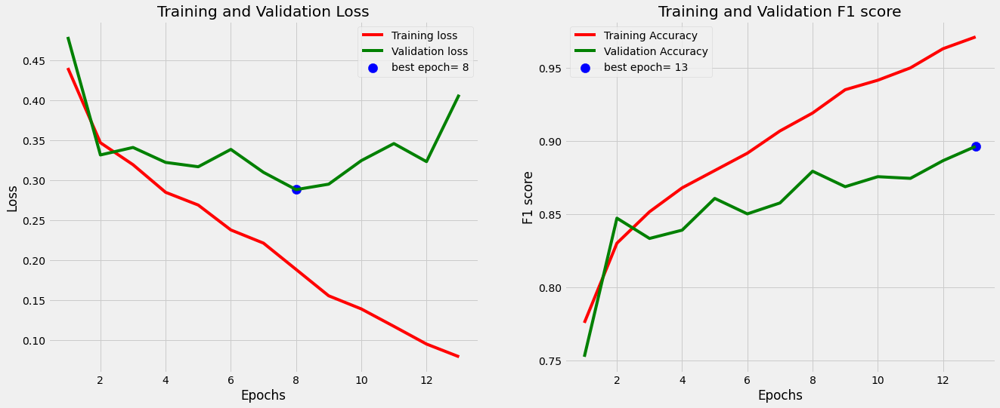

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.92      0.90       507
     EyeSpot       0.92      0.87      0.89       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.90      0.90      0.90      1014
weighted avg       0.90      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Model accuracy =  0.8786398768424988


In [22]:
#Define parameters
batch_size = 64
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters=32, kernel_size=(3, 3),activation= LeakyReLU(alpha=0.1),input_shape=(30, 30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Conv2D(128, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

### CNN model #2

Epoch 1/20
143/143 [==============================] - 27s 183ms/step - loss: 0.4463 - binary_fbeta: 0.7725 - val_loss: 0.3878 - val_binary_fbeta: 0.8181

Epoch 00001: val_binary_fbeta improved from -inf to 0.81814, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 24s 170ms/step - loss: 0.3482 - binary_fbeta: 0.8293 - val_loss: 0.3719 - val_binary_fbeta: 0.8180

Epoch 00002: val_binary_fbeta did not improve from 0.81814
Epoch 3/20
143/143 [==============================] - 34s 239ms/step - loss: 0.3132 - binary_fbeta: 0.8564 - val_loss: 0.3329 - val_binary_fbeta: 0.8427

Epoch 00003: val_binary_fbeta improved from 0.81814 to 0.84274, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 35s 242ms/step - loss: 0.2792 - binary_fbeta: 0.8732 - val_loss: 0.3548 - val_binary_fbeta: 0.8566

Epoch 00004: val_binary_fbeta improved from 0.84274 to 0.85659, saving model to best_model.h5
Epoch 5/20
143/143 [==========================

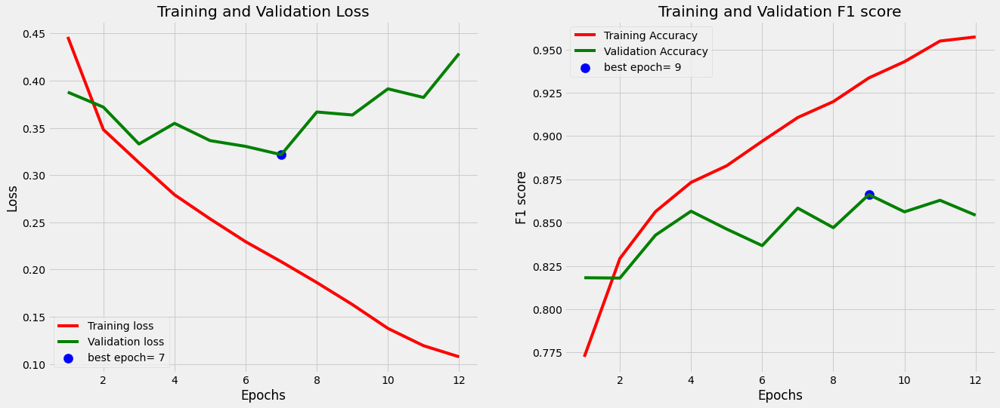

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.90      0.87       507
     EyeSpot       0.89      0.84      0.86       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
143/143 [==============================] - 27s 179ms/step - loss: 0.4702 - binary_fbeta: 0.7502 - val_loss: 0.4663 - val_binary_fbeta: 0.7691

Epoch 00001: val_binary_fbeta improved from -inf to 0.76913, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 22s 158ms/step - loss: 0.3758 - binary_fbeta: 0.8179 - val_loss: 0.3676 - val_binary_fbeta: 0.8252

Epoch 00002: val_binary_fbeta improved from 0.76913 to 0.82516, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 22s 157ms/step - loss: 0.

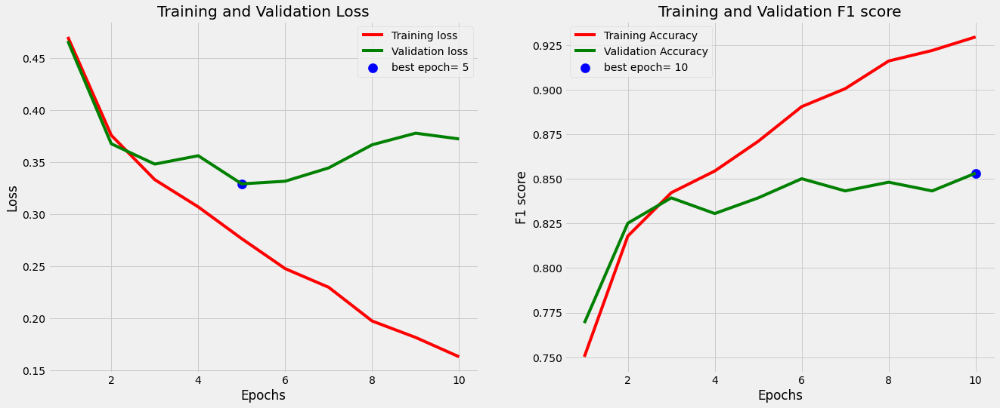

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.82      0.91      0.86       507
     EyeSpot       0.89      0.80      0.84       507

   micro avg       0.85      0.85      0.85      1014
   macro avg       0.86      0.85      0.85      1014
weighted avg       0.86      0.85      0.85      1014
 samples avg       0.85      0.85      0.85      1014

Epoch 1/20
143/143 [==============================] - 26s 146ms/step - loss: 0.4390 - binary_fbeta: 0.7739 - val_loss: 0.4015 - val_binary_fbeta: 0.7980

Epoch 00001: val_binary_fbeta improved from -inf to 0.79800, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 23s 162ms/step - loss: 0.3532 - binary_fbeta: 0.8323 - val_loss: 0.3350 - val_binary_fbeta: 0.8472

Epoch 00002: val_binary_fbeta improved from 0.79800 to 0.84719, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 18s 126ms/step - loss: 0.

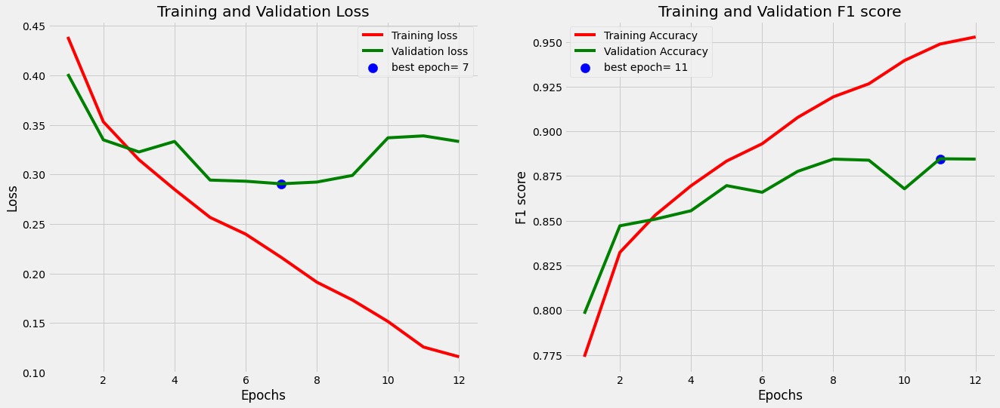

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.86      0.92      0.89       507
     EyeSpot       0.91      0.85      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.89      0.88      0.88      1014
weighted avg       0.89      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 31s 205ms/step - loss: 0.4475 - binary_fbeta: 0.7704 - val_loss: 0.3653 - val_binary_fbeta: 0.8190

Epoch 00001: val_binary_fbeta improved from -inf to 0.81905, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 29s 206ms/step - loss: 0.3560 - binary_fbeta: 0.8296 - val_loss: 0.3279 - val_binary_fbeta: 0.8562

Epoch 00002: val_binary_fbeta improved from 0.81905 to 0.85616, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 30s 210ms/step - loss: 0.

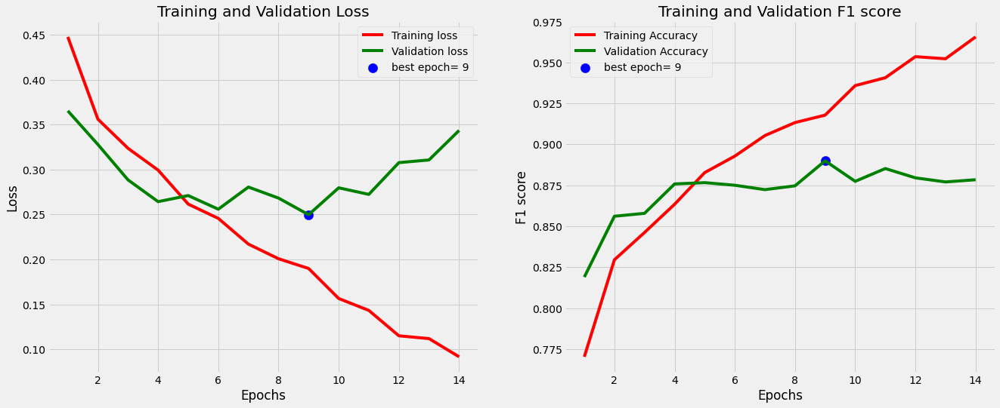

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.91      0.89       507
     EyeSpot       0.91      0.87      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 36s 240ms/step - loss: 0.4847 - binary_fbeta: 0.7418 - val_loss: 0.4048 - val_binary_fbeta: 0.7982

Epoch 00001: val_binary_fbeta improved from -inf to 0.79818, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 36s 250ms/step - loss: 0.3741 - binary_fbeta: 0.8185 - val_loss: 0.3321 - val_binary_fbeta: 0.8379

Epoch 00002: val_binary_fbeta improved from 0.79818 to 0.83785, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 49s 346ms/step - loss: 0.

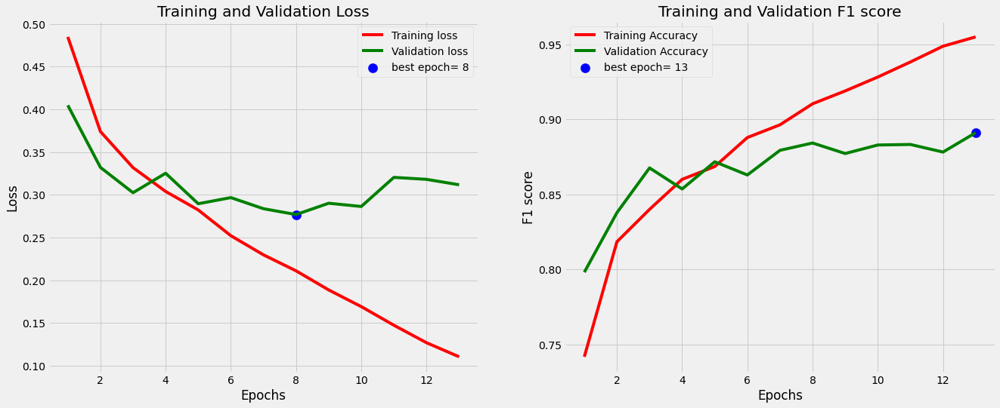

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.93      0.90       507
     EyeSpot       0.92      0.86      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Model accuracy =  0.8844104409217834


In [23]:
#Define parameters
batch_size = 64
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30, 30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

### CNN model #3

Epoch 1/20
143/143 [==============================] - 46s 308ms/step - loss: 0.4689 - binary_fbeta: 0.7593 - val_loss: 0.4060 - val_binary_fbeta: 0.8012

Epoch 00001: val_binary_fbeta improved from -inf to 0.80118, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 44s 307ms/step - loss: 0.3751 - binary_fbeta: 0.8137 - val_loss: 0.3550 - val_binary_fbeta: 0.8244

Epoch 00002: val_binary_fbeta improved from 0.80118 to 0.82436, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 51s 359ms/step - loss: 0.3298 - binary_fbeta: 0.8412 - val_loss: 0.3262 - val_binary_fbeta: 0.8523

Epoch 00003: val_binary_fbeta improved from 0.82436 to 0.85232, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 46s 321ms/step - loss: 0.2977 - binary_fbeta: 0.8629 - val_loss: 0.3255 - val_binary_fbeta: 0.8558

Epoch 00004: val_binary_fbeta improved from 0.85232 to 0.85579, saving model to best_model.h5
Epoch 5/20


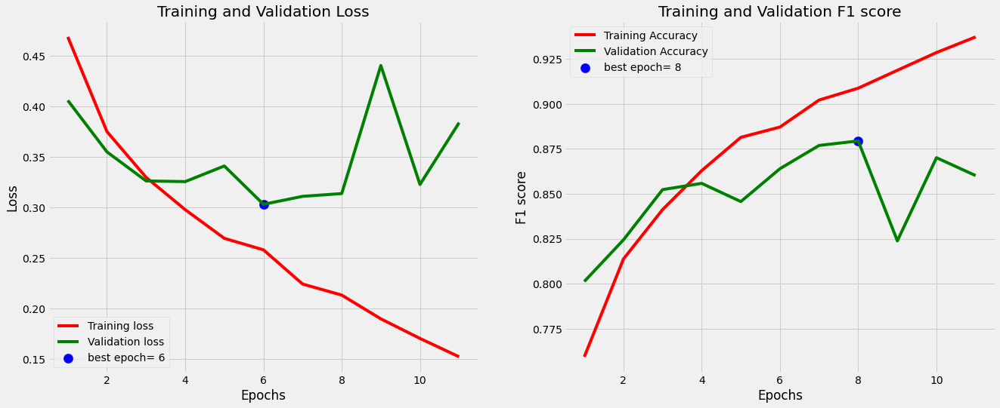

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.89      0.88       507
     EyeSpot       0.89      0.87      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 71s 465ms/step - loss: 0.4620 - binary_fbeta: 0.7520 - val_loss: 0.4257 - val_binary_fbeta: 0.7699

Epoch 00001: val_binary_fbeta improved from -inf to 0.76993, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 63s 441ms/step - loss: 0.3619 - binary_fbeta: 0.8256 - val_loss: 0.3921 - val_binary_fbeta: 0.8069

Epoch 00002: val_binary_fbeta improved from 0.76993 to 0.80686, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 65s 456ms/step - loss: 0.

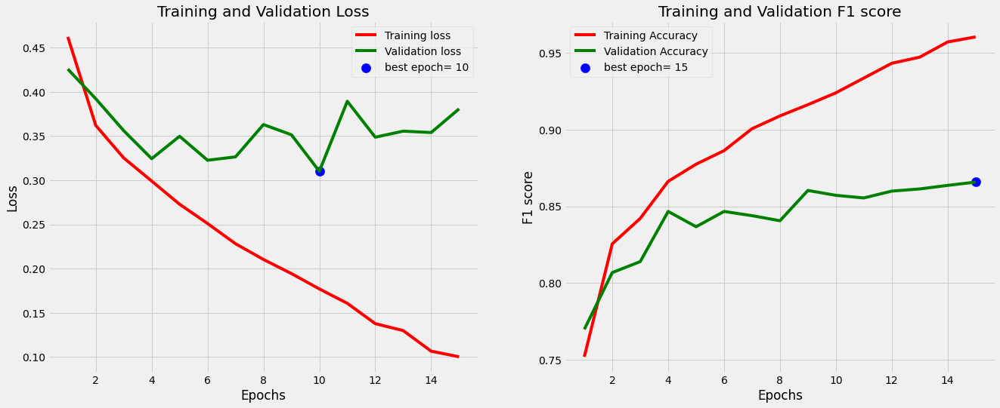

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.86      0.88      0.87       507
     EyeSpot       0.87      0.86      0.86       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
143/143 [==============================] - 37s 246ms/step - loss: 0.4627 - binary_fbeta: 0.7600 - val_loss: 0.3862 - val_binary_fbeta: 0.7982

Epoch 00001: val_binary_fbeta improved from -inf to 0.79825, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 24s 165ms/step - loss: 0.3598 - binary_fbeta: 0.8248 - val_loss: 0.3605 - val_binary_fbeta: 0.8291

Epoch 00002: val_binary_fbeta improved from 0.79825 to 0.82907, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 23s 163ms/step - loss: 0.

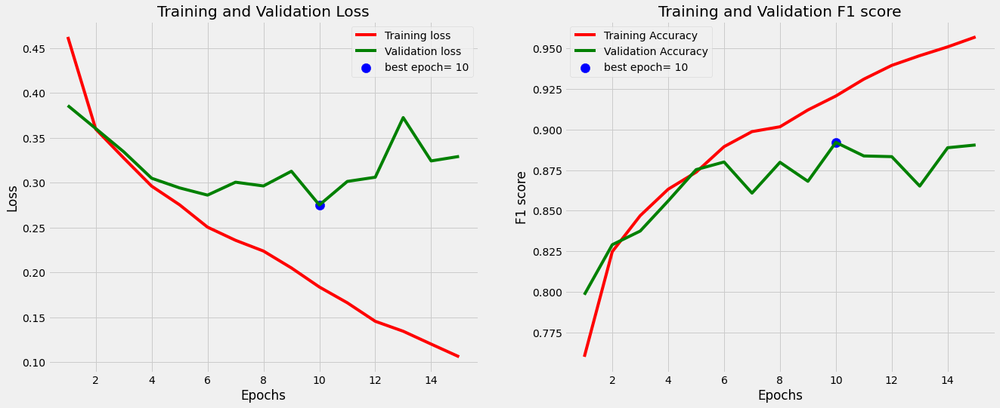

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.90      0.89       507
     EyeSpot       0.90      0.89      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 27s 183ms/step - loss: 0.4630 - binary_fbeta: 0.7576 - val_loss: 0.3882 - val_binary_fbeta: 0.8040

Epoch 00001: val_binary_fbeta improved from -inf to 0.80404, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 33s 233ms/step - loss: 0.3689 - binary_fbeta: 0.8226 - val_loss: 0.3310 - val_binary_fbeta: 0.8536

Epoch 00002: val_binary_fbeta improved from 0.80404 to 0.85359, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 37s 260ms/step - loss: 0.

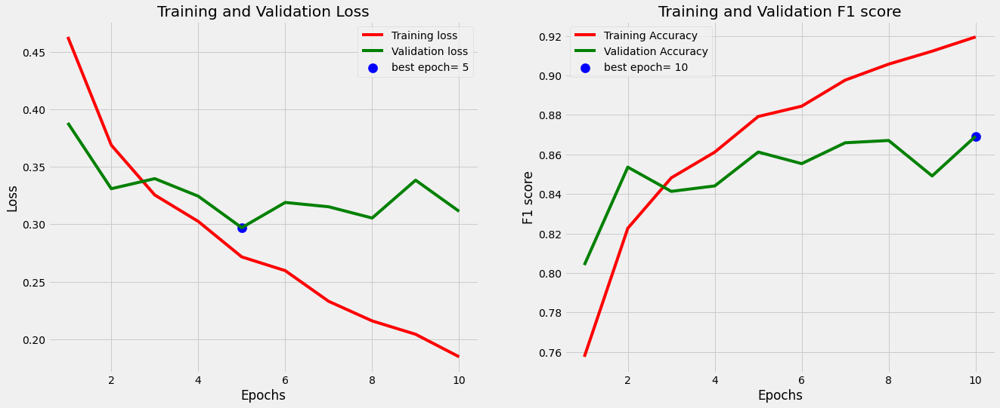

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.86      0.87       507
     EyeSpot       0.86      0.88      0.87       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
143/143 [==============================] - 44s 281ms/step - loss: 0.4772 - binary_fbeta: 0.7471 - val_loss: 0.3745 - val_binary_fbeta: 0.8194

Epoch 00001: val_binary_fbeta improved from -inf to 0.81937, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 49s 336ms/step - loss: 0.3676 - binary_fbeta: 0.8264 - val_loss: 0.3332 - val_binary_fbeta: 0.8580

Epoch 00002: val_binary_fbeta improved from 0.81937 to 0.85800, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 37s 257ms/step - loss: 0.

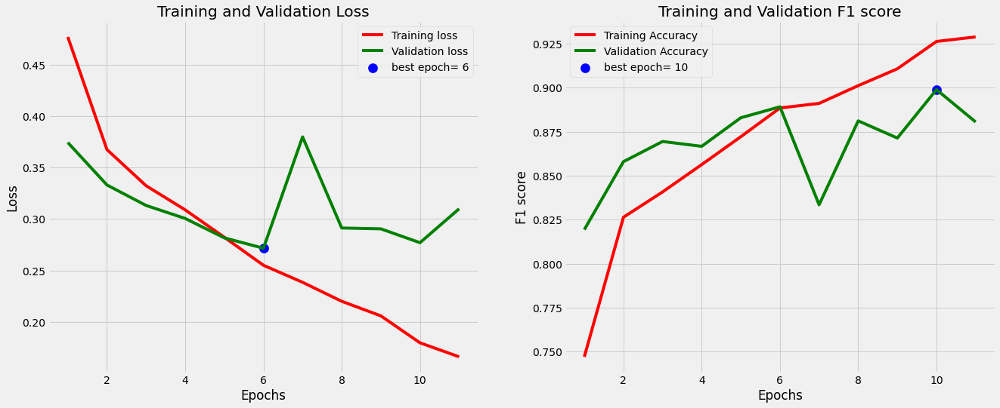

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.90      0.90      0.90       507
     EyeSpot       0.90      0.90      0.90       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.90      0.90      0.90      1014
weighted avg       0.90      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Model accuracy =  0.8799715638160706


In [24]:
#Define parameters
batch_size = 64
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30, 30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size = (2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

### Test best CNN model (model #2) with different batch sizes

In [47]:
#Define parameters (increasing the batchsize)
batch_size = 128
epochs = 20
patience = 5

Epoch 1/20
72/72 [==============================] - 39s 502ms/step - loss: 0.4800 - binary_fbeta: 0.7447 - val_loss: 0.4119 - val_binary_fbeta: 0.7927

Epoch 00001: val_binary_fbeta improved from -inf to 0.79269, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 39s 544ms/step - loss: 0.3709 - binary_fbeta: 0.8262 - val_loss: 0.3501 - val_binary_fbeta: 0.8342

Epoch 00002: val_binary_fbeta improved from 0.79269 to 0.83420, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 40s 553ms/step - loss: 0.3367 - binary_fbeta: 0.8408 - val_loss: 0.3364 - val_binary_fbeta: 0.8460

Epoch 00003: val_binary_fbeta improved from 0.83420 to 0.84600, saving model to best_model.h5
Epoch 4/20
72/72 [==============================] - 53s 737ms/step - loss: 0.3116 - binary_fbeta: 0.8532 - val_loss: 0.3293 - val_binary_fbeta: 0.8443

Epoch 00004: val_binary_fbeta did not improve from 0.84600
Epoch 5/20
72/72 [==============================] - 44

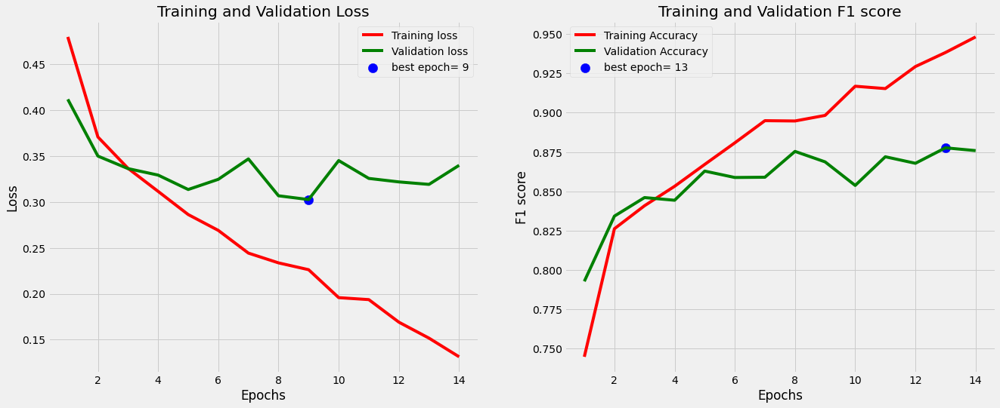

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.89      0.88       507
     EyeSpot       0.89      0.87      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
72/72 [==============================] - 29s 385ms/step - loss: 0.4997 - binary_fbeta: 0.7310 - val_loss: 0.4155 - val_binary_fbeta: 0.7977

Epoch 00001: val_binary_fbeta improved from -inf to 0.79765, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 27s 371ms/step - loss: 0.3906 - binary_fbeta: 0.8070 - val_loss: 0.3863 - val_binary_fbeta: 0.8024

Epoch 00002: val_binary_fbeta improved from 0.79765 to 0.80237, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 27s 381ms/step - loss: 0.3487 -

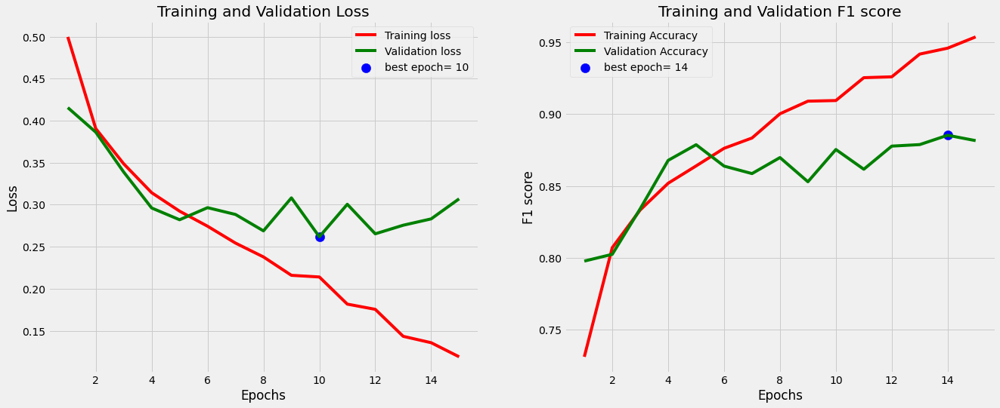

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.90      0.89       507
     EyeSpot       0.90      0.87      0.88       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
72/72 [==============================] - 31s 411ms/step - loss: 0.5037 - binary_fbeta: 0.7283 - val_loss: 0.4048 - val_binary_fbeta: 0.7872

Epoch 00001: val_binary_fbeta improved from -inf to 0.78724, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 28s 383ms/step - loss: 0.3854 - binary_fbeta: 0.8122 - val_loss: 0.3360 - val_binary_fbeta: 0.8524

Epoch 00002: val_binary_fbeta improved from 0.78724 to 0.85236, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 27s 373ms/step - loss: 0.3479 -

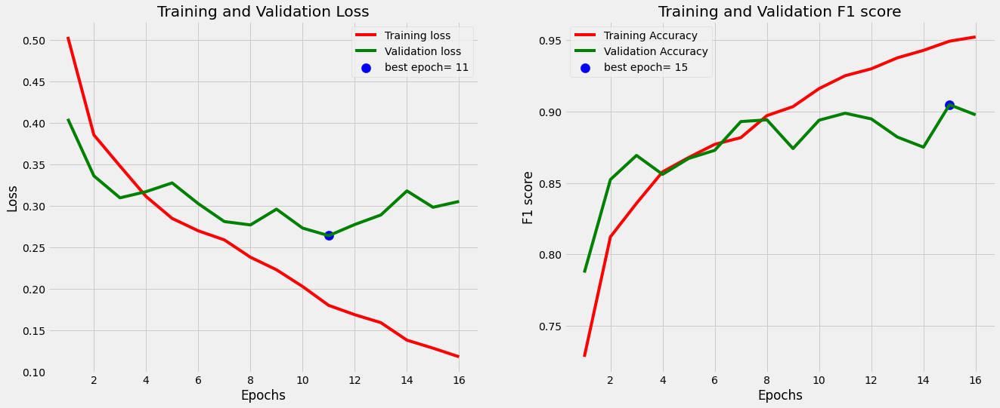

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.93      0.91       507
     EyeSpot       0.92      0.88      0.90       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.91      0.90      0.90      1014
weighted avg       0.91      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Epoch 1/20
72/72 [==============================] - 29s 382ms/step - loss: 0.4952 - binary_fbeta: 0.7288 - val_loss: 0.3988 - val_binary_fbeta: 0.8098

Epoch 00001: val_binary_fbeta improved from -inf to 0.80979, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 27s 373ms/step - loss: 0.3574 - binary_fbeta: 0.8297 - val_loss: 0.3624 - val_binary_fbeta: 0.8331

Epoch 00002: val_binary_fbeta improved from 0.80979 to 0.83314, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 28s 383ms/step - loss: 0.3348 -

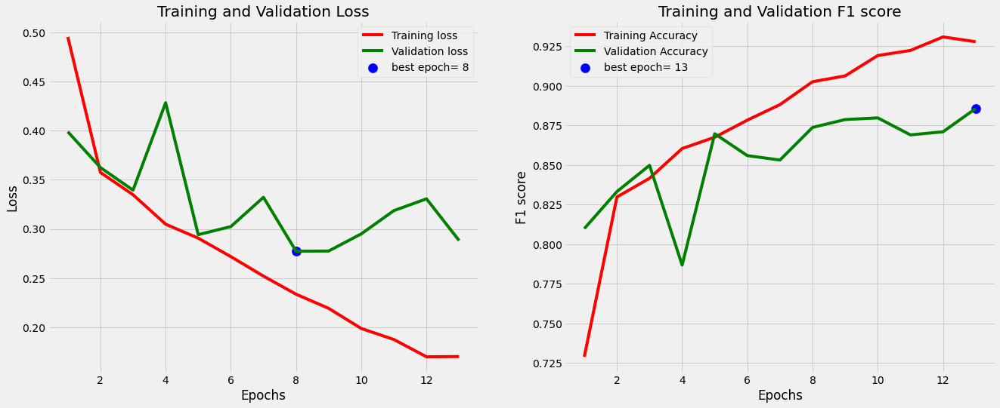

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.88      0.88       507
     EyeSpot       0.88      0.89      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
72/72 [==============================] - 40s 530ms/step - loss: 0.4803 - binary_fbeta: 0.7445 - val_loss: 0.3644 - val_binary_fbeta: 0.8237

Epoch 00001: val_binary_fbeta improved from -inf to 0.82371, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 38s 534ms/step - loss: 0.3848 - binary_fbeta: 0.8083 - val_loss: 0.3258 - val_binary_fbeta: 0.8433

Epoch 00002: val_binary_fbeta improved from 0.82371 to 0.84332, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 38s 529ms/step - loss: 0.3406 -

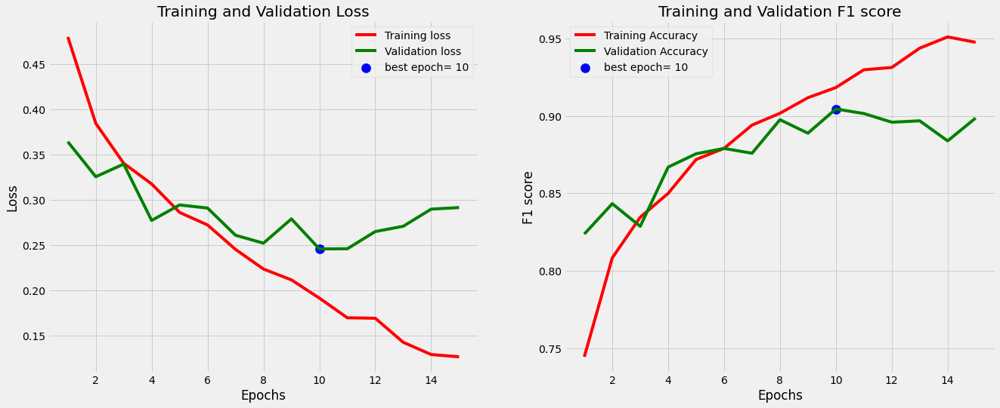

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.90      0.91      0.90       507
     EyeSpot       0.91      0.90      0.90       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.90      0.90      0.90      1014
weighted avg       0.90      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Model accuracy =  0.8844992518424988


In [49]:

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30, 30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

In [34]:
#Define parameters (decreasing the batchsize)
batch_size = 32
epochs = 20
patience = 5

Epoch 1/20
286/286 [==============================] - 22s 76ms/step - loss: 0.4318 - binary_fbeta: 0.7808 - val_loss: 0.3820 - val_binary_fbeta: 0.8273

Epoch 00001: val_binary_fbeta improved from -inf to 0.82733, saving model to best_model.h5
Epoch 2/20
286/286 [==============================] - 15s 54ms/step - loss: 0.3436 - binary_fbeta: 0.8370 - val_loss: 0.3645 - val_binary_fbeta: 0.8171437 - binary_fbeta: 0.83

Epoch 00002: val_binary_fbeta did not improve from 0.82733
Epoch 3/20
286/286 [==============================] - 31s 109ms/step - loss: 0.3044 - binary_fbeta: 0.8572 - val_loss: 0.3262 - val_binary_fbeta: 0.8566

Epoch 00003: val_binary_fbeta improved from 0.82733 to 0.85662, saving model to best_model.h5
Epoch 4/20
286/286 [==============================] - 17s 59ms/step - loss: 0.2659 - binary_fbeta: 0.8787 - val_loss: 0.3284 - val_binary_fbeta: 0.8585

Epoch 00004: val_binary_fbeta improved from 0.85662 to 0.85849, saving model to best_model.h5
Epoch 5/20
286/286 [=====

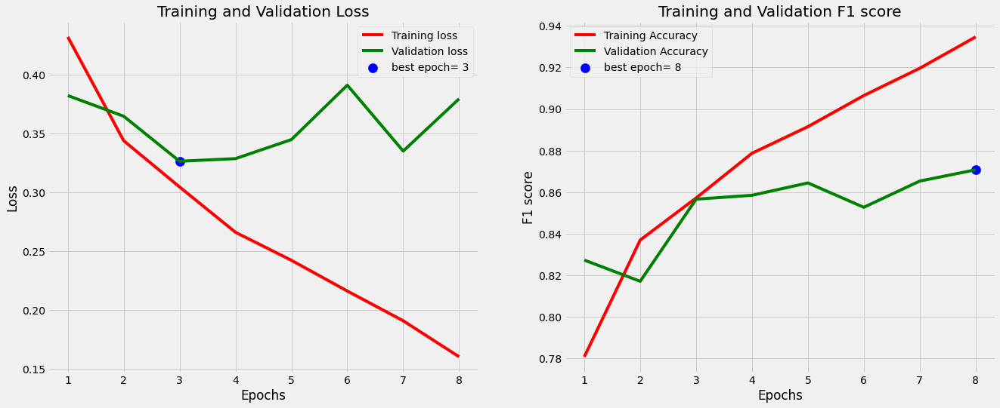

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.84      0.91      0.88       507
     EyeSpot       0.90      0.83      0.87       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
286/286 [==============================] - 26s 86ms/step - loss: 0.4269 - binary_fbeta: 0.7793 - val_loss: 0.3816 - val_binary_fbeta: 0.8175

Epoch 00001: val_binary_fbeta improved from -inf to 0.81747, saving model to best_model.h5
Epoch 2/20
286/286 [==============================] - 24s 83ms/step - loss: 0.3520 - binary_fbeta: 0.8293 - val_loss: 0.3253 - val_binary_fbeta: 0.8429

Epoch 00002: val_binary_fbeta improved from 0.81747 to 0.84286, saving model to best_model.h5
Epoch 3/20
286/286 [==============================] - 18s 62ms/step - loss: 0.302

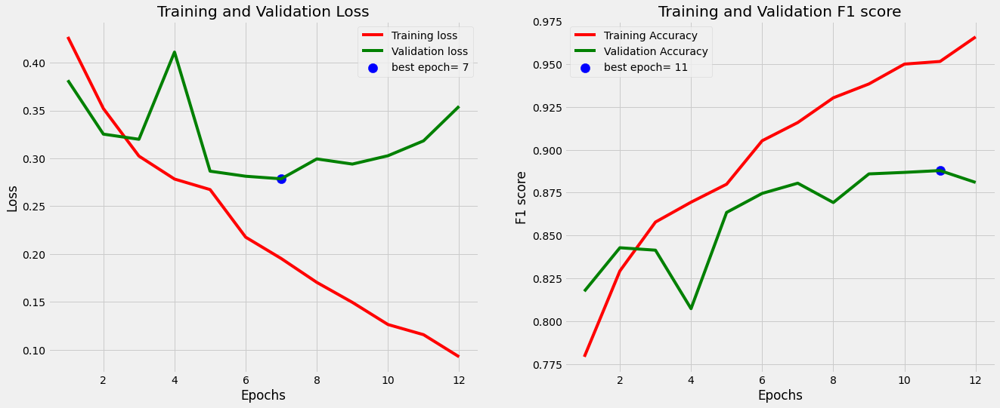

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.90      0.89       507
     EyeSpot       0.89      0.88      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
286/286 [==============================] - 29s 95ms/step - loss: 0.4270 - binary_fbeta: 0.7809 - val_loss: 0.3645 - val_binary_fbeta: 0.8181

Epoch 00001: val_binary_fbeta improved from -inf to 0.81809, saving model to best_model.h5
Epoch 2/20
286/286 [==============================] - 23s 79ms/step - loss: 0.3427 - binary_fbeta: 0.8350 - val_loss: 0.3524 - val_binary_fbeta: 0.8216

Epoch 00002: val_binary_fbeta improved from 0.81809 to 0.82164, saving model to best_model.h5
Epoch 3/20
286/286 [==============================] - 20s 71ms/step - loss: 0.297

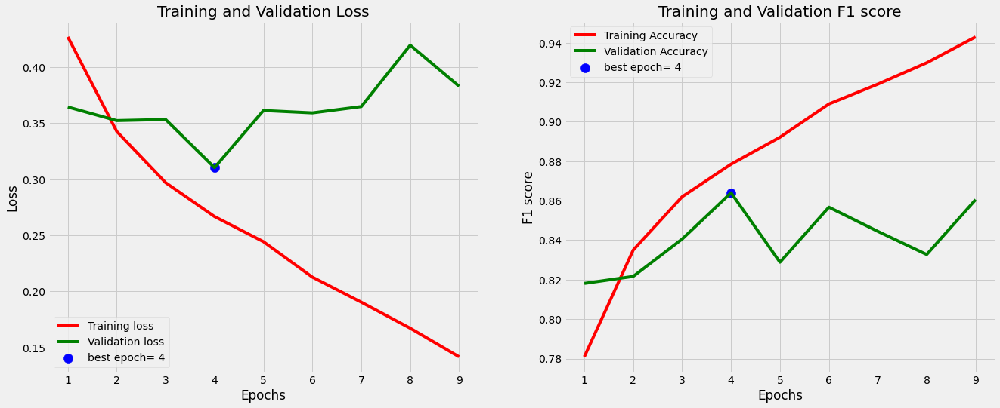

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.84      0.86       507
     EyeSpot       0.85      0.89      0.87       507

   micro avg       0.86      0.86      0.86      1014
   macro avg       0.87      0.86      0.86      1014
weighted avg       0.87      0.86      0.86      1014
 samples avg       0.86      0.86      0.86      1014

Epoch 1/20
286/286 [==============================] - 26s 81ms/step - loss: 0.4421 - binary_fbeta: 0.7692 - val_loss: 0.3821 - val_binary_fbeta: 0.7956

Epoch 00001: val_binary_fbeta improved from -inf to 0.79563, saving model to best_model.h5
Epoch 2/20
286/286 [==============================] - 27s 95ms/step - loss: 0.3380 - binary_fbeta: 0.8397 - val_loss: 0.3630 - val_binary_fbeta: 0.8240

Epoch 00002: val_binary_fbeta improved from 0.79563 to 0.82395, saving model to best_model.h5
Epoch 3/20
286/286 [==============================] - 21s 73ms/step - loss: 0.301

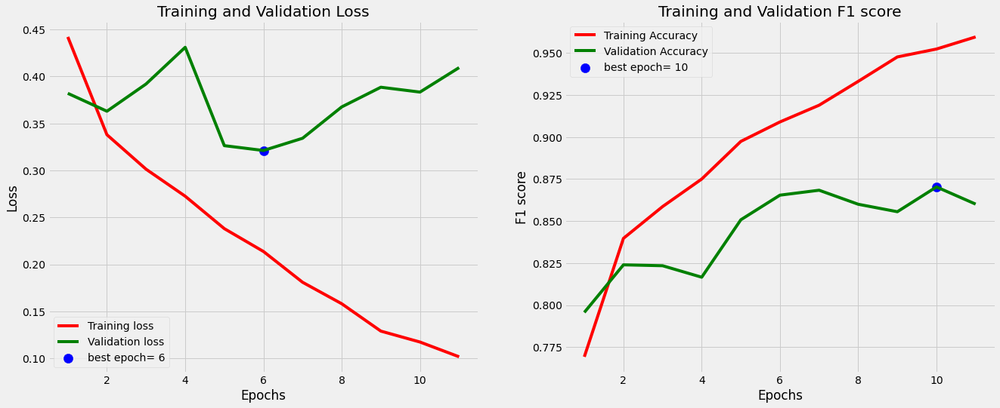

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.86      0.88      0.87       507
     EyeSpot       0.88      0.86      0.87       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
286/286 [==============================] - 25s 85ms/step - loss: 0.4319 - binary_fbeta: 0.7795 - val_loss: 0.3716 - val_binary_fbeta: 0.8234

Epoch 00001: val_binary_fbeta improved from -inf to 0.82342, saving model to best_model.h5
Epoch 2/20
286/286 [==============================] - 15s 51ms/step - loss: 0.3379 - binary_fbeta: 0.8378 - val_loss: 0.3094 - val_binary_fbeta: 0.85427 - binary_fbeta: 0.83

Epoch 00002: val_binary_fbeta improved from 0.82342 to 0.85423, saving model to best_model.h5
Epoch 3/20
286/286 [==============================] - 23s 8

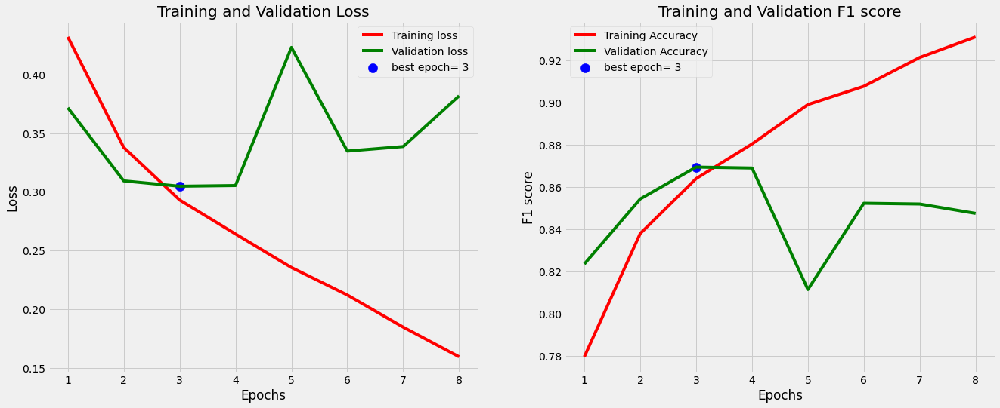

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.90      0.87       507
     EyeSpot       0.89      0.84      0.87       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Model accuracy =  0.8702947497367859


In [35]:
f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(filters = 32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30, 30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(filters = 64, kernel_size=(3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

### Testing Average Pooling

Epoch 1/20
143/143 [==============================] - 19s 124ms/step - loss: 0.5225 - binary_fbeta: 0.7255 - val_loss: 0.4398 - val_binary_fbeta: 0.7793

Epoch 00001: val_binary_fbeta improved from -inf to 0.77926, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 20s 141ms/step - loss: 0.4119 - binary_fbeta: 0.8015 - val_loss: 0.3913 - val_binary_fbeta: 0.7996

Epoch 00002: val_binary_fbeta improved from 0.77926 to 0.79959, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 10s 70ms/step - loss: 0.3708 - binary_fbeta: 0.8274 - val_loss: 0.3496 - val_binary_fbeta: 0.8236

Epoch 00003: val_binary_fbeta improved from 0.79959 to 0.82364, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 20s 140ms/step - loss: 0.3278 - binary_fbeta: 0.8490 - val_loss: 0.3191 - val_binary_fbeta: 0.8579

Epoch 00004: val_binary_fbeta improved from 0.82364 to 0.85793, saving model to best_model.h5
Epoch 5/20
1

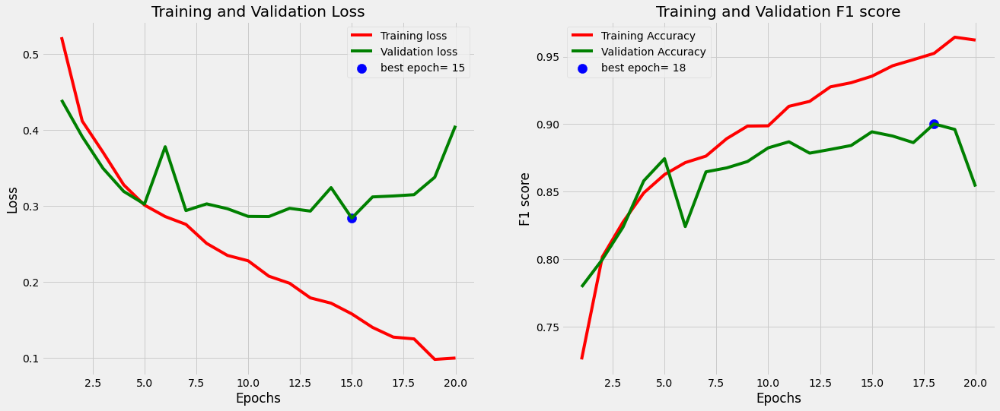

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.91      0.90       507
     EyeSpot       0.91      0.89      0.90       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.90      0.90      0.90      1014
weighted avg       0.90      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Epoch 1/20
143/143 [==============================] - 10s 67ms/step - loss: 0.4896 - binary_fbeta: 0.7522 - val_loss: 0.4302 - val_binary_fbeta: 0.7832

Epoch 00001: val_binary_fbeta improved from -inf to 0.78317, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 34s 238ms/step - loss: 0.3885 - binary_fbeta: 0.8128 - val_loss: 0.3697 - val_binary_fbeta: 0.8296

Epoch 00002: val_binary_fbeta improved from 0.78317 to 0.82961, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 33s 228ms/step - loss: 0.3

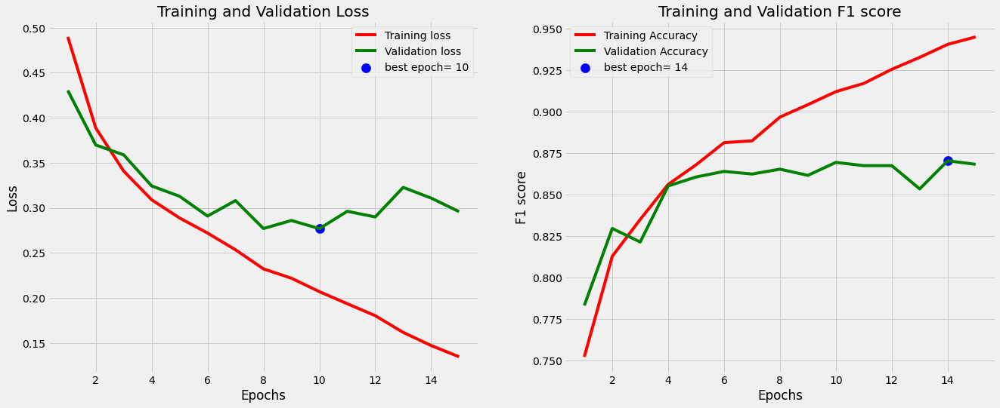

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.87      0.87       507
     EyeSpot       0.87      0.87      0.87       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
143/143 [==============================] - 21s 123ms/step - loss: 0.4962 - binary_fbeta: 0.7452 - val_loss: 0.4449 - val_binary_fbeta: 0.7661

Epoch 00001: val_binary_fbeta improved from -inf to 0.76613, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 11s 80ms/step - loss: 0.3959 - binary_fbeta: 0.8044 - val_loss: 0.3597 - val_binary_fbeta: 0.8146

Epoch 00002: val_binary_fbeta improved from 0.76613 to 0.81460, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 20s 140ms/step - loss: 0.3

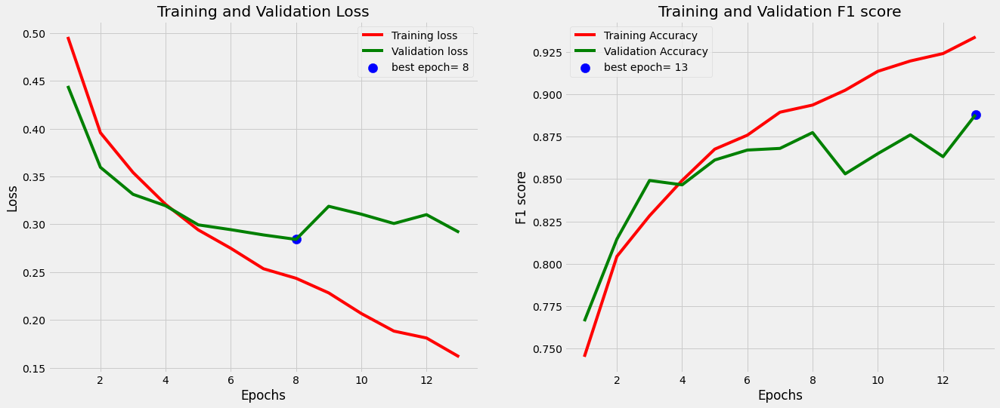

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.89      0.89       507
     EyeSpot       0.89      0.89      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 18s 117ms/step - loss: 0.4752 - binary_fbeta: 0.7557 - val_loss: 0.3796 - val_binary_fbeta: 0.8203

Epoch 00001: val_binary_fbeta improved from -inf to 0.82028, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 17s 118ms/step - loss: 0.3957 - binary_fbeta: 0.8057 - val_loss: 0.3527 - val_binary_fbeta: 0.8349

Epoch 00002: val_binary_fbeta improved from 0.82028 to 0.83492, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 17s 118ms/step - loss: 0.

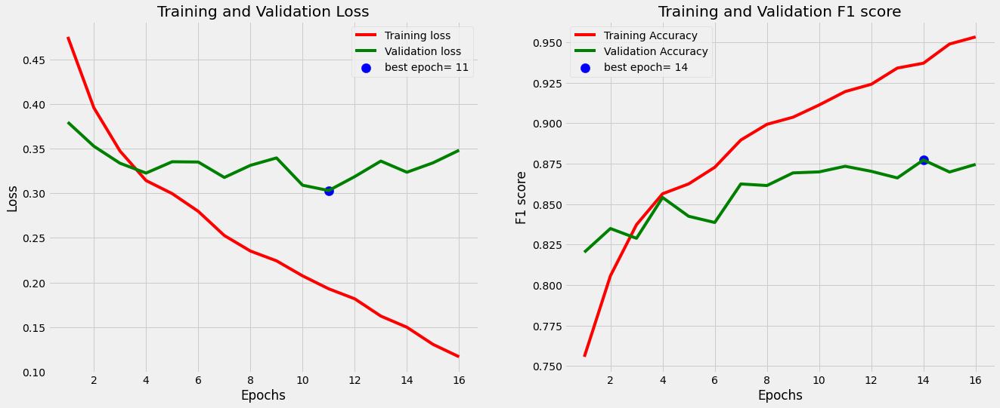

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.89      0.88       507
     EyeSpot       0.89      0.87      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 22s 148ms/step - loss: 0.5263 - binary_fbeta: 0.7165 - val_loss: 0.4389 - val_binary_fbeta: 0.7816

Epoch 00001: val_binary_fbeta improved from -inf to 0.78158, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 11s 79ms/step - loss: 0.4120 - binary_fbeta: 0.7972 - val_loss: 0.3705 - val_binary_fbeta: 0.8269

Epoch 00002: val_binary_fbeta improved from 0.78158 to 0.82686, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 17s 122ms/step - loss: 0.3

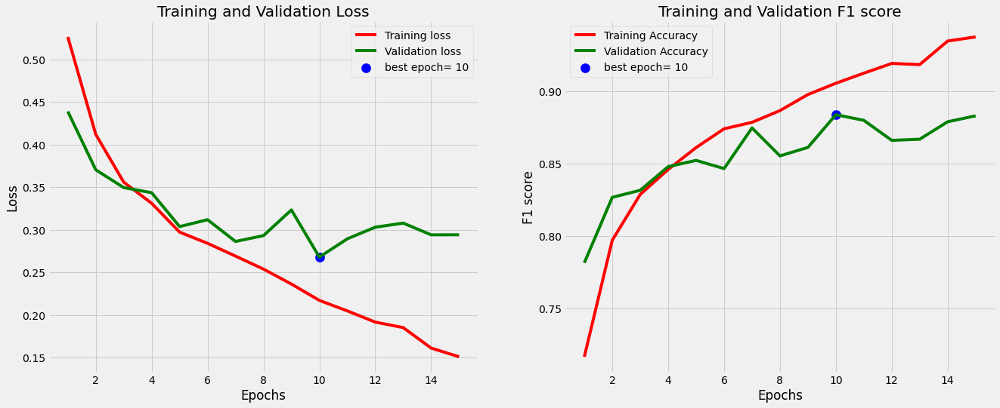

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.86      0.91      0.89       507
     EyeSpot       0.90      0.86      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Model Performance (f1 score) =  0.8838777542114258


In [58]:
batch_size = 64
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30,30,3),padding='same')) #Convolution layer
    
    cnn.add(AveragePooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))          

    cnn.add(AveragePooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer                  
    cnn.add(Dense(2, activation='softmax')) #Output layer

    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

### Testing Dropout

Epoch 1/20
143/143 [==============================] - 25s 167ms/step - loss: 0.4539 - binary_fbeta: 0.7648 - val_loss: 0.3807 - val_binary_fbeta: 0.8047

Epoch 00001: val_binary_fbeta improved from -inf to 0.80465, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 31s 220ms/step - loss: 0.3637 - binary_fbeta: 0.8282 - val_loss: 0.3484 - val_binary_fbeta: 0.8230

Epoch 00002: val_binary_fbeta improved from 0.80465 to 0.82295, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 27s 187ms/step - loss: 0.3275 - binary_fbeta: 0.8439 - val_loss: 0.3029 - val_binary_fbeta: 0.8513

Epoch 00003: val_binary_fbeta improved from 0.82295 to 0.85127, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 29s 201ms/step - loss: 0.3028 - binary_fbeta: 0.8591 - val_loss: 0.2889 - val_binary_fbeta: 0.8708

Epoch 00004: val_binary_fbeta improved from 0.85127 to 0.87080, saving model to best_model.h5
Epoch 5/20


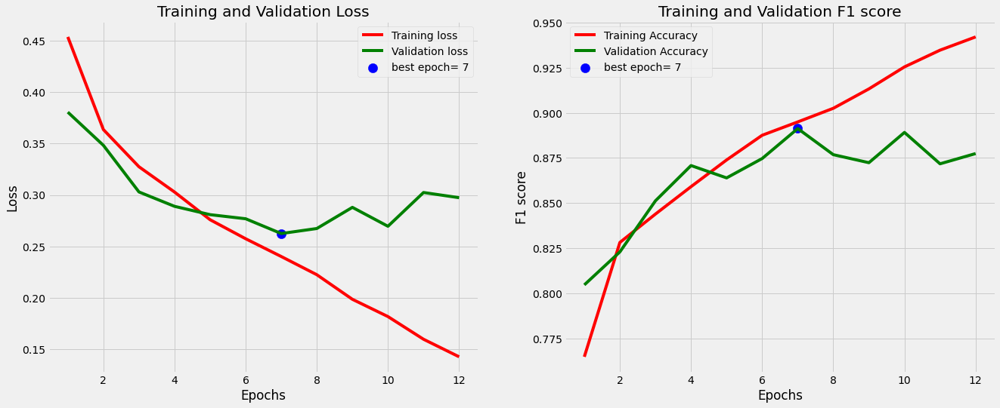

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.92      0.89       507
     EyeSpot       0.91      0.87      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 45s 295ms/step - loss: 0.4628 - binary_fbeta: 0.7578 - val_loss: 0.3888 - val_binary_fbeta: 0.8062

Epoch 00001: val_binary_fbeta improved from -inf to 0.80624, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 38s 264ms/step - loss: 0.3712 - binary_fbeta: 0.8204 - val_loss: 0.3327 - val_binary_fbeta: 0.8329

Epoch 00002: val_binary_fbeta improved from 0.80624 to 0.83290, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 37s 258ms/step - loss: 0.

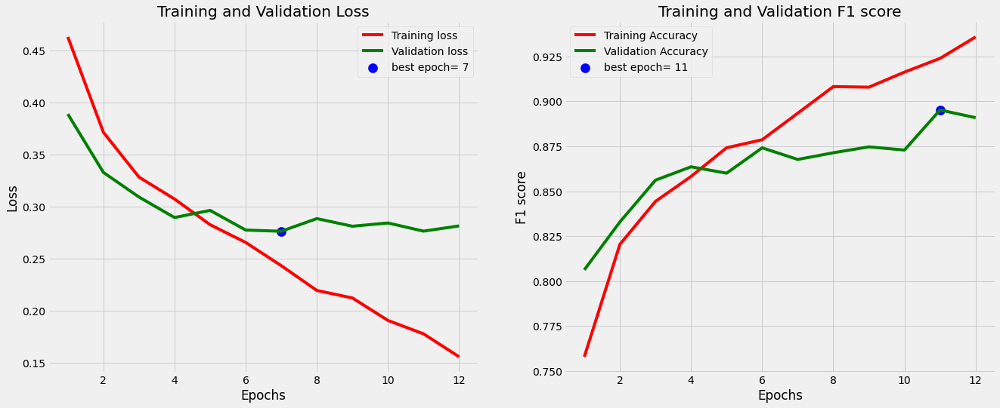

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.93      0.90       507
     EyeSpot       0.92      0.86      0.89       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.90      0.90      0.90      1014
weighted avg       0.90      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Epoch 1/20
143/143 [==============================] - 29s 197ms/step - loss: 0.4533 - binary_fbeta: 0.7636 - val_loss: 0.3938 - val_binary_fbeta: 0.8088

Epoch 00001: val_binary_fbeta improved from -inf to 0.80881, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 26s 180ms/step - loss: 0.3719 - binary_fbeta: 0.8197 - val_loss: 0.3512 - val_binary_fbeta: 0.8273

Epoch 00002: val_binary_fbeta improved from 0.80881 to 0.82729, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 30s 209ms/step - loss: 0.

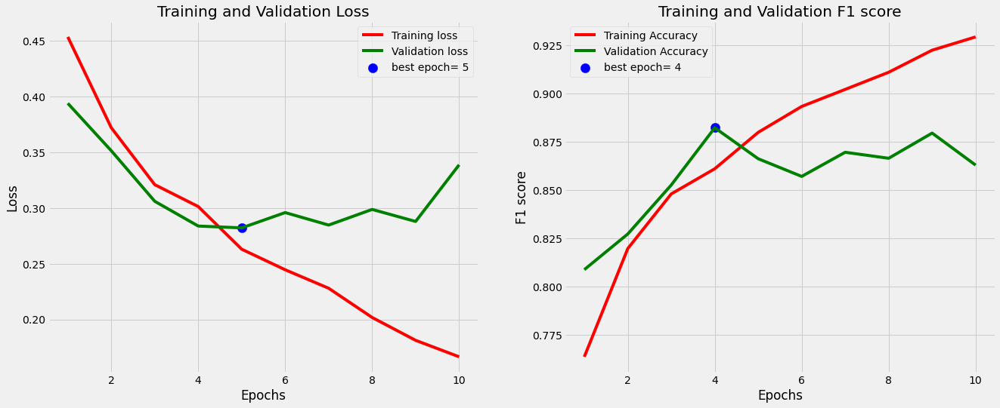

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.89      0.88       507
     EyeSpot       0.89      0.88      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 25s 163ms/step - loss: 0.4773 - binary_fbeta: 0.7438 - val_loss: 0.3829 - val_binary_fbeta: 0.8246

Epoch 00001: val_binary_fbeta improved from -inf to 0.82462, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 33s 231ms/step - loss: 0.3711 - binary_fbeta: 0.8197 - val_loss: 0.3326 - val_binary_fbeta: 0.8437

Epoch 00002: val_binary_fbeta improved from 0.82462 to 0.84371, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 26s 179ms/step - loss: 0.

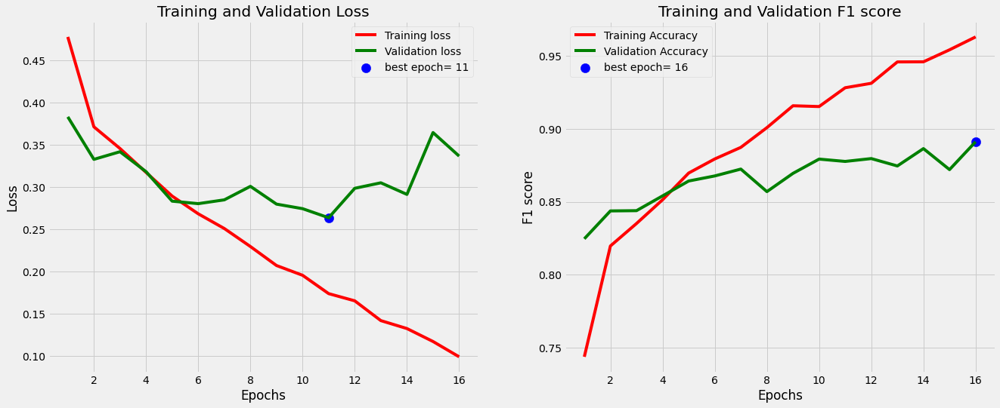

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.90      0.89       507
     EyeSpot       0.90      0.89      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 30s 201ms/step - loss: 0.4569 - binary_fbeta: 0.7629 - val_loss: 0.3935 - val_binary_fbeta: 0.8023

Epoch 00001: val_binary_fbeta improved from -inf to 0.80234, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 24s 169ms/step - loss: 0.3649 - binary_fbeta: 0.8177 - val_loss: 0.3660 - val_binary_fbeta: 0.8380

Epoch 00002: val_binary_fbeta improved from 0.80234 to 0.83804, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 27s 191ms/step - loss: 0.

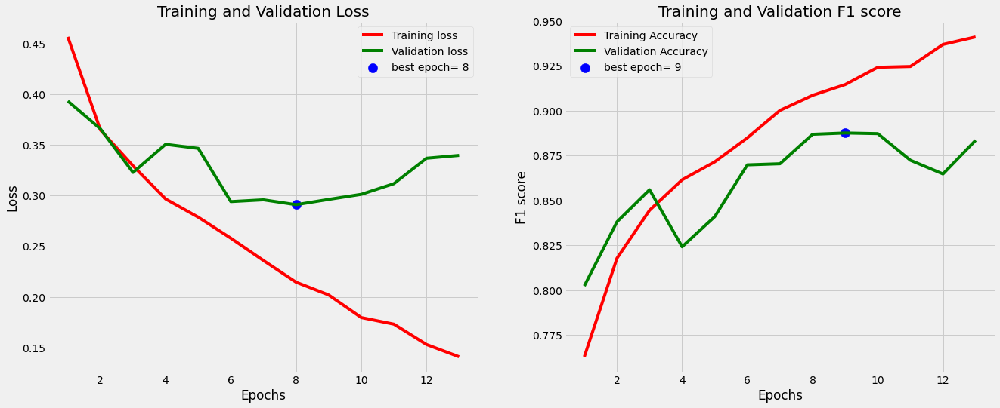

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.91      0.89       507
     EyeSpot       0.90      0.87      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Model Performance (f1 score) =  0.8912463784217834


In [71]:
batch_size = 64
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30,30,3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dropout(0.3))
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/20
72/72 [==============================] - 31s 404ms/step - loss: 0.4940 - binary_fbeta: 0.7371 - val_loss: 0.4241 - val_binary_fbeta: 0.7891

Epoch 00001: val_binary_fbeta improved from -inf to 0.78911, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 20s 279ms/step - loss: 0.3937 - binary_fbeta: 0.8017 - val_loss: 0.3687 - val_binary_fbeta: 0.8252

Epoch 00002: val_binary_fbeta improved from 0.78911 to 0.82516, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 23s 323ms/step - loss: 0.3566 - binary_fbeta: 0.8303 - val_loss: 0.3217 - val_binary_fbeta: 0.8500

Epoch 00003: val_binary_fbeta improved from 0.82516 to 0.84999, saving model to best_model.h5
Epoch 4/20
72/72 [==============================] - 24s 330ms/step - loss: 0.3242 - binary_fbeta: 0.8482 - val_loss: 0.3433 - val_binary_fbeta: 0.8383

Epoch 00004: val_binary_fbeta did not improve from 0.84999
Epoch 5/20
72/72 [==============================] - 41

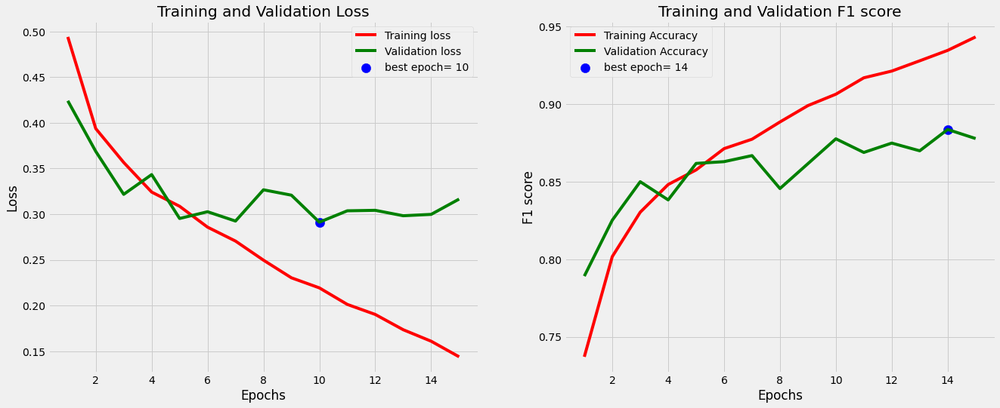

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.90      0.89       507
     EyeSpot       0.90      0.87      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
72/72 [==============================] - 27s 313ms/step - loss: 0.5027 - binary_fbeta: 0.7311 - val_loss: 0.4555 - val_binary_fbeta: 0.7397

Epoch 00001: val_binary_fbeta improved from -inf to 0.73970, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 23s 322ms/step - loss: 0.3862 - binary_fbeta: 0.8125 - val_loss: 0.3668 - val_binary_fbeta: 0.8122

Epoch 00002: val_binary_fbeta improved from 0.73970 to 0.81215, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 14s 194ms/step - loss: 0.3498 -

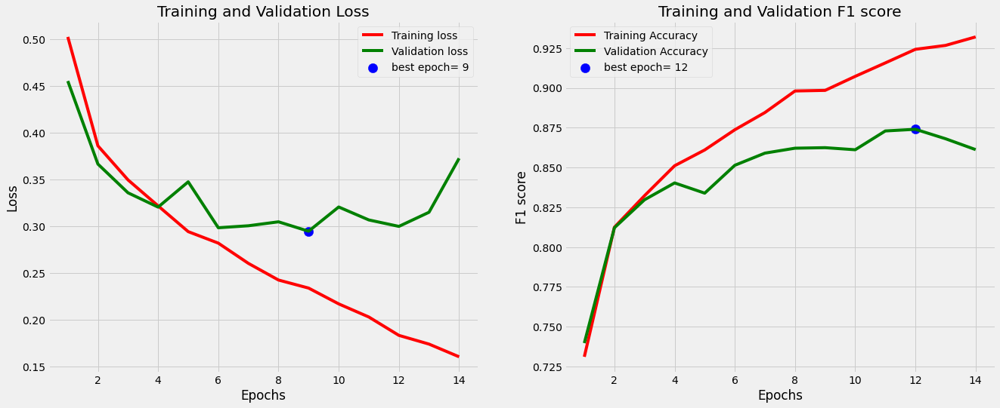

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.88      0.88       507
     EyeSpot       0.88      0.86      0.87       507

   micro avg       0.87      0.87      0.87      1014
   macro avg       0.87      0.87      0.87      1014
weighted avg       0.87      0.87      0.87      1014
 samples avg       0.87      0.87      0.87      1014

Epoch 1/20
72/72 [==============================] - 29s 351ms/step - loss: 0.5155 - binary_fbeta: 0.7125 - val_loss: 0.4392 - val_binary_fbeta: 0.7845

Epoch 00001: val_binary_fbeta improved from -inf to 0.78448, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 29s 399ms/step - loss: 0.3955 - binary_fbeta: 0.8055 - val_loss: 0.3908 - val_binary_fbeta: 0.8139

Epoch 00002: val_binary_fbeta improved from 0.78448 to 0.81386, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 22s 302ms/step - loss: 0.3480 -

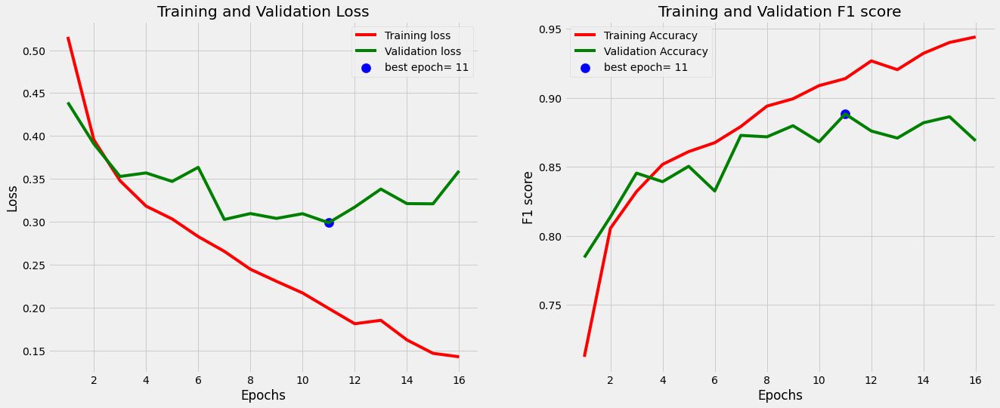

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.92      0.89       507
     EyeSpot       0.91      0.86      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
72/72 [==============================] - 15s 203ms/step - loss: 0.4707 - binary_fbeta: 0.7539 - val_loss: 0.4147 - val_binary_fbeta: 0.7884

Epoch 00001: val_binary_fbeta improved from -inf to 0.78838, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 13s 173ms/step - loss: 0.3734 - binary_fbeta: 0.8186 - val_loss: 0.4224 - val_binary_fbeta: 0.7935

Epoch 00002: val_binary_fbeta improved from 0.78838 to 0.79351, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 18s 245ms/step - loss: 0.3536 -

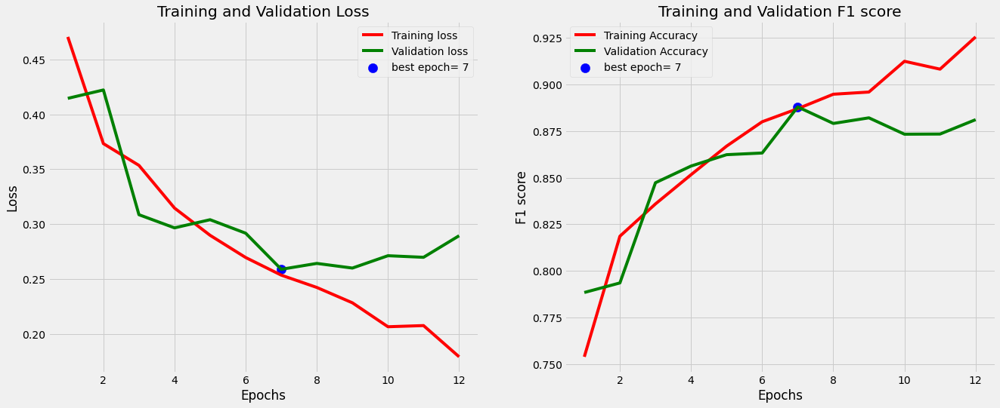

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.89      0.89       507
     EyeSpot       0.89      0.89      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
72/72 [==============================] - 20s 271ms/step - loss: 0.4740 - binary_fbeta: 0.7508 - val_loss: 0.4010 - val_binary_fbeta: 0.8095

Epoch 00001: val_binary_fbeta improved from -inf to 0.80954, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 18s 257ms/step - loss: 0.3789 - binary_fbeta: 0.8187 - val_loss: 0.3538 - val_binary_fbeta: 0.8363

Epoch 00002: val_binary_fbeta improved from 0.80954 to 0.83632, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 17s 242ms/step - loss: 0.3448 -

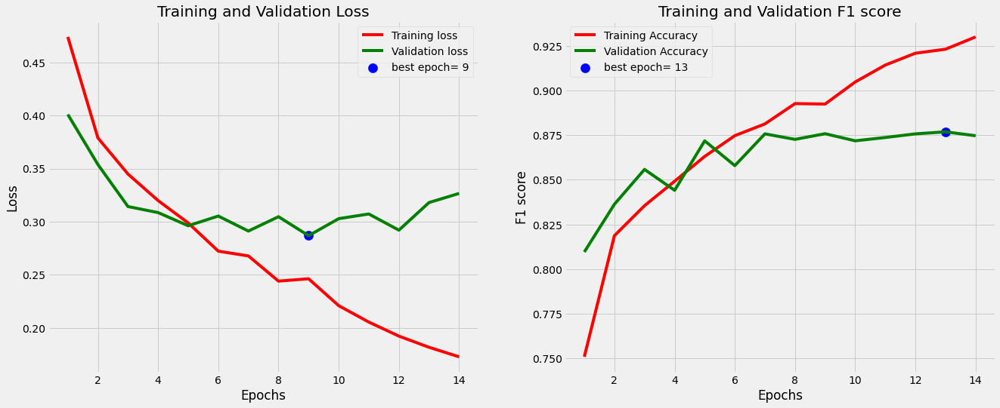

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.92      0.88       507
     EyeSpot       0.91      0.83      0.87       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Model Performance (f1 score) =  0.8847655653953552


In [72]:
batch_size = 128
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30,30,3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dropout(0.3))
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/20
143/143 [==============================] - 15s 99ms/step - loss: 0.4753 - binary_fbeta: 0.7509 - val_loss: 0.4323 - val_binary_fbeta: 0.7974

Epoch 00001: val_binary_fbeta improved from -inf to 0.79738, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 18s 124ms/step - loss: 0.3916 - binary_fbeta: 0.8084 - val_loss: 0.4346 - val_binary_fbeta: 0.7608

Epoch 00002: val_binary_fbeta did not improve from 0.79738
Epoch 3/20
143/143 [==============================] - 12s 85ms/step - loss: 0.3628 - binary_fbeta: 0.8223 - val_loss: 0.3716 - val_binary_fbeta: 0.8193

Epoch 00003: val_binary_fbeta improved from 0.79738 to 0.81930, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 17s 120ms/step - loss: 0.3305 - binary_fbeta: 0.8434 - val_loss: 0.3392 - val_binary_fbeta: 0.8371

Epoch 00004: val_binary_fbeta improved from 0.81930 to 0.83706, saving model to best_model.h5
Epoch 5/20
143/143 [============================

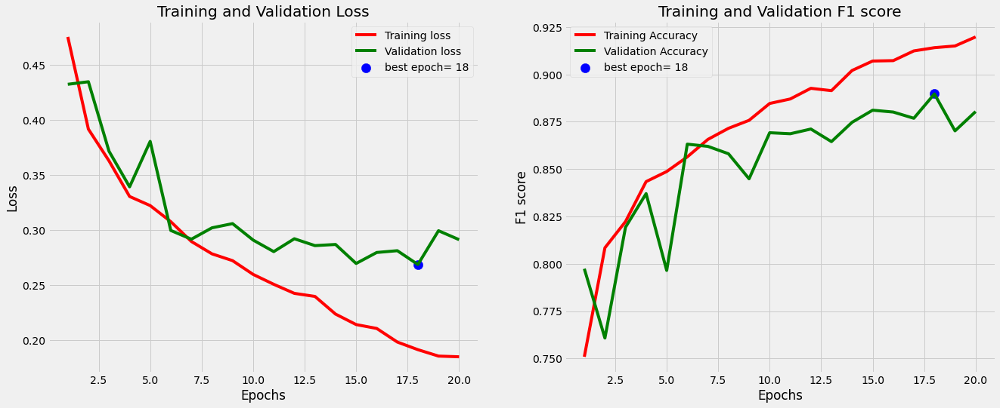

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.91      0.89       507
     EyeSpot       0.90      0.87      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 30s 199ms/step - loss: 0.4857 - binary_fbeta: 0.7427 - val_loss: 0.4213 - val_binary_fbeta: 0.7804

Epoch 00001: val_binary_fbeta improved from -inf to 0.78042, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 26s 181ms/step - loss: 0.4017 - binary_fbeta: 0.8004 - val_loss: 0.3579 - val_binary_fbeta: 0.8267

Epoch 00002: val_binary_fbeta improved from 0.78042 to 0.82668, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 29s 202ms/step - loss: 0.

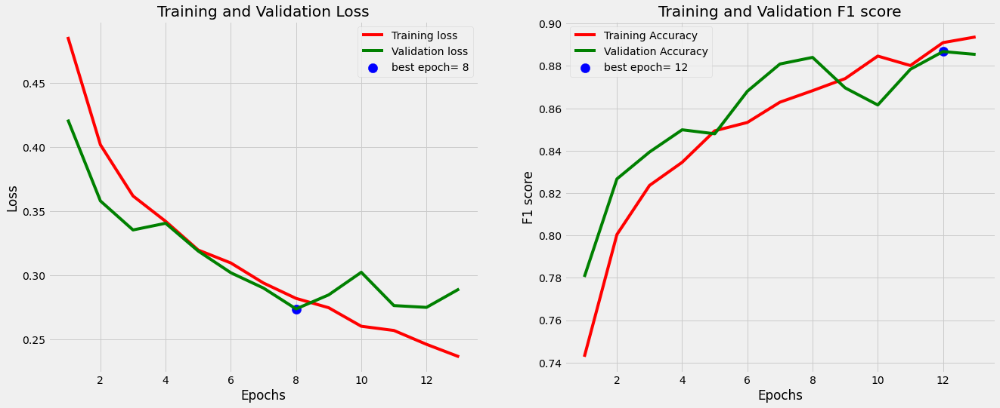

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.85      0.94      0.89       507
     EyeSpot       0.93      0.84      0.88       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
143/143 [==============================] - 43s 265ms/step - loss: 0.4833 - binary_fbeta: 0.7452 - val_loss: 0.3878 - val_binary_fbeta: 0.8146

Epoch 00001: val_binary_fbeta improved from -inf to 0.81460, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 37s 253ms/step - loss: 0.3941 - binary_fbeta: 0.8042 - val_loss: 0.3535 - val_binary_fbeta: 0.8341

Epoch 00002: val_binary_fbeta improved from 0.81460 to 0.83413, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 34s 236ms/step - loss: 0.

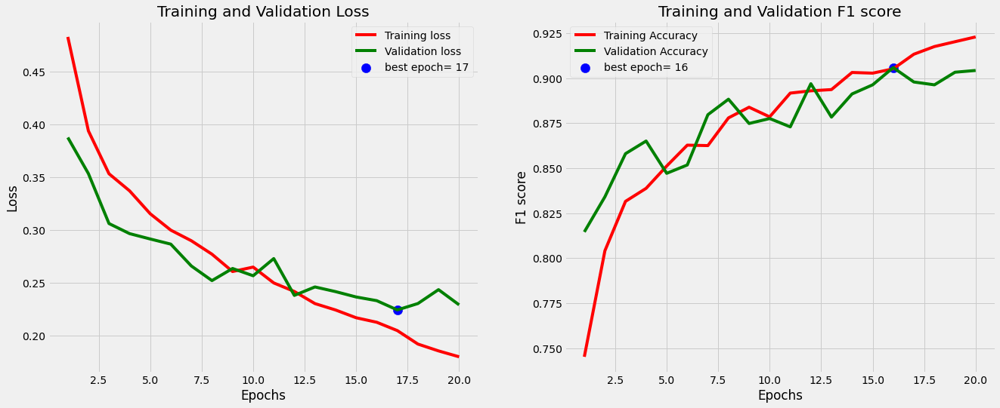

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.87      0.95      0.91       507
     EyeSpot       0.95      0.86      0.90       507

   micro avg       0.91      0.91      0.91      1014
   macro avg       0.91      0.91      0.91      1014
weighted avg       0.91      0.91      0.91      1014
 samples avg       0.91      0.91      0.91      1014

Epoch 1/20
143/143 [==============================] - 31s 205ms/step - loss: 0.4873 - binary_fbeta: 0.7398 - val_loss: 0.4166 - val_binary_fbeta: 0.7923

Epoch 00001: val_binary_fbeta improved from -inf to 0.79232, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 29s 200ms/step - loss: 0.3823 - binary_fbeta: 0.8148 - val_loss: 0.3921 - val_binary_fbeta: 0.7980

Epoch 00002: val_binary_fbeta improved from 0.79232 to 0.79800, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 27s 189ms/step - loss: 0.

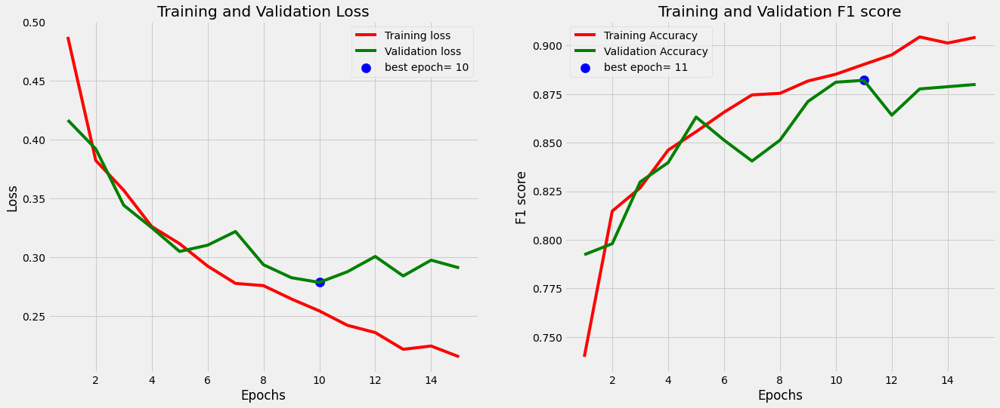

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.88      0.88       507
     EyeSpot       0.88      0.88      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
143/143 [==============================] - 29s 186ms/step - loss: 0.4920 - binary_fbeta: 0.7361 - val_loss: 0.4288 - val_binary_fbeta: 0.7898

Epoch 00001: val_binary_fbeta improved from -inf to 0.78982, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 23s 160ms/step - loss: 0.4004 - binary_fbeta: 0.8024 - val_loss: 0.3853 - val_binary_fbeta: 0.8013

Epoch 00002: val_binary_fbeta improved from 0.78982 to 0.80129, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 22s 156ms/step - loss: 0.

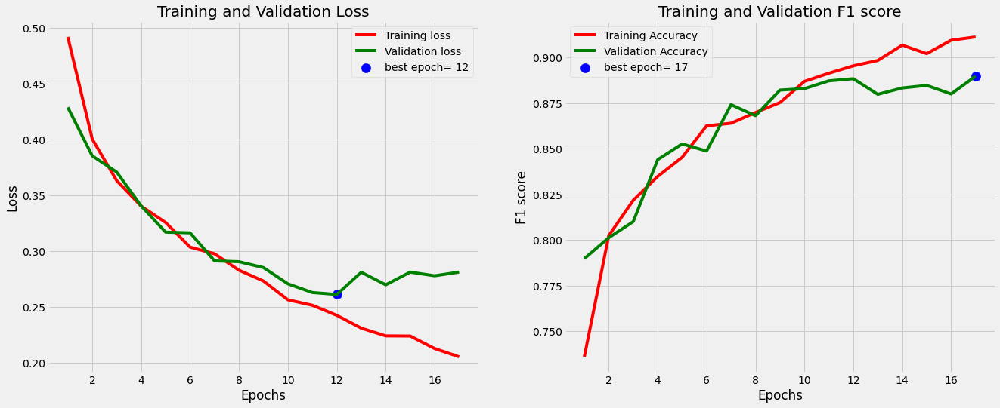

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.89      0.89       507
     EyeSpot       0.89      0.89      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Model Performance (f1 score) =  0.8897371292114258


In [61]:
batch_size = 64
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30,30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Dropout(0.3))
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Dropout(0.3))
    
    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dropout(0.3))
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

Epoch 1/20
72/72 [==============================] - 16s 203ms/step - loss: 0.5856 - binary_fbeta: 0.6811 - val_loss: 0.4441 - val_binary_fbeta: 0.7717

Epoch 00001: val_binary_fbeta improved from -inf to 0.77168, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 23s 327ms/step - loss: 0.4425 - binary_fbeta: 0.7730 - val_loss: 0.4170 - val_binary_fbeta: 0.7865

Epoch 00002: val_binary_fbeta improved from 0.77168 to 0.78650, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 19s 266ms/step - loss: 0.3958 - binary_fbeta: 0.8042 - val_loss: 0.3876 - val_binary_fbeta: 0.7991

Epoch 00003: val_binary_fbeta improved from 0.78650 to 0.79911, saving model to best_model.h5
Epoch 4/20
72/72 [==============================] - 23s 320ms/step - loss: 0.3648 - binary_fbeta: 0.8229 - val_loss: 0.4330 - val_binary_fbeta: 0.7785

Epoch 00004: val_binary_fbeta did not improve from 0.79911
Epoch 5/20
72/72 [==============================] - 23

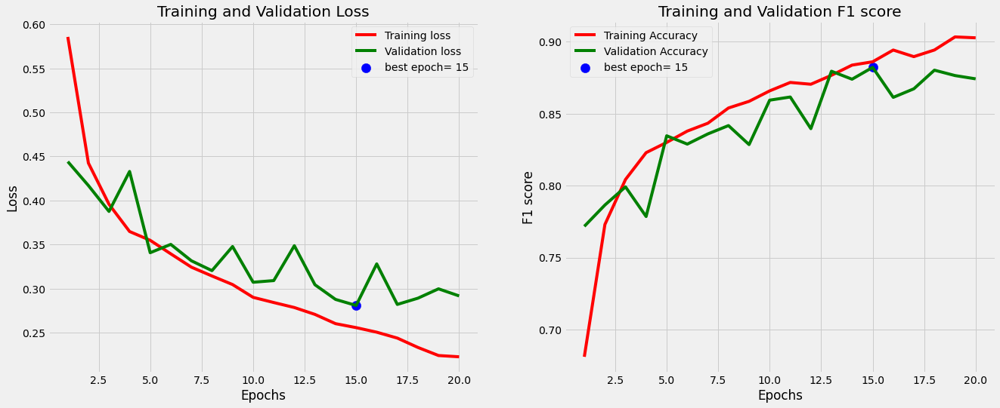

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.88      0.88       507
     EyeSpot       0.88      0.88      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
72/72 [==============================] - 17s 221ms/step - loss: 0.5376 - binary_fbeta: 0.7056 - val_loss: 0.4441 - val_binary_fbeta: 0.7867

Epoch 00001: val_binary_fbeta improved from -inf to 0.78666, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 14s 190ms/step - loss: 0.4061 - binary_fbeta: 0.7950 - val_loss: 0.4241 - val_binary_fbeta: 0.7782

Epoch 00002: val_binary_fbeta did not improve from 0.78666
Epoch 3/20
72/72 [==============================] - 17s 230ms/step - loss: 0.3777 - binary_fbeta: 0.8147 - val_loss: 0

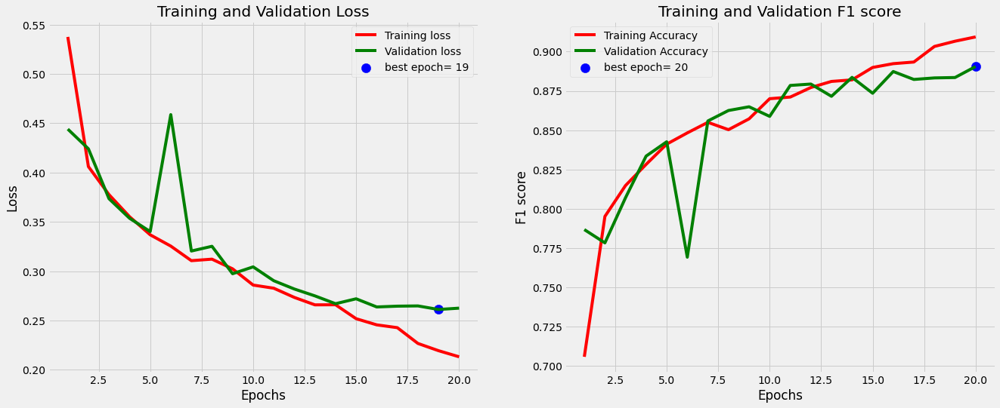

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.90      0.89       507
     EyeSpot       0.90      0.88      0.89       507

   micro avg       0.89      0.89      0.89      1014
   macro avg       0.89      0.89      0.89      1014
weighted avg       0.89      0.89      0.89      1014
 samples avg       0.89      0.89      0.89      1014

Epoch 1/20
72/72 [==============================] - 18s 233ms/step - loss: 0.5481 - binary_fbeta: 0.6965 - val_loss: 0.4518 - val_binary_fbeta: 0.7657

Epoch 00001: val_binary_fbeta improved from -inf to 0.76567, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 16s 220ms/step - loss: 0.4096 - binary_fbeta: 0.7947 - val_loss: 0.3952 - val_binary_fbeta: 0.8137

Epoch 00002: val_binary_fbeta improved from 0.76567 to 0.81369, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 17s 236ms/step - loss: 0.3815 -

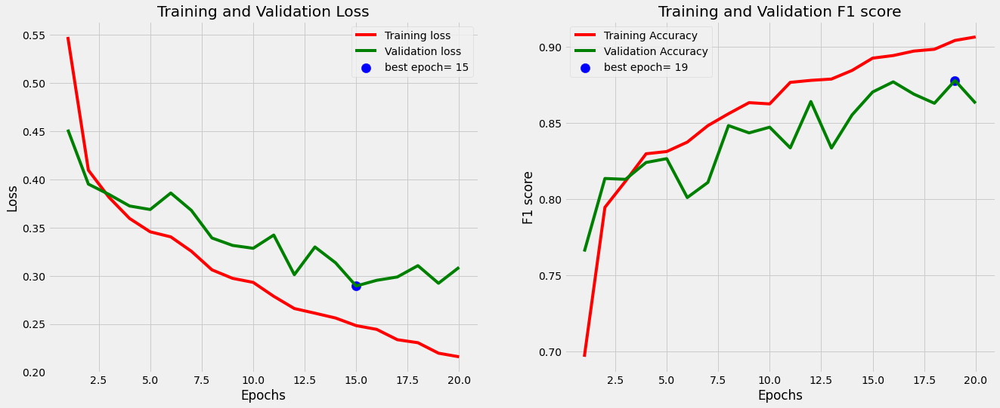

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.91      0.84      0.87       507
     EyeSpot       0.85      0.92      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
72/72 [==============================] - 22s 294ms/step - loss: 0.5182 - binary_fbeta: 0.7194 - val_loss: 0.4387 - val_binary_fbeta: 0.7798

Epoch 00001: val_binary_fbeta improved from -inf to 0.77983, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 27s 381ms/step - loss: 0.4085 - binary_fbeta: 0.7973 - val_loss: 0.4142 - val_binary_fbeta: 0.7761

Epoch 00002: val_binary_fbeta did not improve from 0.77983
Epoch 3/20
72/72 [==============================] - 29s 398ms/step - loss: 0.3732 - binary_fbeta: 0.8177 - val_loss: 0

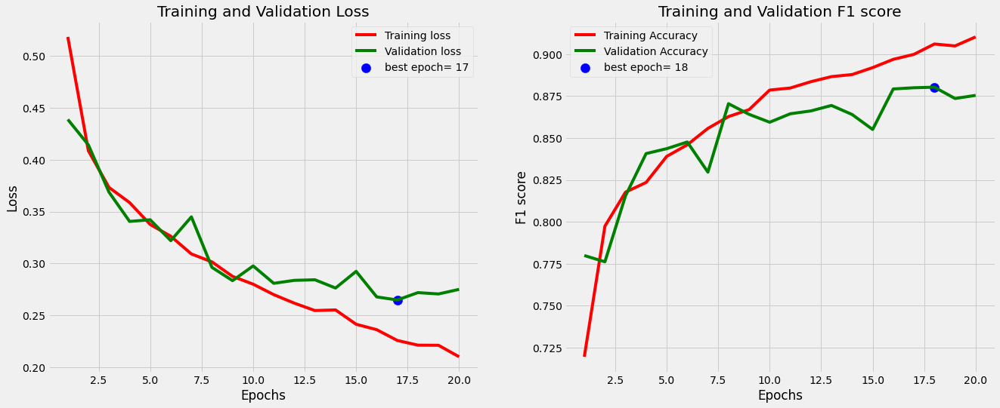

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.88      0.88      0.88       507
     EyeSpot       0.88      0.88      0.88       507

   micro avg       0.88      0.88      0.88      1014
   macro avg       0.88      0.88      0.88      1014
weighted avg       0.88      0.88      0.88      1014
 samples avg       0.88      0.88      0.88      1014

Epoch 1/20
72/72 [==============================] - 31s 395ms/step - loss: 0.5359 - binary_fbeta: 0.7066 - val_loss: 0.4519 - val_binary_fbeta: 0.7559

Epoch 00001: val_binary_fbeta improved from -inf to 0.75591, saving model to best_model.h5
Epoch 2/20
72/72 [==============================] - 29s 403ms/step - loss: 0.4093 - binary_fbeta: 0.8019 - val_loss: 0.3860 - val_binary_fbeta: 0.8057

Epoch 00002: val_binary_fbeta improved from 0.75591 to 0.80571, saving model to best_model.h5
Epoch 3/20
72/72 [==============================] - 29s 398ms/step - loss: 0.3827 -

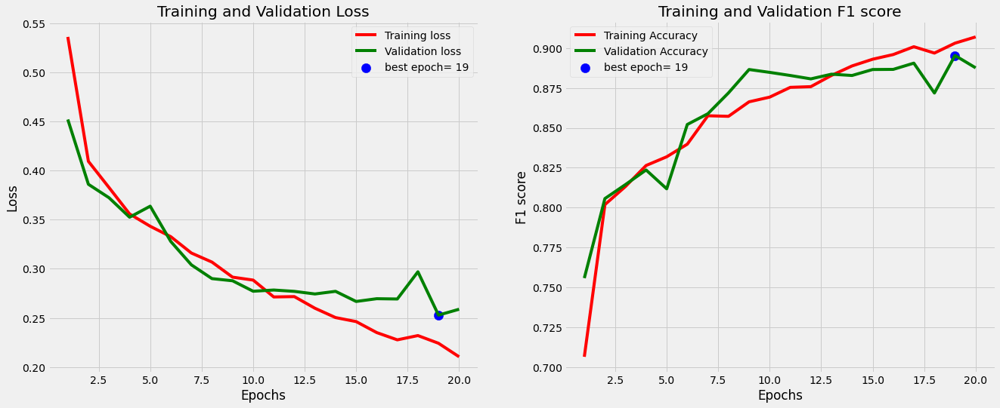

Classification Report:
----------------------
               precision    recall  f1-score   support

        Spot       0.89      0.91      0.90       507
     EyeSpot       0.91      0.88      0.89       507

   micro avg       0.90      0.90      0.90      1014
   macro avg       0.90      0.90      0.90      1014
weighted avg       0.90      0.90      0.90      1014
 samples avg       0.90      0.90      0.90      1014

Model Performance (f1 score) =  0.8820134997367859


In [73]:
batch_size = 128
epochs = 20
patience = 5

f1_scores = []
for i in range(5):
    #Define model
    cnn = Sequential()
    cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30,30, 3),padding='same')) #Convolution layer
    cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
    cnn.add(Dropout(0.3))
    cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
    cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
    cnn.add(Dropout(0.3))
    
    cnn.add(Flatten())
    cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
    cnn.add(Dropout(0.3))
    cnn.add(Dense(2, activation='softmax')) #Output layer
    
    f1score = CNN_model(cnn, x_smotetomek, y_smotetomek, epochs, batch_size, patience)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

## 6. SVM model

In [67]:
def svm_model(x_train_dataset, y_train_dataset):
    
    class_names = ['Spot', 'EyeSpot']
    
    # Normalize the dataset
    #x_train_dataset_n = x_train_dataset / 255.0
    x_train_dataset = x_train_dataset.astype('float32')
    
    # Cross-validation:
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(x_train_dataset)
    
    # Cross-validation:
    Xtrain, Xtest, Ytrain, Ytest = train_test_split(scaled_data.astype('float32'), y_train_dataset, test_size=0.1, stratify = y_train_dataset)
    
    # define support vector classifier
    svm = SVC(kernel='linear', probability=True, max_iter = 400, random_state=1)
    
    # fit model
    svm.fit(Xtrain, Ytrain)
    
    # generate predictions
    y_pred = svm.predict(Xtest)

    f1score = f1_score(Ytest, y_pred)
    
    print(classification_report(Ytest,y_pred, target_names = class_names))
    
    return f1score

In [68]:
f1_scores = []
for i in range(5):
    
    f1score = svm_model(x_smotetomek, y_smotetomek)
    f1_scores.append(f1score)

f1score = np.median(f1_scores)
print("Model Performance (f1 score) = ", f1score)

C:\Users\maria\anaconda3\lib\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=400).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


              precision    recall  f1-score   support

        Spot       0.43      0.34      0.38       507
     EyeSpot       0.45      0.55      0.50       507

    accuracy                           0.44      1014
   macro avg       0.44      0.44      0.44      1014
weighted avg       0.44      0.44      0.44      1014



C:\Users\maria\anaconda3\lib\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=400).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


              precision    recall  f1-score   support

        Spot       0.49      0.34      0.40       507
     EyeSpot       0.49      0.64      0.56       507

    accuracy                           0.49      1014
   macro avg       0.49      0.49      0.48      1014
weighted avg       0.49      0.49      0.48      1014



C:\Users\maria\anaconda3\lib\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=400).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


              precision    recall  f1-score   support

        Spot       0.56      0.50      0.53       507
     EyeSpot       0.55      0.60      0.57       507

    accuracy                           0.55      1014
   macro avg       0.55      0.55      0.55      1014
weighted avg       0.55      0.55      0.55      1014



C:\Users\maria\anaconda3\lib\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=400).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


              precision    recall  f1-score   support

        Spot       0.37      0.31      0.34       507
     EyeSpot       0.40      0.46      0.43       507

    accuracy                           0.39      1014
   macro avg       0.38      0.39      0.38      1014
weighted avg       0.38      0.39      0.38      1014



C:\Users\maria\anaconda3\lib\site-packages\sklearn\svm\_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=400).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(


              precision    recall  f1-score   support

        Spot       0.51      0.39      0.44       507
     EyeSpot       0.51      0.63      0.56       507

    accuracy                           0.51      1014
   macro avg       0.51      0.51      0.50      1014
weighted avg       0.51      0.51      0.50      1014

Model Performance (f1 score) =  0.5586975149957156


## 7. Kmeans Model 

In [69]:
def kmeans_model(x_train_dataset, y_train_dataset):
    
    class_names = ['Spot', 'EyeSpot']
    
    # Cross-validation:
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(x_train_dataset)
    
    kmeans = KMeans(
        init="random",
        n_clusters=2,
        n_init=10,
        max_iter=400,
        random_state=42)
    
    kmeans.fit(scaled_data)
    
    f1score = f1_score(y_train_dataset, kmeans.labels_)
    
    #y_pred = kmeans.predict(scaled_data)

    #f1score = f1_score(y_train_dataset, y_pred)
    
    print(classification_report(y_train_dataset,kmeans.labels_, target_names = class_names))

    return f1score

In [70]:
f1score = kmeans_model(x_smotetomek, y_smotetomek)

print("Model Performance (f1 score) = ", f1score)

              precision    recall  f1-score   support

        Spot       0.39      0.37      0.38      5068
     EyeSpot       0.40      0.42      0.41      5068

    accuracy                           0.40     10136
   macro avg       0.40      0.40      0.40     10136
weighted avg       0.40      0.40      0.40     10136

Model Performance (f1 score) =  0.41130660513412176


### Predictions using the best model: CNN model #2 with Dropout layers 

Epoch 1/20
143/143 [==============================] - 6s 41ms/step - loss: 0.4525 - binary_fbeta: 0.7627 - val_loss: 0.3736 - val_binary_fbeta: 0.8173

Epoch 00001: val_binary_fbeta improved from -inf to 0.81735, saving model to best_model.h5
Epoch 2/20
143/143 [==============================] - 6s 41ms/step - loss: 0.3657 - binary_fbeta: 0.8266 - val_loss: 0.3329 - val_binary_fbeta: 0.8379

Epoch 00002: val_binary_fbeta improved from 0.81735 to 0.83785, saving model to best_model.h5
Epoch 3/20
143/143 [==============================] - 9s 66ms/step - loss: 0.3312 - binary_fbeta: 0.8418 - val_loss: 0.3062 - val_binary_fbeta: 0.8624

Epoch 00003: val_binary_fbeta improved from 0.83785 to 0.86245, saving model to best_model.h5
Epoch 4/20
143/143 [==============================] - 10s 68ms/step - loss: 0.3011 - binary_fbeta: 0.8605 - val_loss: 0.2900 - val_binary_fbeta: 0.8776

Epoch 00004: val_binary_fbeta improved from 0.86245 to 0.87764, saving model to best_model.h5
Epoch 5/20
143/143

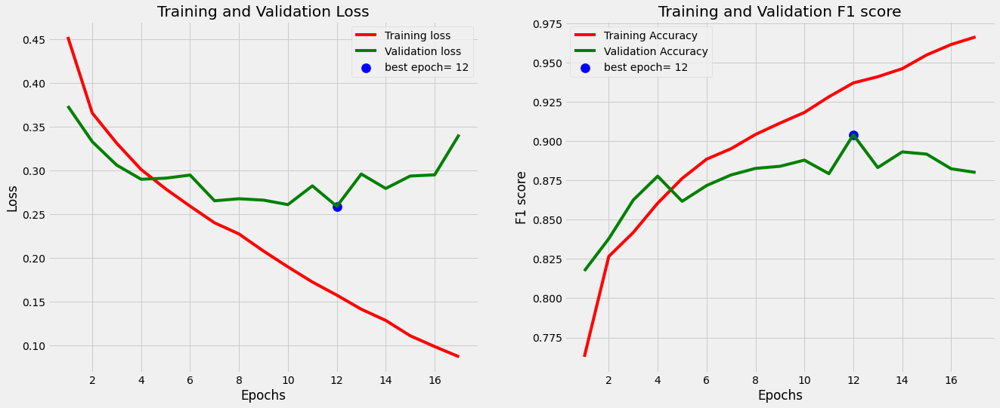

In [126]:
# Load the training set and the test set ---------------------------------------------------------

x_test = np.load('Xtest_Classification1.npy');

# Split train data into train and validation datasets 
Xtrain, Xval, Ytrain, Yval = train_test_split(x_smotetomek, y_smotetomek, test_size=0.1, stratify = y_smotetomek)

#Reshape data
Xtrain_smotetomek = Xtrain.reshape((-1,30, 30, 3))
Xval = Xval.reshape((-1,30, 30, 3))
x_test_CNN = x_test.reshape(-1, 30, 30, 3)

Xtrain_smotetomek = Xtrain_smotetomek.astype('float32')
Xtrain_smotetomek = Xtrain_smotetomek / 255.
Xval = Xval.astype('float32')
Xval= Xval/ 255.
Xtest = x_test_CNN.astype('float32')
Xtest = Xtest/255.

# Change Y format to one-hot-encoding
Ytrain_smotetomek = to_categorical(Ytrain)
Yval = to_categorical(Yval)

#Define parameters -----------------------------------------------------------------------------
batch_size = 64
epochs = 20
patience = 5

# Define model
cnn = Sequential()
cnn.add(Conv2D(32, kernel_size=(3, 3),activation=LeakyReLU(alpha=0.1),input_shape=(30,30,3),padding='same')) #Convolution layer
cnn.add(MaxPooling2D((2, 2),padding='same')) #Pooling layer
cnn.add(Conv2D(64, (3, 3), activation=LeakyReLU(alpha=0.1),padding='same'))
cnn.add(MaxPooling2D(pool_size=(2, 2),padding='same'))

cnn.add(Flatten())
cnn.add(Dense(128, activation=LeakyReLU(alpha=0.1))) #Fully connected layer
cnn.add(Dropout(0.3))
cnn.add(Dense(2, activation='softmax')) #Output layer

# Define callbacks  
es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=patience)
    
mc = tf.keras.callbacks.ModelCheckpoint('best_model.h5', monitor='val_binary_fbeta', mode='max', verbose=1, save_best_only=True)
    
cnn.compile(loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False), optimizer=keras.optimizers.Adam(),metrics=[binary_fbeta])

train = cnn.fit(Xtrain_smotetomek, Ytrain_smotetomek, batch_size=batch_size, epochs=epochs, verbose = 1, callbacks=[es, mc], validation_data=(Xval, Yval))
    
saved_model = load_model('best_model.h5', custom_objects={"binary_fbeta": binary_fbeta})

valloss, valf1score = saved_model.evaluate(Xval,  Yval, verbose=0)

print('\nVal f1 score:', valf1score)
    
# ---------- plot learning curves:
# Plot the training and validation data
tacc=train.history['binary_fbeta']
tloss=train.history['loss']
vacc=train.history['val_binary_fbeta']
vloss=train.history['val_loss']
    
index_loss=np.argmin(vloss)#  this is the epoch with the lowest validation loss
val_lowest=vloss[index_loss]
index_acc=np.argmax(vacc)
acc_highest=vacc[index_acc]
    
plt.style.use('fivethirtyeight')
sc_label='best epoch= '+ str(index_loss+1)
vc_label='best epoch= '+ str(index_acc + 1)
    
fig,axes=plt.subplots(nrows=1, ncols=2, figsize=(20,8))
axes[0].plot(np.arange(1, len(tloss)+1), tloss, 'r', label='Training loss')
axes[0].plot(np.arange(1, len(vloss)+1), vloss,'g',label='Validation loss' )
axes[0].scatter(index_loss+1,val_lowest, s=150, c= 'blue', label=sc_label)
axes[0].set_title('Training and Validation Loss')
axes[0].set_xlabel('Epochs')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[1].plot (np.arange(1, len(tacc)+1), tacc,'r',label= 'Training Accuracy')
axes[1].plot (np.arange(1, len(vacc)+1), vacc,'g',label= 'Validation Accuracy')
axes[1].scatter(index_acc+1,acc_highest, s=150, c= 'blue', label=vc_label)
axes[1].set_title('Training and Validation F1 score')
axes[1].set_xlabel('Epochs')
axes[1].set_ylabel('F1 score')
axes[1].legend()
plt.tight_layout
plt.show()
# -------------------

In [129]:
# predicting the testing set
binary_ypred = saved_model.predict(Xtest)

y_test = []

for i in range(len(binary_ypred)):
    y_test.append(np.argmax(binary_ypred[i]))

print(y_test)

[0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 

In [130]:
np.save('y_test.npy', y_test)
print(np.shape(y_test))

(1367,)
